# Saturating Removal Model Tutorial
## From longitudinal p16-luciferase data to stochastic model selection
## 从 p16-luciferase 纵向数据到随机模型筛选

**Research question.** Which combination of senescent-cell production
and removal mechanisms best explains repeated measurements from the
same mice, and what can that mechanism tell us about aging dynamics?

**研究问题。** 哪一种衰老细胞产生与清除机制的组合最能解释同一批小鼠的
重复测量？这个机制又能告诉我们哪些衰老动力学信息？

The notebook is a methods-oriented independent refit of
[Karin et al. (2019)](https://www.nature.com/articles/s41467-019-13192-4).
It reconstructs the official data, fits all 16 circuits by stochastic
simulation, and keeps paper values only as external references.

本 notebook 是对 Karin 等人 2019 年研究的方法导向型独立重拟合。它从
官方数据重建分析，用随机模拟拟合全部 16 个 circuit；论文数值只作为
外部参照，不会被写进教程的拟合结果。


In [1]:
from __future__ import annotations

import hashlib
import importlib.metadata as importlib_metadata
import itertools
import json
import math
import os
import sys
import time
import urllib.request
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from openpyxl import load_workbook
from scipy.special import ndtr
from scipy.optimize import minimize
from scipy.stats import qmc

if "get_ipython" in globals() and get_ipython() is not None:
    get_ipython().run_line_magic("matplotlib", "inline")

plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams.update({
    "figure.figsize": (16, 9),
    "figure.dpi": 110,
    "font.family": "sans-serif",
    "font.sans-serif": [
        "PingFang SC",
        "Arial Unicode MS",
        "Hiragino Sans GB",
        "DejaVu Sans",
    ],
    "font.size": 24,
    "lines.linewidth": 5,
    "axes.titlesize": 28,
    "axes.labelsize": 24,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "legend.fontsize": 24,
    "figure.titlesize": 30,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.titleweight": 600,
    "axes.unicode_minus": False,
})

EXPECTED_ENV = "srmodel_tutorial"
ACTIVE_ENV = os.environ.get("CONDA_DEFAULT_ENV") or Path(sys.prefix).name
if ACTIVE_ENV != EXPECTED_ENV:
    warnings.warn(
        (
            f"Expected Conda environment '{EXPECTED_ENV}', "
            f"found '{ACTIVE_ENV}'. "
            f"期望环境为 '{EXPECTED_ENV}'，当前为 '{ACTIVE_ENV}'。"
        ),
        RuntimeWarning,
    )

environment_audit = pd.DataFrame({
    "check": [
        "Conda environment",
        "Python executable",
        "Python",
        "NumPy",
        "pandas",
        "Matplotlib",
        "OpenPyXL",
        "SciPy",
    ],
    "value": [
        ACTIVE_ENV,
        sys.executable,
        sys.version.split()[0],
        importlib_metadata.version("numpy"),
        importlib_metadata.version("pandas"),
        importlib_metadata.version("matplotlib"),
        importlib_metadata.version("openpyxl"),
        importlib_metadata.version("scipy"),
    ],
})
python_is_311 = sys.version_info[:2] == (3, 11)
environment_is_expected = ACTIVE_ENV == EXPECTED_ENV
print(
    "Environment check | 环境检查:",
    "ready | 已就绪"
    if python_is_311 and environment_is_expected
    else "review warnings above | 请检查上方警告",
)
environment_audit

RANDOM_SEED = 2019
DAYS_PER_YEAR = 365.25
TRANSITION_LL_FLOOR = -15.0
SOURCE_URL = (
    "https://static-content.springer.com/esm/"
    "art%3A10.1038%2Fs41467-019-13192-4/MediaObjects/"
    "41467_2019_13192_MOESM4_ESM.xlsx"
)
DATA_PATH = Path("data/karin_2019_source_data.xlsx")
EXPECTED_SHA256 = "c478154efc10bc8b13cfd5dd4b0813bebc3e31f7fb1c86a3d111d4ae17339a5e"

USE_CACHE = True
FORMAL_CONFIGURATION = "formal"
SEARCH_CONFIG = {
    "coarse_points": 256,
    "coarse_paths": 256,
    "coarse_dt": 4.0,
    "medium_starts": 4,
    "medium_paths": 800,
    "medium_dt": 2.0,
    "medium_maxfev": 60,
    "high_paths": 2000,
    "high_dt": 1.0,
    "high_maxfev": 35,
    "boundary_anchor_maxfev": 80,
    "final_paths": 4000,
    "final_dt": 1.0,
    "bootstrap_replicates": 100,
    "bootstrap_medium_maxfev": 30,
    "bootstrap_high_maxfev": 15,
}
print("Formal configuration | 正式配置:", SEARCH_CONFIG)


Environment check | 环境检查: review warnings above | 请检查上方警告
Formal configuration | 正式配置: {'coarse_points': 256, 'coarse_paths': 256, 'coarse_dt': 4.0, 'medium_starts': 4, 'medium_paths': 800, 'medium_dt': 2.0, 'medium_maxfev': 60, 'high_paths': 2000, 'high_dt': 1.0, 'high_maxfev': 35, 'boundary_anchor_maxfev': 80, 'final_paths': 4000, 'final_dt': 1.0, 'bootstrap_replicates': 100, 'bootstrap_medium_maxfev': 30, 'bootstrap_high_maxfev': 15}


/var/folders/q2/_j88jwh12fz2_80_r7r7hy3c0000gn/T/ipykernel_85474/4197268035.py:54: RuntimeWarning: Expected Conda environment 'srmodel_tutorial', found 'base'. 期望环境为 'srmodel_tutorial'，当前为 'base'。
  warnings.warn(


## Technical route: three data sources, three roles
## 技术路线：三类数据，三种用途

The paper workbook contains three distinct kinds of data.
The main longitudinal measurements are fitted directly. The clearance
experiment is an independent biological check. Mortality data require
a separate parameter set and an additional threshold hypothesis.

论文工作簿包含三类用途不同的数据。纵向重复测量直接用于模型
拟合；清除实验用于独立生物学检验；死亡率数据使用单独参数，并额外引入
阈值假设。

Follow each horizontal lane from left to right. A dashed
arrow means “compare with,” not “use the same observations to fit.”

每条横向路线从左向右阅读。虚线箭头表示“进行比较”，不表示
使用同一批观测完成拟合。


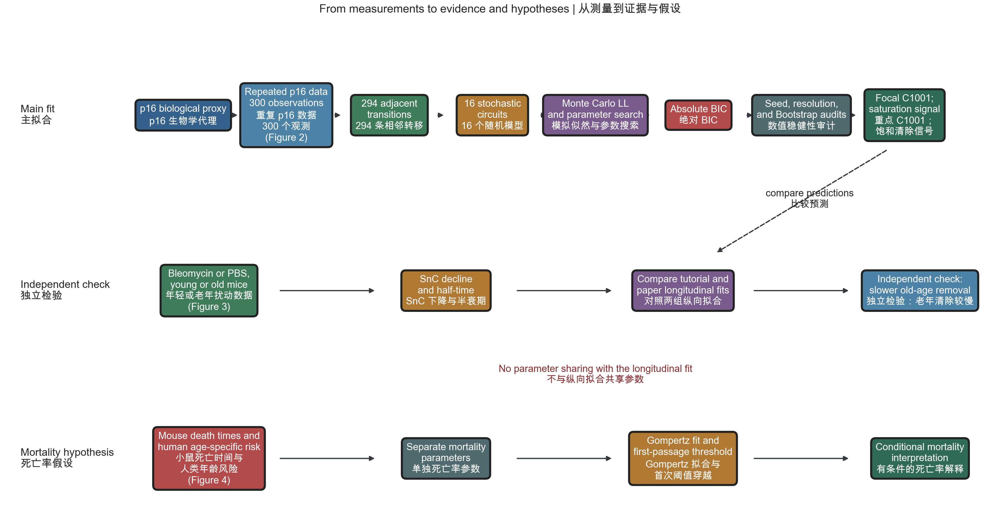

In [2]:
def _route_box(ax, x, y, text, color):
    """
    Purpose: Draw one bilingual node in a technical-route figure.
    Parameters: Axes, node coordinates, label text, and fill color.
    Returns: The Matplotlib text artist.
    Units: Axes coordinates only.
    Assumptions: Labels are already ordered in the teaching sequence.
    中文说明：在技术路线图中绘制一个双语节点。
    """
    return ax.text(
        x,
        y,
        text,
        ha="center",
        va="center",
        fontsize=24,
        color="white",
        fontweight=600,
        linespacing=1.25,
        bbox={
            "boxstyle": "round,pad=0.46",
            "facecolor": color,
            "edgecolor": "#222222",
            "linewidth": 5,
        },
        zorder=3,
    )


def _route_arrow(ax, start, end, linestyle="-"):
    """
    Purpose: Connect two route nodes with a directional arrow.
    Parameters: Axes, start and end coordinates, and line style.
    Returns: The Matplotlib annotation artist.
    Units: Axes coordinates only.
    Assumptions: Arrow direction follows notebook execution or comparison.
    中文说明：用箭头连接技术路线节点；虚线表示比较而非共同拟合。
    """
    return ax.annotate(
        "",
        xy=end,
        xytext=start,
        arrowprops={
            "arrowstyle": "-|>",
            "color": "#343A40",
            "lw": 3,
            "linestyle": linestyle,
            "shrinkA": 8,
            "shrinkB": 8,
        },
        zorder=2,
    )


def draw_three_branch_route():
    """
    Purpose: Draw the complete three-branch evidence route.
    Parameters: None.
    Returns: A Matplotlib figure and axes.
    Units: Not applicable.
    Assumptions: Figure 2 is fitted; Figures 3 and 4 have distinct roles.
    中文说明：绘制纵向拟合、独立清除检验和死亡率假设三条完整路线。
    """
    main_nodes = [
        "p16 biological proxy\np16 生物学代理",
        "Repeated p16 data\n300 observations\n重复 p16 数据\n300 个观测\n(Figure 2)",
        "294 adjacent\ntransitions\n294 条相邻转移",
        "16 stochastic\ncircuits\n16 个随机模型",
        "Monte Carlo LL\nand parameter search\n模拟似然与参数搜索",
        "Absolute BIC\n绝对 BIC",
        "Seed, resolution,\nand Bootstrap audits\n数值稳健性审计",
        "Focal C1001;\nsaturation signal\n重点 C1001；\n饱和清除信号",
    ]
    clearance_nodes = [
        "Bleomycin or PBS,\nyoung or old mice\n年轻或老年扰动数据\n(Figure 3)",
        "SnC decline\nand half-time\nSnC 下降与半衰期",
        "Compare tutorial and\npaper longitudinal fits\n对照两组纵向拟合",
        "Independent check:\nslower old-age removal\n独立检验：老年清除较慢",
    ]
    mortality_nodes = [
        "Mouse death times and\nhuman age-specific risk\n小鼠死亡时间与\n人类年龄风险\n(Figure 4)",
        "Separate mortality\nparameters\n单独死亡率参数",
        "Gompertz fit and\nfirst-passage threshold\nGompertz 拟合与\n首次阈值穿越",
        "Conditional mortality\ninterpretation\n有条件的死亡率解释",
    ]
    palette = [
        "#35618D", "#4E83A8", "#3F7D5A", "#B07A35",
        "#7A5B8E", "#B34B4B", "#4F6B70", "#2F6B55",
    ]
    fig, ax = plt.subplots(figsize=(34, 18), layout="constrained")
    ax.set_xlim(-1.75, 7.9)
    ax.set_ylim(-0.45, 2.85)
    ax.axis("off")

    ax.text(
        -1.58, 2.25, "Main fit\n主拟合", fontsize=26,
        fontweight=600, va="center", ha="left",
    )
    for index, text in enumerate(main_nodes):
        _route_box(ax, index, 2.25, text, palette[index])
        if index:
            _route_arrow(ax, (index - 0.56, 2.25), (index - 0.44, 2.25))

    side_x = [0.25, 2.55, 4.85, 7.15]
    ax.text(
        -1.58, 1.10, "Independent check\n独立检验", fontsize=26,
        fontweight=600, va="center", ha="left",
    )
    for index, (x_value, text) in enumerate(zip(side_x, clearance_nodes)):
        _route_box(ax, x_value, 1.10, text, palette[[2, 3, 4, 1][index]])
        if index:
            _route_arrow(
                ax,
                (side_x[index - 1] + 0.66, 1.10),
                (x_value - 0.66, 1.10),
            )
    _route_arrow(ax, (6.85, 2.03), (5.15, 1.34), linestyle="--")
    ax.text(
        6.08, 1.70,
        "compare predictions\n比较预测",
        fontsize=24, ha="center", va="center",
    )

    ax.text(
        -1.58, 0.00, "Mortality hypothesis\n死亡率假设", fontsize=26,
        fontweight=600, va="center", ha="left",
    )
    for index, (x_value, text) in enumerate(zip(side_x, mortality_nodes)):
        _route_box(ax, x_value, 0.00, text, palette[[5, 6, 3, 7][index]])
        if index:
            _route_arrow(
                ax,
                (side_x[index - 1] + 0.66, 0.00),
                (x_value - 0.66, 0.00),
            )
    ax.text(
        4.0,
        0.55,
        "No parameter sharing with the longitudinal fit\n"
        "不与纵向拟合共享参数",
        fontsize=24,
        ha="center",
        va="center",
        color="#8E2F2F",
        fontweight=600,
    )
    ax.set_title(
        "From measurements to evidence and hypotheses | 从测量到证据与假设",
        pad=28,
    )
    return fig, ax


def draw_ordered_route(nodes, title, subtitle):
    """
    Purpose: Draw a numbered local route in exact notebook order.
    Parameters: Bilingual node labels, title, and bilingual subtitle.
    Returns: A Matplotlib figure and axes.
    Units: Not applicable.
    Assumptions: Nodes are supplied in execution order.
    中文说明：按 notebook 的实际执行顺序绘制编号局部路线。
    """
    vertical_gap = 1.75
    positions = [
        (0.0, (len(nodes) - 1 - index) * vertical_gap)
        for index in range(len(nodes))
    ]

    fig, ax = plt.subplots(
        figsize=(24, max(13, 2.75 * len(nodes))),
        layout="constrained",
    )
    ax.set_xlim(-4.7, 4.7)
    ax.set_ylim(-1.25, max(y for _, y in positions) + 1.25)
    ax.axis("off")
    colors = [
        "#35618D", "#4E83A8", "#3F7D5A",
        "#B07A35", "#7A5B8E", "#B34B4B",
        "#4F6B70", "#2F6B55", "#8B5E3C",
    ]
    for index, ((x_value, y_value), node) in enumerate(
        zip(positions, nodes), start=1
    ):
        _route_box(
            ax,
            x_value,
            y_value,
            f"{index}. {node}",
            colors[(index - 1) % len(colors)],
        )
        if index > 1:
            previous_x, previous_y = positions[index - 2]
            _route_arrow(
                ax,
                (previous_x, previous_y - 0.58),
                (x_value, y_value + 0.58),
            )
    ax.set_title(title, pad=26)
    ax.text(
        0.0,
        -0.95,
        subtitle,
        fontsize=24,
        ha="center",
        va="center",
    )
    return fig, ax


draw_three_branch_route()
plt.show()


## How to work with the notebook
## 如何使用本 notebook

1. Run cells from top to bottom with **Shift+Enter**.
2. In each micro-lab, first make a prediction.
3. Edit only values under `# EDIT HERE | 只修改这里`.
4. Run the cell again and read the table or figure before changing
   another value.
5. Restore the displayed defaults whenever you want to return to the
   documented result.
#
1. 使用 **Shift+Enter** 从上到下运行单元。
2. 每个微实验先做预测，再运行。
3. 只修改 `# EDIT HERE | 只修改这里` 下的变量。
4. 每次只改变一项，先读完表格或图片再继续。
5. 想恢复正式结果时，把变量改回默认值并重新运行。

An **observation** is one recorded measurement. A **sample** is the
collection available for analysis. A **model** is a simplified
description, and a **parameter estimate** is a number learned from the
data rather than a known truth.

**观测**是一条实际记录；**样本**是当前可分析的观测集合；**模型**是对
过程的简化描述；**参数估计值**是从数据中推断出的数值，并非已知真值。


# Part I. Biology and data before modeling
# 第一部分：先理解生物学与数据

## 1. Why can p16 report senescent-cell burden?
## 1. 为什么 p16 可以表征衰老细胞负荷？

Cellular senescence is a durable state in which a damaged or stressed
cell stops dividing. p16^INK4a inhibits CDK4 and CDK6. This helps keep
the retinoblastoma protein, Rb, in its growth-suppressing state, so the
cell cannot readily pass the G1-to-S cell-cycle checkpoint. High p16 is
therefore biologically connected to stable cell-cycle arrest.

细胞衰老是一种较持久的状态：受损或受压细胞停止分裂。p16^INK4a 抑制
CDK4 和 CDK6，使 Rb 蛋白维持抑制细胞增殖的状态，细胞因而难以通过
G1 到 S 期检查点。p16 升高因此与稳定的细胞周期停滞存在明确的生物学联系。

In the p16-luciferase mouse, activation of the endogenous p16 locus
drives luciferase. After luciferin is administered, luciferase produces
light. Whole-body light is measured repeatedly without sacrificing the
mouse, which makes longitudinal tracking possible. Burd et al. showed
that this reporter follows endogenous p16 expression and rises with age.
Karin et al. then used total-body luminescence as a longitudinal proxy
for senescent-cell abundance.

在 p16-luciferase 小鼠中，内源 p16 位点激活会同时驱动 luciferase。
注射 luciferin 后产生发光，因此可以在不处死小鼠的情况下反复测量全身
信号。Burd 等人验证了该报告系统能反映内源 p16 表达并随年龄上升；
Karin 等人随后把全身发光强度作为衰老细胞丰度的纵向代理指标。

**Important boundary.** p16 is not unique to every senescent cell, and
not every p16-positive cell is interchangeable. Wounds, tumors, tissue
composition, and reporter genetics can alter the signal. Biran et al.
therefore emphasized combining several markers when identifying
senescence at single-cell resolution. In this tutorial, $X$ means a
normalized **p16-luciferase proxy**, not a literal whole-body cell count
and not a universal measure of biological age.

**重要边界。** p16 不是所有衰老细胞都必然表达的唯一标记，p16 阳性细胞
也并非完全等价。伤口、肿瘤、组织组成和报告基因结构都可能影响信号。
Biran 等人因此强调，在单细胞层面识别衰老时应联合多个标记。本教程中的
$X$ 是归一化的 **p16-luciferase 代理量**，不是全身衰老细胞的绝对计数，
也不是通用的生物年龄刻度。

**Sources**

- [Karin et al., 2019](https://www.nature.com/articles/s41467-019-13192-4)
- [Burd et al., 2013](https://doi.org/10.1016/j.cell.2012.12.010)
- [Biran et al., 2017](https://doi.org/10.1111/acel.12592)


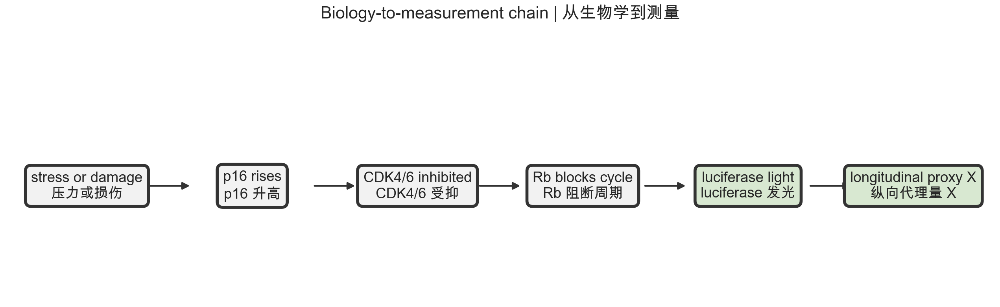

In [3]:
def draw_p16_measurement_chain():
    """
    Purpose: Visualize how p16 regulation becomes a longitudinal number.
    Parameters: None.
    Returns: A Matplotlib figure and axes.
    Units: The final signal is total-body luminescence.
    Assumptions: The signal is a proxy and can have non-senescence sources.
    中文说明：展示 p16 调控如何转化为纵向测量值；最终信号是代理量。
    """
    labels = [
        "stress or damage\n压力或损伤",
        "p16 rises\np16 升高",
        "CDK4/6 inhibited\nCDK4/6 受抑",
        "Rb blocks cycle\nRb 阻断周期",
        "luciferase light\nluciferase 发光",
        "longitudinal proxy X\n纵向代理量 X",
    ]
    fig, ax = plt.subplots(figsize=(23, 7), layout="constrained")
    ax.set_xlim(-0.5, 5.5)
    ax.set_ylim(-0.6, 0.8)
    ax.axis("off")
    for index, label in enumerate(labels):
        ax.text(
            index, 0, label,
            ha="center", va="center", fontsize=24,
            bbox={
                "boxstyle": "round,pad=0.4",
                "facecolor": "#F2F2F2" if index < 4 else "#D8E8D1",
                "edgecolor": "#333333",
                "linewidth": 5,
            },
        )
        if index < len(labels) - 1:
            ax.annotate(
                "", xy=(index + 0.63, 0), xytext=(index + 0.37, 0),
                arrowprops={"arrowstyle": "-|>", "lw": 3, "color": "#333333"},
            )
    ax.set_title(
        "Biology-to-measurement chain | 从生物学到测量",
        pad=20,
    )
    return fig, ax


draw_p16_measurement_chain()
plt.show()


### Part I route: from biological signal to an analysis table
### 第一部分路线：从生物学信号到分析表

Every step changes the representation of the data, not the
underlying measurements. The route ends with quantities students can
inspect directly before any candidate model is fitted.

每一步只改变数据的组织方式，不改变原始测量。该路线最终得到
学生可以直接检查的轨迹、缺失情况以及均值和样本 SD，此时尚未拟合候选模型。


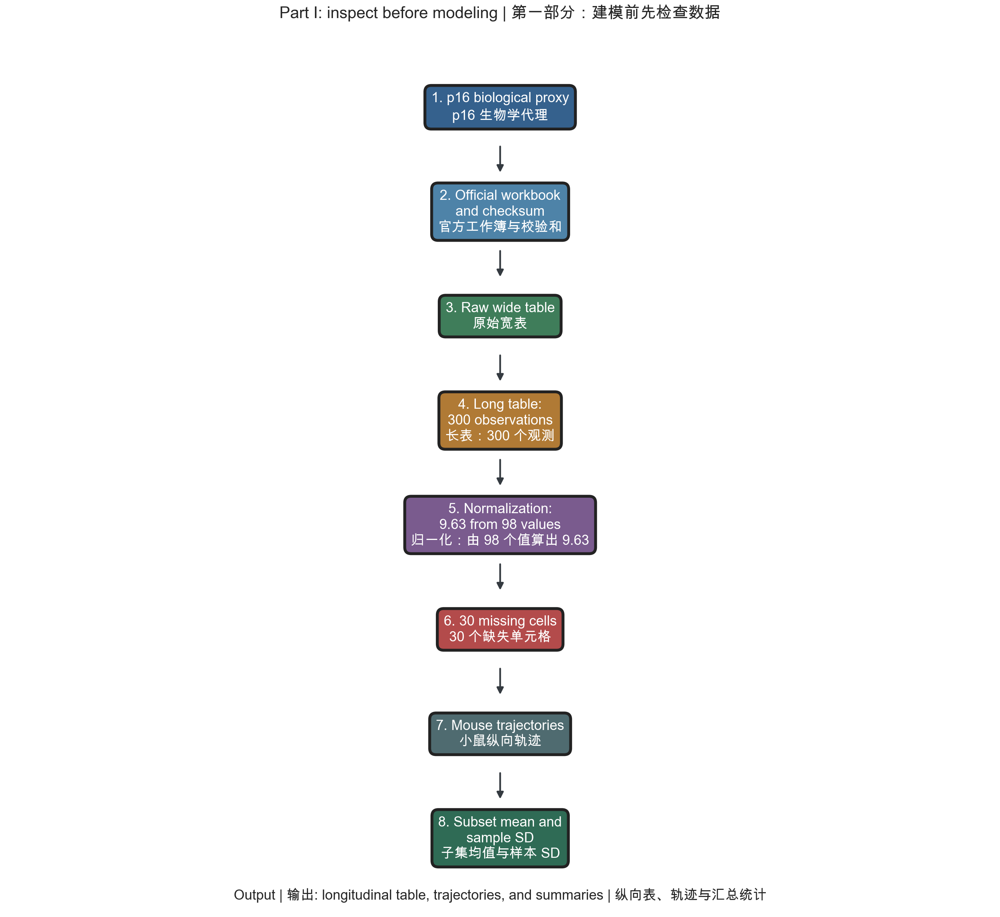

In [4]:
part_one_route = [
    "p16 biological proxy\np16 生物学代理",
    "Official workbook\nand checksum\n官方工作簿与校验和",
    "Raw wide table\n原始宽表",
    "Long table:\n300 observations\n长表：300 个观测",
    "Normalization:\n9.63 from 98 values\n归一化：由 98 个值算出 9.63",
    "30 missing cells\n30 个缺失单元格",
    "Mouse trajectories\n小鼠纵向轨迹",
    "Subset mean and\nsample SD\n子集均值与样本 SD",
]
draw_ordered_route(
    part_one_route,
    "Part I: inspect before modeling | 第一部分：建模前先检查数据",
    "Output | 输出: longitudinal table, trajectories, and summaries | "
    "纵向表、轨迹与汇总统计",
)
plt.show()


## 2. Read the official workbook before reshaping it
## 2. 先查看官方工作簿，再整理数据

**Function card | 函数说明卡**

- `sha256(path)` computes a digital fingerprint of a file.
- `ensure_source_data(path)` downloads only when the local file is
  missing, then checks the fingerprint.
- `load_nonempty_cells(path, sheet_names)` reads recorded worksheet
  cells with OpenPyXL.
- These functions do not normalize, impute, or fit anything.
#
- `sha256(path)` 计算文件的数字指纹。
- `ensure_source_data(path)` 仅在本地缺失时下载，并核对指纹。
- `load_nonempty_cells(path, sheet_names)` 使用 OpenPyXL 读取非空单元格。
- 这些函数不会归一化、填补缺失值或拟合模型。

Example | 调用示例：`source_cells = load_nonempty_cells(source_path, ["Figure2"])`


In [5]:
def sha256(path: Path) -> str:
    '''
    Purpose: Compute the SHA-256 fingerprint of one local file.
    Parameters: path, the file to read.
    Returns: A 64-character hexadecimal digest.
    Units: Not applicable.
    Assumptions: The file is readable and is not modified during reading.
    中文说明：计算本地文件的 SHA-256 数字指纹，用于确认数据版本。
    '''
    digest = hashlib.sha256()
    with path.open("rb") as handle:
        for chunk in iter(lambda: handle.read(1024 * 1024), b""):
            digest.update(chunk)
    return digest.hexdigest()


def ensure_source_data(path: Path = DATA_PATH) -> Path:
    '''
    Purpose: Obtain and verify the official Karin et al. Source Data file.
    Parameters: path, the intended local XLSX location.
    Returns: The verified local Path.
    Units: File bytes.
    Assumptions: A missing file may be downloaded from the official URL.
    中文说明：在缺失时下载官方工作簿，并用校验和验证文件未被替换。
    '''
    path.parent.mkdir(parents=True, exist_ok=True)
    if not path.exists():
        print(f"Downloading official Source Data to {path} ...")
        urllib.request.urlretrieve(SOURCE_URL, path)
    actual = sha256(path)
    if actual != EXPECTED_SHA256:
        raise ValueError(
            f"Checksum mismatch: expected {EXPECTED_SHA256}, got {actual}"
        )
    print(f"Verified {path} ({path.stat().st_size:,} bytes)")
    return path


def load_nonempty_cells(path: Path, sheet_names: list[str]):
    '''
    Purpose: Read non-empty cells from selected XLSX worksheets.
    Parameters: path and a list of worksheet names.
    Returns: Nested dictionaries addressed by worksheet and A1 coordinate.
    Units: Values retain the workbook units.
    Assumptions: Worksheet names exist; formulas are read as stored values.
    中文说明：用 OpenPyXL 读取指定工作表的非空单元格，不做归一化或拟合。
    '''
    workbook = load_workbook(path, read_only=True, data_only=True)
    try:
        return {
            name: {
                cell.coordinate: cell.value
                for row in workbook[name].iter_rows()
                for cell in row
                if cell.value is not None
            }
            for name in sheet_names
        }
    finally:
        workbook.close()


source_path = ensure_source_data()
sheet_names = ["Figure2", "Figure3", "Figure4", "SupplementaryFigure2"]
source_cells = load_nonempty_cells(source_path, sheet_names)
print("Loaded sheets:", ", ".join(source_cells))


Verified data/karin_2019_source_data.xlsx (22,545 bytes)
Loaded sheets: Figure2, Figure3, Figure4, SupplementaryFigure2


### The raw structure of `Figure2`
### `Figure2` 原始结构

A **wide table** stores one mouse per row and one scheduled week per
column. Looking at it first prevents the reshaping step from becoming a
black box. The next cell reports the sheet dimensions, column meanings,
headers, first five mouse rows, and Python data types.

**宽表**把一只小鼠放在一行，把每个计划周龄放在一列。先看清原始结构，
可以避免后续 reshape 变成黑箱。下一单元会显示工作表尺寸、列含义、
周龄表头、前五只小鼠和 Python 数据类型。


In [6]:
workbook = load_workbook(source_path, read_only=True, data_only=True)
figure2_sheet = workbook["Figure2"]
raw_rows = list(
    figure2_sheet.iter_rows(
        min_row=2, max_row=7, min_col=2, max_col=12, values_only=True
    )
)
workbook.close()

raw_headers = ["mouse_id", *[f"week_{int(value)}" for value in raw_rows[0][1:]]]
figure2_preview = pd.DataFrame(raw_rows[1:], columns=raw_headers)
figure2_structure = pd.DataFrame({
    "item": [
        "sheet",
        "rows including title and header",
        "columns including blank column A",
        "mouse rows",
        "scheduled week columns",
    ],
    "value": ["Figure2", 35, 12, 33, 10],
})
print("Raw worksheet structure | 原始工作表结构")
print(figure2_structure.to_string(index=False))
print("\nFirst five mouse rows | 前五只小鼠")
print(figure2_preview.to_string(index=False))
#print("\nColumn data types | 列数据类型")
#print(figure2_preview.dtypes.astype(str).to_string())
#figure2_preview


Raw worksheet structure | 原始工作表结构
                            item   value
                           sheet Figure2
 rows including title and header      35
columns including blank column A      12
                      mouse rows      33
          scheduled week columns      10

First five mouse rows | 前五只小鼠
 mouse_id    week_8   week_16  week_24   week_32   week_40  week_48   week_56  week_64  week_72  week_80
        0  6.880187  6.663267 4.382247 10.506230 29.688420 7.503507 20.201760 20.00000     16.9 18.50000
        1  0.867369  4.805207 5.412074  7.217918  8.321738 2.637419 13.605360 75.50000     28.7 35.55802
        2 10.758370  1.107452      NaN  0.705358       NaN 4.082731  2.894531 47.20000      NaN      NaN
        3 10.367000  6.859559 2.691946  4.385500  9.135130 4.736481 14.979320 18.23313     25.3 30.87502
        4  6.921979 10.894970 4.488170       NaN       NaN      NaN       NaN      NaN      NaN      NaN


## 3. Convert the wide table to observations and normalize
## 3. 把宽表转换为观测，并完成归一化

The analysis table uses one row per observation:

| column | meaning | 中文 |
|---|---|---|
| `mouse_id` | mouse identity | 小鼠编号 |
| `week` | scheduled age | 计划周龄 |
| `age_years` | age converted with 365.25 days per year | 换算为 year 的年龄 |
| `TBL` | raw total-body luminescence | 原始全身发光强度 |
| `X` | normalized p16-luciferase proxy | 归一化代理量 |

Following the paper, the scale is calculated rather than typed:

$$
c_{\mathrm{young}}
=\operatorname{round}\!\left(
\operatorname{mean}(\mathrm{TBL}_{8,16,24}),2\right),
\qquad X=\frac{\mathrm{TBL}}{c_{\mathrm{young}}}.
$$

按论文口径，把第 8、16、24 周全部可用 TBL 合并后求均值，再保留
两位小数。


In [7]:
fig2 = source_cells["Figure2"]
week_columns = list("CDEFGHIJKL")
scheduled_weeks = [int(fig2[f"{column}2"]) for column in week_columns]

records = []
for row in range(3, 36):
    mouse_id = int(fig2[f"B{row}"])
    for column, week in zip(week_columns, scheduled_weeks):
        value = fig2.get(f"{column}{row}")
        if value is not None:
            records.append({
                "mouse_id": mouse_id,
                "week": week,
                "age_years": week * 7.0 / DAYS_PER_YEAR,
                "TBL": float(value),
            })

longitudinal = (
    pd.DataFrame(records)
    .sort_values(["mouse_id", "week"])
    .reset_index(drop=True)
)
YOUNG_WEEKS = scheduled_weeks[:3]
young_tbl = longitudinal.loc[
    longitudinal["week"].isin(YOUNG_WEEKS), "TBL"
]
TBL_SCALE_UNROUNDED = float(young_tbl.mean())
TBL_SCALE = round(TBL_SCALE_UNROUNDED, 2)
longitudinal["X"] = longitudinal["TBL"] / TBL_SCALE

assert longitudinal["mouse_id"].nunique() == 33
assert len(longitudinal) == 300
assert len(young_tbl) == 98
assert np.isclose(TBL_SCALE_UNROUNDED, 9.634681428571422)
assert TBL_SCALE == 9.63

data_audit = pd.DataFrame({
    "quantity": [
        "mice", "observations", "scheduled ages",
        "young normalization values", "normalization scale",
    ],
    "value": [33, 300, len(scheduled_weeks), len(young_tbl), TBL_SCALE],
})
print(
    f"Young-age scale: mean={TBL_SCALE_UNROUNDED:.6f}, "
    f"rounded={TBL_SCALE:.2f} (n={len(young_tbl)})"
)
print(data_audit.to_string(index=False))
longitudinal.head(8)


Young-age scale: mean=9.634681, rounded=9.63 (n=98)
                  quantity  value
                      mice  33.00
              observations 300.00
            scheduled ages  10.00
young normalization values  98.00
       normalization scale   9.63


,mouse_id,week,age_years,TBL,X
0,0,8,0.153320,6.880187,0.714453
1,0,16,0.306639,6.663267,0.691928
2,0,24,0.459959,4.382247,0.455062
3,0,32,0.613279,10.506230,1.090990
4,0,40,0.766598,29.688420,3.082910
5,0,48,0.919918,7.503507,0.779180
6,0,56,1.073238,20.201760,2.097794
7,0,64,1.226557,20.000000,2.076843


## 4. Why are some visits missing?
## 4. 为什么部分访视缺失？

A blank cell is **not zero**. Burd et al. described three reasons for
exclusion in this longitudinal cohort:

1. visible wounds caused temporary exclusion until healing;
2. intense focal signals outside common lymph-node regions suggested a
   tumor and caused permanent exclusion;
3. some mice died before later visits.

空白单元格不等于 0。Burd 等人报告了三类原因：可见伤口会导致暂时排除，
愈合后可重新进入；异常强烈的局灶信号提示肿瘤，会导致永久排除；另一些
小鼠在后续访视前死亡。

The workbook records 30 missing mouse-week cells. This is compatible
with the published exclusion counts, but the workbook does not label
the reason for each individual blank. We therefore describe causes at
the cohort level and do not invent mouse-specific labels.

工作簿共有 30 个缺失的 mouse-week 单元格，与文献中的排除数量一致；
但工作簿没有标注每个空白的具体原因，因此不能为单只小鼠擅自补写原因。


Missing observations | 缺失观测: 30
 week  missing_count
    8              0
   16              0
   24              1
   32              1
   40              2
   48              2
   56              2
   64              3
   72              7
   80             12


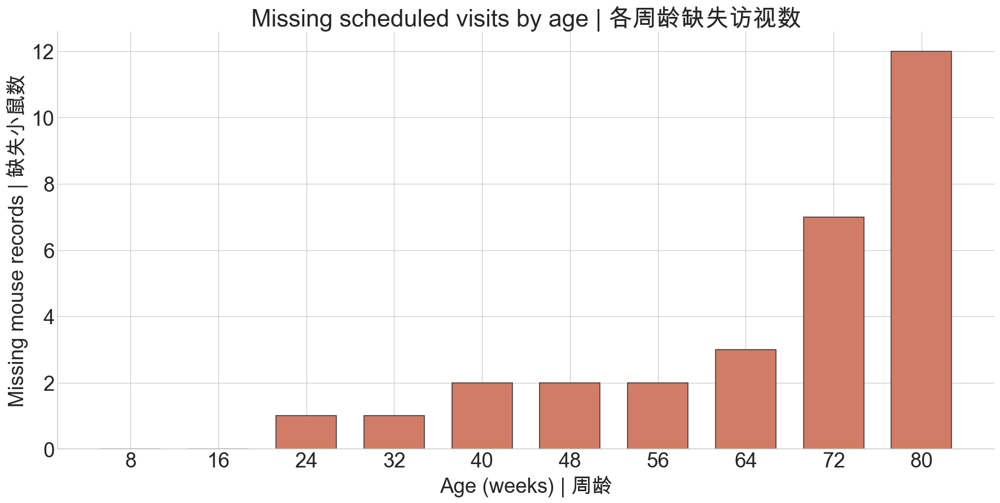

In [8]:
expected_grid = pd.MultiIndex.from_product(
    [sorted(longitudinal["mouse_id"].unique()), scheduled_weeks],
    names=["mouse_id", "week"],
).to_frame(index=False)
observed_grid = expected_grid.merge(
    longitudinal[["mouse_id", "week", "TBL", "X"]],
    on=["mouse_id", "week"],
    how="left",
)
observed_grid["missing"] = observed_grid["X"].isna()
missing_by_week = (
    observed_grid.groupby("week")["missing"].sum()
    .rename("missing_count")
    .reset_index()
)
assert int(observed_grid["missing"].sum()) == 30

print("Missing observations | 缺失观测:", int(observed_grid["missing"].sum()))
print(missing_by_week.to_string(index=False))

fig, ax = plt.subplots(figsize=(16, 8), layout="constrained")
ax.bar(
    missing_by_week["week"],
    missing_by_week["missing_count"],
    width=5.5,
    color="#D17C66",
    edgecolor="#333333",
)
ax.set(
    title="Missing scheduled visits by age | 各周龄缺失访视数",
    xlabel="Age (weeks) | 周龄",
    ylabel="Missing mouse records | 缺失小鼠数",
    xticks=scheduled_weeks,
)
plt.show()


## 5. See the longitudinal trajectories
## 5. 查看纵向轨迹

The cohort plot keeps the population mean from the original tutorial.
The following pages use every mouse as a pale background and highlight
one mouse in a distinct color and marker. A marker means a recorded
observation. A line only joins consecutive recorded points for visual
guidance; it does not create a value at a missing week.

总体图保留原教程的总体均值。之后每页都以全部小鼠作为浅色底图，再用不同
颜色和 marker 突出单只小鼠。Marker 表示真实观测；连线只辅助阅读，不会
在缺失周龄创造数值。


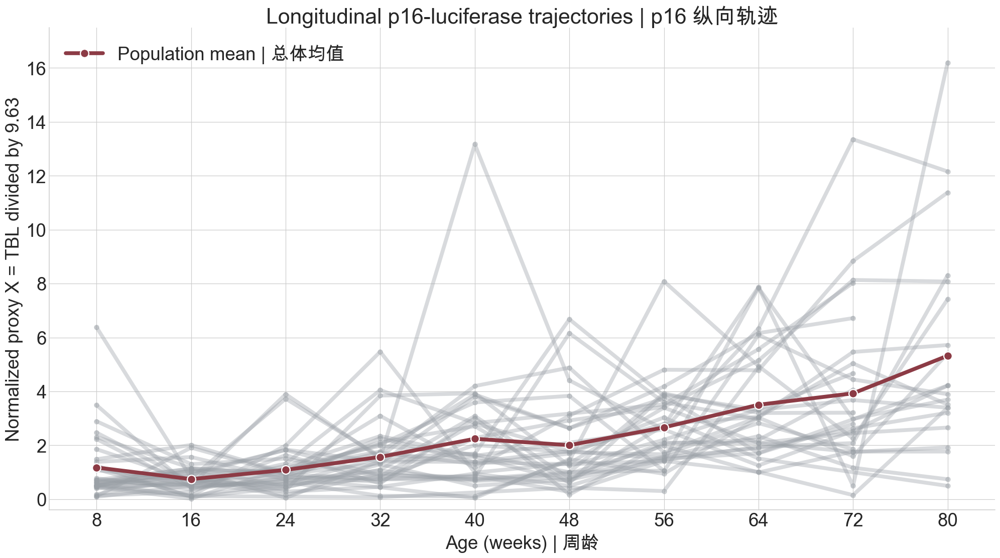

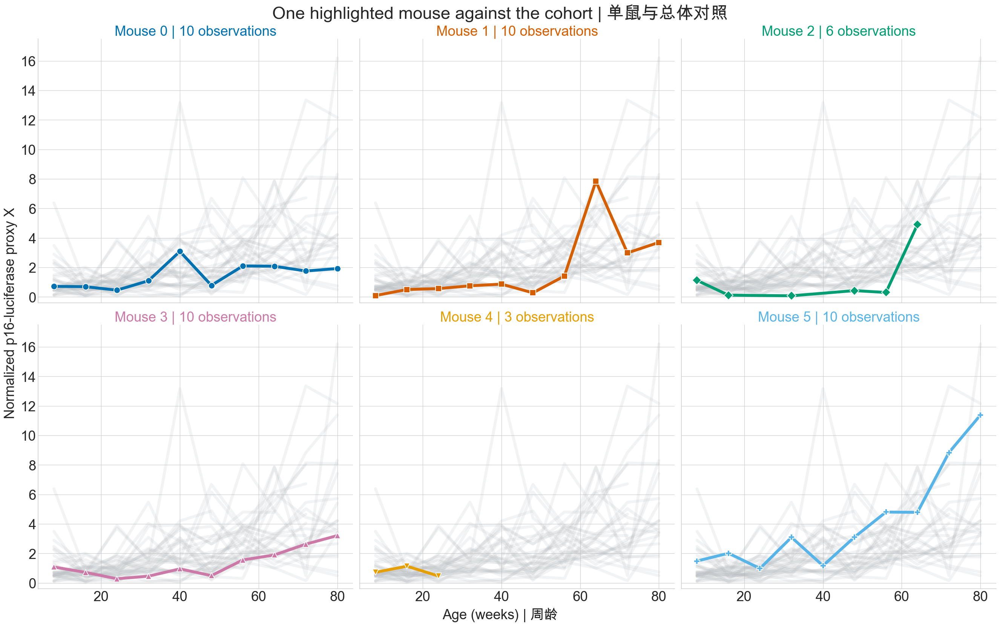

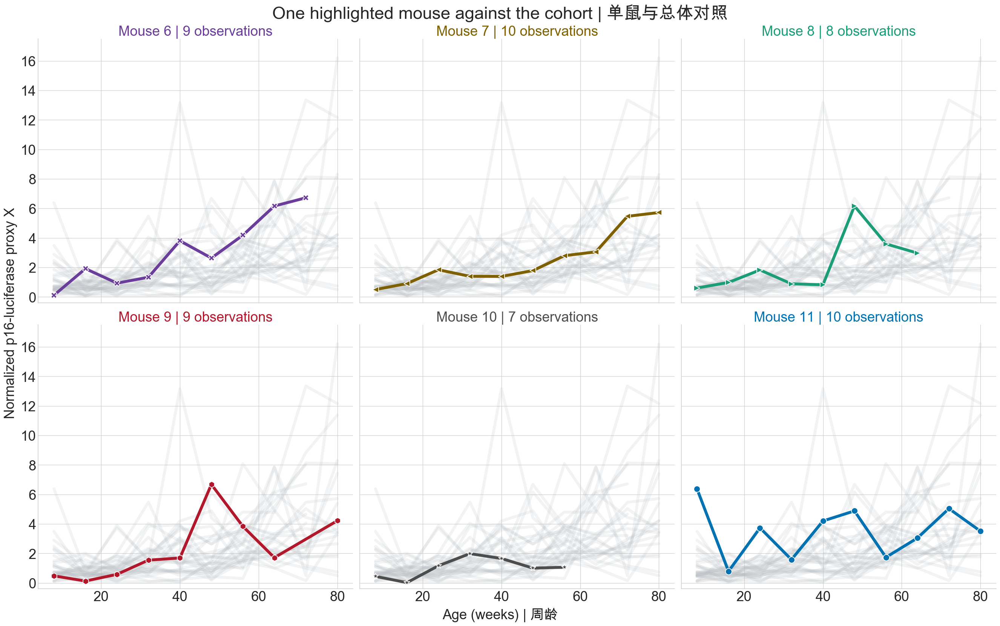

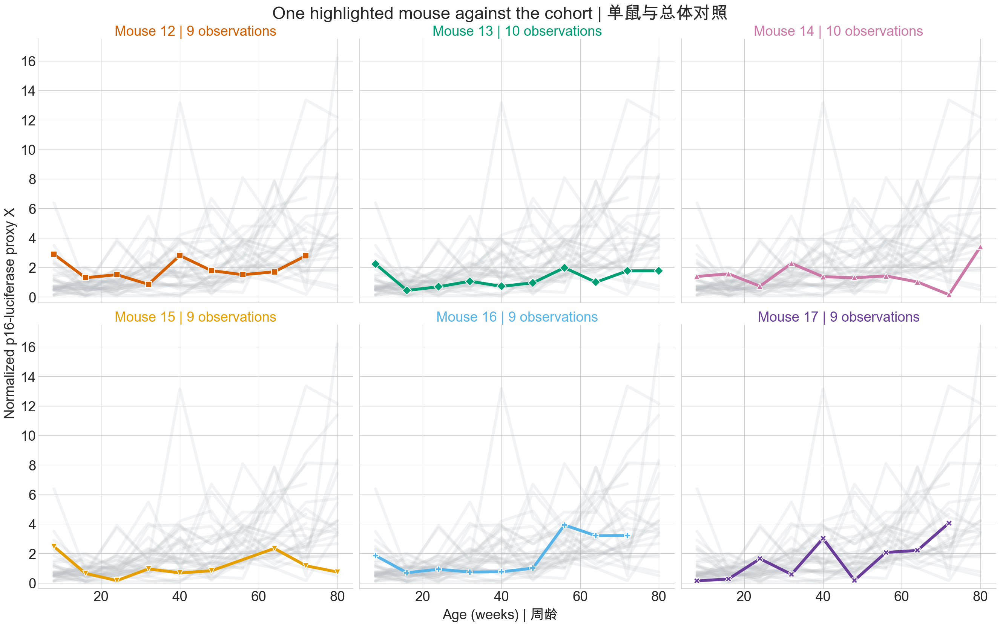

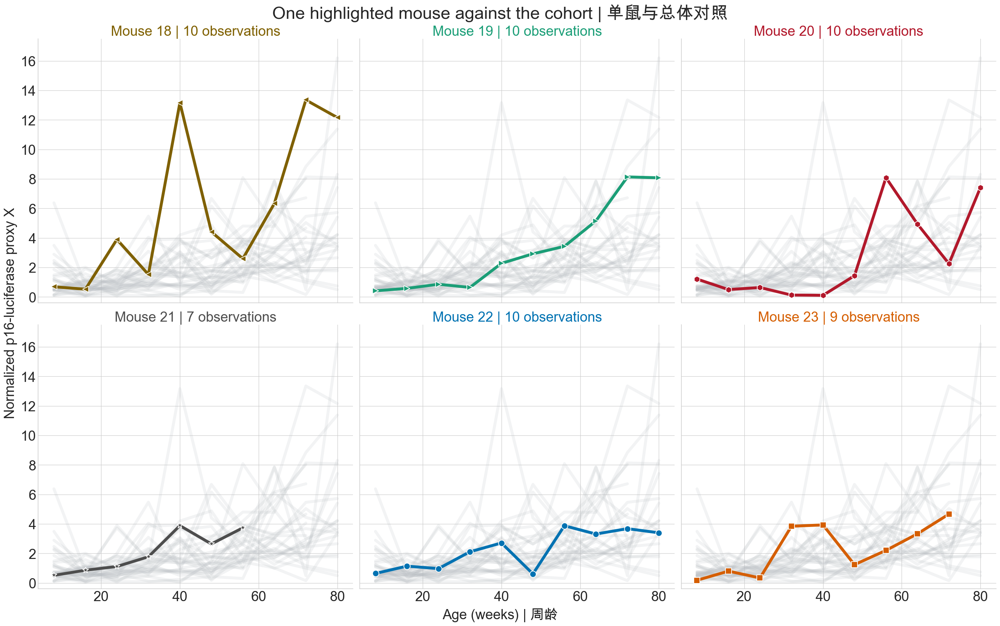

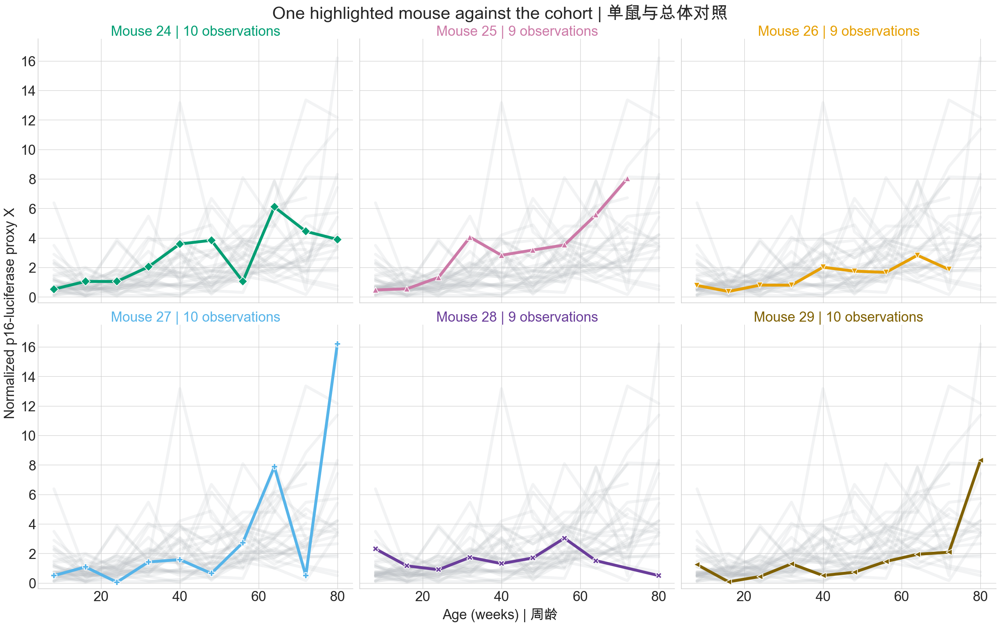

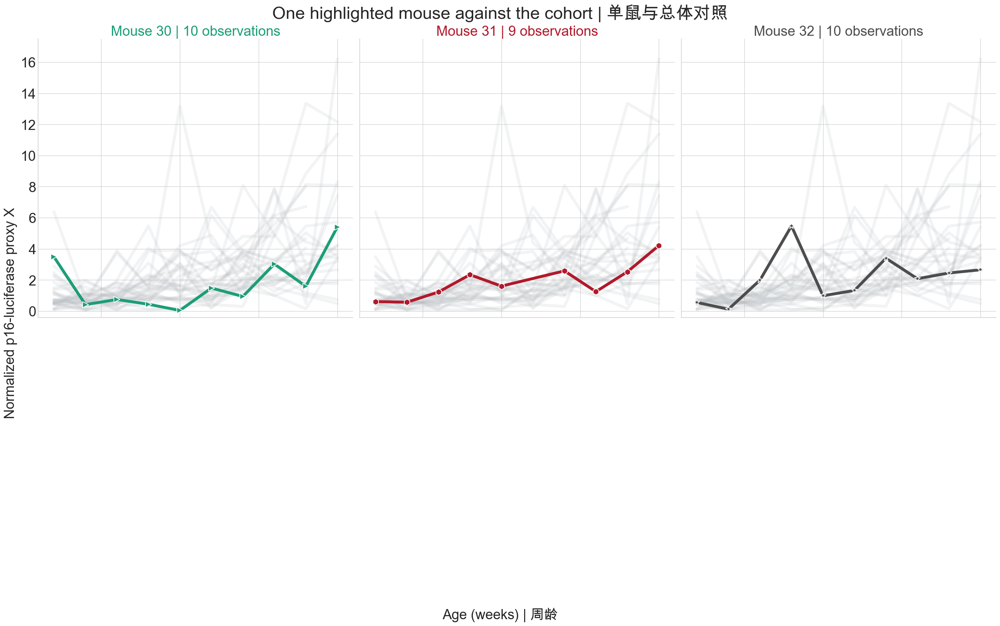

In [9]:
trajectories = {
    int(mouse_id): trajectory.sort_values("week").reset_index(drop=True)
    for mouse_id, trajectory in longitudinal.groupby("mouse_id")
}
mouse_ids = sorted(trajectories)
cohort_mean = longitudinal.groupby("week")["X"].mean()
x_limits = (4, 84)
y_limits = (-0.4, float(longitudinal["X"].max() * 1.08))

fig, ax = plt.subplots(figsize=(18, 10), layout="constrained")
for trajectory in trajectories.values():
    ax.plot(
        trajectory["week"], trajectory["X"],
        color="#9AA0A6", alpha=0.38, lw=5,
        marker="o", ms=6,
    )
ax.plot(
    cohort_mean.index, cohort_mean.values,
    color="#8C3B45", lw=5, marker="o", ms=11,
    markeredgecolor="white", markeredgewidth=1.5,
    label="Population mean | 总体均值",
)
ax.set(
    title="Longitudinal p16-luciferase trajectories | p16 纵向轨迹",
    xlabel="Age (weeks) | 周龄",
    ylabel=f"Normalized proxy X = TBL divided by {TBL_SCALE:.2f}",
    xlim=x_limits,
    ylim=y_limits,
    xticks=scheduled_weeks,
)
ax.legend(frameon=False)
plt.show()

highlight_colors = [
    "#0072B2", "#D55E00", "#009E73", "#CC79A7",
    "#E69F00", "#56B4E9", "#6A3D9A", "#7F6000",
    "#1B9E77", "#B2182B", "#4D4D4D",
]
highlight_markers = ["o", "s", "D", "^", "v", "P", "X", "<", ">", "h", "*"]
panels_per_page = 6

for page_start in range(0, len(mouse_ids), panels_per_page):
    page_ids = mouse_ids[page_start:page_start + panels_per_page]
    fig, axes = plt.subplots(
        2, 3, figsize=(24, 15),
        sharex=True, sharey=True, layout="constrained",
    )
    axes = axes.ravel()
    for panel_index, (ax, mouse_id) in enumerate(zip(axes, page_ids)):
        for background in trajectories.values():
            ax.plot(
                background["week"], background["X"],
                color="#B8BDC2", alpha=0.18, lw=5,
            )
        selected = trajectories[mouse_id]
        color = highlight_colors[(page_start + panel_index) % len(highlight_colors)]
        marker = highlight_markers[(page_start + panel_index) % len(highlight_markers)]
        ax.plot(
            selected["week"], selected["X"],
            color=color, lw=5, marker=marker, ms=11,
            markeredgecolor="white", markeredgewidth=1.2,
        )
        ax.set_title(
            f"Mouse {mouse_id} | {len(selected)} observations",
            color=color,
            fontsize=24,
        )
        ax.set_xlim(x_limits)
        ax.set_ylim(y_limits)
    for ax in axes[len(page_ids):]:
        ax.set_visible(False)
    fig.suptitle(
        "One highlighted mouse against the cohort | 单鼠与总体对照",
        fontsize=30,
        fontweight=600,
    )
    fig.supxlabel("Age (weeks) | 周龄", fontsize=24)
    fig.supylabel("Normalized p16-luciferase proxy X", fontsize=24)
    plt.show()


## 6. Mean and variance through a simple model
## 6. 用简单模型理解均值和方差

Start with

$$
Y=\mu+\sigma Z,\qquad Z\sim N(0,1).
$$

$\mu$ moves the center. $\sigma$ controls a typical distance from
the center. Two groups can have the same mean but very different spread.
Variance is $\sigma^2$; standard deviation is $\sigma$, so SD uses
the same unit as the data.

$\mu$ 决定中心位置；$\sigma$ 决定数值通常离中心多远。两组数据可以
有相同均值，却具有完全不同的离散程度。方差是 $\sigma^2$，标准差是
$\sigma$，因此 SD 与原数据单位相同。

For a sample, the notebook uses

$$
\bar X=\frac{1}{N}\sum_jX_j,\qquad
SD=\sqrt{\frac{\sum_j(X_j-\bar X)^2}{N-1}}.
$$

`pandas.std()` uses `ddof=1`, which means the denominator is $N-1$.
This is the usual sample-SD correction when the observed mice are
treated as a sample from a broader population.

`pandas.std()` 默认 `ddof=1`，即分母为 $N-1$。当这些小鼠被看作更大
总体的样本时，这是常用的样本标准差修正。


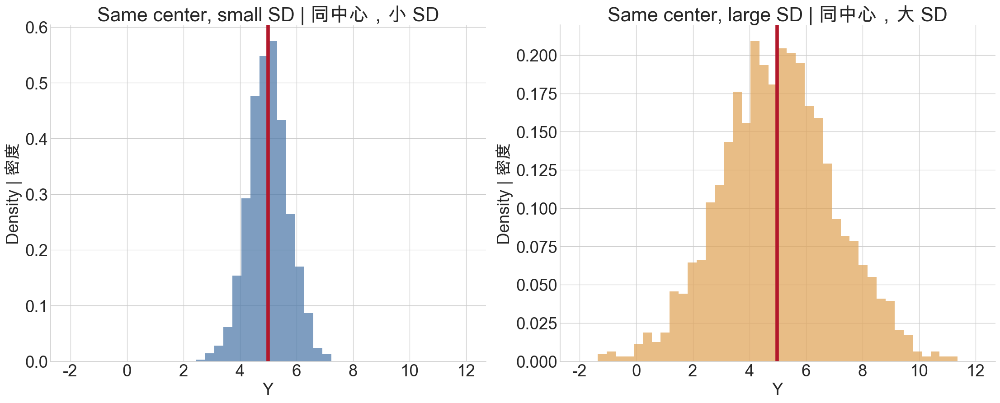

     group  sample_mean  sample_variance  sample_sd
tight | 集中        4.995            0.493      0.702
 wide | 分散        4.985            4.023      2.006

Observed summaries by week | 各周龄观测汇总
 week  n_mice  mean_X  between_mouse_sd
    8      33   1.175             1.256
   16      33   0.744             0.491
   24      32   1.085             0.864
   32      32   1.568             1.183
   40      31   2.241             2.358
   48      31   2.003             1.690
   56      31   2.663             1.514
   64      30   3.503             1.983
   72      26   3.927             3.015
   80      21   5.322             4.005


In [10]:
rng_statistics = np.random.default_rng(206)
toy_z = rng_statistics.normal(size=2000)
toy_tight = 5.0 + 0.7 * toy_z
toy_wide = 5.0 + 2.0 * toy_z

fig, axes = plt.subplots(1, 2, figsize=(20, 8), layout="constrained")
common_bins = np.linspace(-2, 12, 45)
axes[0].hist(toy_tight, bins=common_bins, density=True, alpha=0.72, color="#4C78A8")
axes[0].axvline(toy_tight.mean(), color="#B2182B", lw=5)
axes[0].set(
    title="Same center, small SD | 同中心，小 SD",
    xlabel="Y",
    ylabel="Density | 密度",
)
axes[1].hist(toy_wide, bins=common_bins, density=True, alpha=0.72, color="#E0A458")
axes[1].axvline(toy_wide.mean(), color="#B2182B", lw=5)
axes[1].set(
    title="Same center, large SD | 同中心，大 SD",
    xlabel="Y",
    ylabel="Density | 密度",
)
plt.show()

toy_statistics = pd.DataFrame({
    "group": ["tight | 集中", "wide | 分散"],
    "sample_mean": [toy_tight.mean(), toy_wide.mean()],
    "sample_variance": [toy_tight.var(ddof=1), toy_wide.var(ddof=1)],
    "sample_sd": [toy_tight.std(ddof=1), toy_wide.std(ddof=1)],
})
age_summary = (
    longitudinal.groupby("week")
    .agg(
        n_mice=("X", "count"),
        mean_X=("X", "mean"),
        between_mouse_sd=("X", "std"),
    )
    .reset_index()
)
print(toy_statistics.round(3).to_string(index=False))
print("\nObserved summaries by week | 各周龄观测汇总")
print(age_summary.round(3).to_string(index=False))


### Micro-lab 1. Build a real subset and compare summaries
### 微实验 1：构造真实子数据集并比较汇总量

**Goal | 目标.** Learn that a mean and SD describe the observations
currently selected; changing the sample can change both numbers.

**Predict first | 先预测.** Will the selected mice have a higher or
lower mean than all available mice at the same weeks?

**Steps | 操作步骤.**

1. Choose at least two valid mouse IDs and one or more scheduled weeks.
2. Read the selected rows.
3. Compare subset mean and sample SD with the full same-week sample.
4. Change one mouse or one week and run again.

**Scientific meaning | 科学解释.** A subset difference can reflect
sampling variation; it does not prove that the selected mice form a new
biological group.

**Limit | 局限.** This descriptive comparison does not adjust for age
imbalance and is not a hypothesis test.

选择至少两只小鼠和一个或多个周龄，比较子集与相同周龄完整样本。子集差异
可能只是抽样波动，不能自动证明存在新的生物学亚群。


In [11]:
# EDIT HERE | 只修改这里
PRACTICE_1_MOUSE_IDS = [0, 1, 2, 3, 4]
PRACTICE_1_WEEKS = [24, 32, 40]

invalid_mice = sorted(set(PRACTICE_1_MOUSE_IDS) - set(mouse_ids))
invalid_weeks = sorted(set(PRACTICE_1_WEEKS) - set(scheduled_weeks))
if len(set(PRACTICE_1_MOUSE_IDS)) < 2 or invalid_mice:
    raise ValueError(
        f"Choose at least two mouse IDs from {mouse_ids}. "
        f"Unknown IDs: {invalid_mice}. "
        f"请至少选择两只有效小鼠；无效编号：{invalid_mice}。"
    )
if not PRACTICE_1_WEEKS or invalid_weeks:
    raise ValueError(
        f"Choose weeks from {scheduled_weeks}. Unknown weeks: {invalid_weeks}. "
        f"请从计划周龄中选择；无效周龄：{invalid_weeks}。"
    )

practice_1_subset = longitudinal.loc[
    longitudinal["mouse_id"].isin(PRACTICE_1_MOUSE_IDS)
    & longitudinal["week"].isin(PRACTICE_1_WEEKS)
].copy()
practice_1_reference = longitudinal.loc[
    longitudinal["week"].isin(PRACTICE_1_WEEKS)
].copy()
practice_1_summary = pd.DataFrame({
    "sample": ["selected subset | 所选子集", "all mice at same weeks | 同周龄全部小鼠"],
    "n_observations": [len(practice_1_subset), len(practice_1_reference)],
    "mean_X": [practice_1_subset["X"].mean(), practice_1_reference["X"].mean()],
    "sample_sd_X": [
        practice_1_subset["X"].std(ddof=1),
        practice_1_reference["X"].std(ddof=1),
    ],
})
print("Selected observations | 所选观测")
print(
    practice_1_subset[["mouse_id", "week", "X"]]
    .round(3)
    .to_string(index=False)
)
print("\nComparison | 比较")
print(practice_1_summary.round(3).to_string(index=False))


Selected observations | 所选观测
 mouse_id  week     X
        0    24 0.455
        0    32 1.091
        0    40 3.083
        1    24 0.562
        1    32 0.750
        1    40 0.864
        2    32 0.073
        3    24 0.280
        3    32 0.455
        3    40 0.949
        4    24 0.466

Comparison | 比较
                          sample  n_observations  mean_X  sample_sd_X
          selected subset | 所选子集              11   0.821        0.808
all mice at same weeks | 同周龄全部小鼠              95   1.625        1.646


### Micro-lab 2. Repeat a noisy production-removal process
### 微实验 2：重复模拟带噪声的产生-清除过程

**Goal | 目标.** See why identical equations and parameters do not
produce identical trajectories when random fluctuations are present.

The toy model is

$$
dX=(p-rX)\,ds+\sqrt{2\epsilon}\,dW_s.
$$

$p$ is a constant production rate, $rX$ is linear removal, and
$\epsilon$ controls noise. Without noise, the balance is $X^*=p/r$.

$p$ 是常数产生率，$rX$ 是线性清除，$\epsilon$ 控制噪声。没有噪声时，
平衡点是 $X^*=p/r$。

**Predict first | 先预测.** Increasing noise should change the average
balance, the spread around it, or both?

**Steps | 操作步骤.** Change production, removal, noise, repeats, or
seed. Run several times. Compare the deterministic balance line with
individual noisy paths.

**Scientific meaning | 科学解释.** The equation determines tendencies
and a distribution of possible paths, not one guaranteed curve.

**Limit | 局限.** This is a teaching model with constant rates, not one
of the fitted age-dependent circuits.


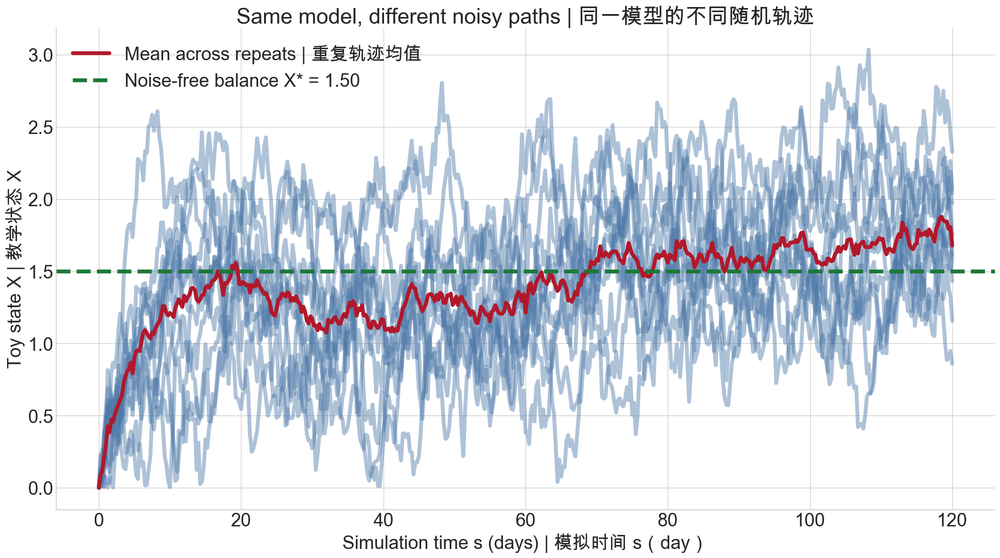

Final mean | 终点均值: 1.677
Final sample SD | 终点样本 SD: 0.407


In [12]:
def simulate_toy_turnover(
    production_rate,
    removal_coefficient,
    noise_intensity,
    n_repeats,
    seed,
    duration_days=120,
    step_days=0.25,
):
    """
    Purpose: Simulate repeated paths from a constant production-removal model.
    Parameters: Rates, noise intensity, repeat count, seed, duration, and step.
    Returns: times and an array with one simulated path per row.
    Units: time in days; production in X/day; removal in 1/day; noise in X^2/day.
    Assumptions: Euler-Maruyama steps and reflection at X=0.
    中文说明：模拟常数产生与线性清除模型的多条随机轨迹，并在 X=0 反射。
    """
    if production_rate < 0 or removal_coefficient <= 0:
        raise ValueError(
            "Production must be non-negative and removal must be positive. "
            "产生率不能为负，清除系数必须为正。"
        )
    if noise_intensity < 0 or n_repeats < 2:
        raise ValueError(
            "Noise must be non-negative and repeats must be at least 2. "
            "噪声不能为负，重复次数至少为 2。"
        )
    rng = np.random.default_rng(seed)
    times = np.arange(0, duration_days + step_days, step_days)
    paths = np.zeros((n_repeats, len(times)))
    for index in range(1, len(times)):
        old = paths[:, index - 1]
        drift = production_rate - removal_coefficient * old
        shock = np.sqrt(2 * noise_intensity * step_days) * rng.normal(
            size=n_repeats
        )
        paths[:, index] = np.abs(old + drift * step_days + shock)
    return times, paths


# EDIT HERE | 只修改这里
PRACTICE_2_PRODUCTION = 0.18
PRACTICE_2_REMOVAL = 0.12
PRACTICE_2_NOISE = 0.035
PRACTICE_2_REPEATS = 12
PRACTICE_2_SEED = 2026

practice_2_times, practice_2_paths = simulate_toy_turnover(
    PRACTICE_2_PRODUCTION,
    PRACTICE_2_REMOVAL,
    PRACTICE_2_NOISE,
    PRACTICE_2_REPEATS,
    PRACTICE_2_SEED,
)
practice_2_balance = PRACTICE_2_PRODUCTION / PRACTICE_2_REMOVAL

fig, ax = plt.subplots(figsize=(18, 10), layout="constrained")
for path in practice_2_paths:
    ax.plot(practice_2_times, path, color="#4C78A8", alpha=0.45, lw=5)
ax.plot(
    practice_2_times,
    practice_2_paths.mean(axis=0),
    color="#B2182B",
    lw=5,
    label="Mean across repeats | 重复轨迹均值",
)
ax.axhline(
    practice_2_balance,
    color="#1B7837",
    lw=5,
    ls="--",
    label=f"Noise-free balance X* = {practice_2_balance:.2f}",
)
ax.set(
    title="Same model, different noisy paths | 同一模型的不同随机轨迹",
    xlabel="Simulation time s (days) | 模拟时间 s（day）",
    ylabel="Toy state X | 教学状态 X",
)
ax.legend(frameon=False)
plt.show()

print(
    "Final mean | 终点均值:",
    f"{practice_2_paths[:, -1].mean():.3f}",
)
print(
    "Final sample SD | 终点样本 SD:",
    f"{practice_2_paths[:, -1].std(ddof=1):.3f}",
)


# Part II. From candidate mechanisms to model selection
# 第二部分：从候选机制到模型筛选

We now know what was measured and where observations are missing.
Only now do we introduce candidate equations.

现在我们已经知道测量对象、数据结构和缺失位置，接下来才引入候选方程。


## 7. Define the 16 candidate circuits
## 7. 定义 16 个候选 circuit

**English.** We start from one production-removal family. At this point
no candidate has been selected:

**中文。** 我们先定义一个统一的产生-清除模型族。此时尚未选出任何模型：

$$
dX=f(X,t;\theta)\,ds+\sqrt{2\epsilon}\,dW_s,
$$

$$
f(X,t;\theta)
=(\eta_0+\eta_1t)(1+\eta_2X)
-\frac{\beta_0(1-qt/t_{\max})X}{1+\beta_2X}.
$$

**English.** A parameter is a number controlling one part of a model.
It is not directly observed. Fitting means searching for values that
make the observed transitions plausible.

**中文。** 参数是控制模型某一部分的数值，不能从一次观测直接读出。拟合
就是搜索一组参数，使实际观察到的转移在模型下尽可能合理。

| Symbol | English role | 中文作用 | Unit |
|---|---|---|---|
| $\eta_0$ | baseline production | 基础产生率 | $X/\mathrm{day}$ |
| $\eta_1$ | age-related production increase | 产生率随年龄增加 | $X/(\mathrm{day}\cdot\mathrm{year})$ |
| $\eta_2$ | amplification by existing $X$ | 已有负荷的旁观者放大 | $1/X$ |
| $\beta_0$ | baseline removal coefficient | 基础清除系数 | $1/\mathrm{day}$ |
| $q$ | age-related removal decline fraction | 清除随年龄下降的比例 | dimensionless |
| $t_{\max}$ | largest scheduled age used for scaling | 用于缩放的最大计划年龄 | year |
| $\beta_2$ | removal-saturation strength | 清除饱和强度 | $1/X$ |
| $\epsilon$ | random-fluctuation intensity | 随机波动强度 | $X^2/\mathrm{day}$ |

**English.** Chronological age $t$ is measured in year. Elapsed
simulation time $s$ and the numerical step are measured in day.

**中文。** 生物年龄 $t$ 使用 year；单次转移中的模拟时间 $s$ 和数值步长
使用 day。

| Bit | Active term | English question | 中文问题 |
|---|---|---|---|
| 1 | $\eta_1$ | Does production increase with age? | 产生率是否随年龄增加？ |
| 2 | $\eta_2$ | Does existing load amplify production? | 已有负荷是否放大产生？ |
| 3 | $q$ | Does removal decline directly with age? | 清除是否直接随年龄下降？ |
| 4 | $\beta_2$ | Does removal saturate as $X$ rises? | 清除是否随 $X$ 上升而饱和？ |

### Complete model list | 完整模型列表

**English.** Every row also contains the same stochastic term
$\sqrt{2\epsilon}\,dW_s$. The table expands the complete deterministic
drift for all 16 candidates.

**中文。** 每一行还包含相同的随机项
$\sqrt{2\epsilon}\,dW_s$。下表展开全部 16 个候选模型的确定性漂移。

| Circuit | Complete drift $f(X,t)$ | Active mechanisms / 启用机制 | Nominal $k$ |
|---|---|---|---:|
| `C0000` | $\eta_0-\beta_0X$ | constant production; linear removal / 常数产生；线性清除 | 3 |
| `C0001` | $\eta_0-\dfrac{\beta_0X}{1+\beta_2X}$ | constant production; saturating removal / 常数产生；饱和清除 | 4 |
| `C0010` | $\eta_0-\beta_0(1-qt/t_{\max})X$ | constant production; age-decreasing removal / 常数产生；清除随年龄下降 | 4 |
| `C0011` | $\eta_0-\dfrac{\beta_0(1-qt/t_{\max})X}{1+\beta_2X}$ | constant production; age-decreasing and saturating removal / 常数产生；清除随年龄下降且饱和 | 5 |
| `C0100` | $\eta_0(1+\eta_2X)-\beta_0X$ | bystander production; linear removal / 旁观者产生；线性清除 | 4 |
| `C0101` | $\eta_0(1+\eta_2X)-\dfrac{\beta_0X}{1+\beta_2X}$ | bystander production; saturating removal / 旁观者产生；饱和清除 | 5 |
| `C0110` | $\eta_0(1+\eta_2X)-\beta_0(1-qt/t_{\max})X$ | bystander production; age-decreasing removal / 旁观者产生；清除随年龄下降 | 5 |
| `C0111` | $\eta_0(1+\eta_2X)-\dfrac{\beta_0(1-qt/t_{\max})X}{1+\beta_2X}$ | bystander production; age-decreasing and saturating removal / 旁观者产生；清除随年龄下降且饱和 | 6 |
| `C1000` | $(\eta_0+\eta_1t)-\beta_0X$ | age-increasing production; linear removal / 产生随年龄增加；线性清除 | 4 |
| `C1001` | $(\eta_0+\eta_1t)-\dfrac{\beta_0X}{1+\beta_2X}$ | age-increasing production; saturating removal / 产生随年龄增加；饱和清除 | 5 |
| `C1010` | $(\eta_0+\eta_1t)-\beta_0(1-qt/t_{\max})X$ | age-increasing production; age-decreasing removal / 产生随年龄增加；清除随年龄下降 | 5 |
| `C1011` | $(\eta_0+\eta_1t)-\dfrac{\beta_0(1-qt/t_{\max})X}{1+\beta_2X}$ | age-increasing production; age-decreasing and saturating removal / 产生随年龄增加；清除随年龄下降且饱和 | 6 |
| `C1100` | $(\eta_0+\eta_1t)(1+\eta_2X)-\beta_0X$ | age and bystander production; linear removal / 年龄与旁观者产生；线性清除 | 5 |
| `C1101` | $(\eta_0+\eta_1t)(1+\eta_2X)-\dfrac{\beta_0X}{1+\beta_2X}$ | age and bystander production; saturating removal / 年龄与旁观者产生；饱和清除 | 6 |
| `C1110` | $(\eta_0+\eta_1t)(1+\eta_2X)-\beta_0(1-qt/t_{\max})X$ | age and bystander production; age-decreasing removal / 年龄与旁观者产生；清除随年龄下降 | 6 |
| `C1111` | $(\eta_0+\eta_1t)(1+\eta_2X)-\dfrac{\beta_0(1-qt/t_{\max})X}{1+\beta_2X}$ | all four mechanisms / 四种机制全部启用 | 7 |

Nominal $k$ counts $\eta_0$, $\beta_0$, $\epsilon$, and
every active optional parameter. The optimizer also checks the boundary
$\eta_0=0$. That check helps find a maximum at the edge; it does not
create another circuit or reduce the main BIC penalty.

Nominal $k$ 统计 $\eta_0$、$\beta_0$、$\epsilon$ 和所有
已启用的可选参数。优化器还会检查边界 $\eta_0=0$，但这只用于寻找边界
最大值，不会产生新的 circuit，也不会减少主 BIC 的惩罚。

`C1001`, for example, contains age-increasing production
and saturating removal. It remains only one candidate until all models
have been fitted and compared.

例如 `C1001` 包含产生随年龄增加和饱和清除，但在全部模型完成
拟合和比较之前，它仍然只是一个候选项。


**Function card | 函数说明卡**

- `circuit_formula_and_labels(active)` translates four bits into a
  complete drift formula.
- `build_candidate_models()` enumerates all $2^4=16$ circuits.
- `vector_to_family_params(...)` fills inactive optional parameters
  with zero.
- `family_drift(x, t_days, params)` returns production minus removal.
#
- `circuit_formula_and_labels(active)` 把四位代码翻译为完整漂移公式。
- `build_candidate_models()` 枚举 $2^4=16$ 个候选模型。
- `vector_to_family_params(...)` 把未启用的可选参数补为 0。
- `family_drift(...)` 返回产生率减清除率。

Example | 调用示例：
`family_drift(np.array([1.0]), 40 * 7, params)`


In [13]:
MAX_AGE_YEARS = max(scheduled_weeks) * 7.0 / DAYS_PER_YEAR
BASE_PARAMETER_NAMES = ["eta0", "beta0", "epsilon"]
SWITCH_PARAMETER_NAMES = [
    "eta1", "eta2", "removal_age_fraction", "beta2",
]

# Published scales define finite biological search ranges, not fitted answers.
PARAMETER_BOUNDS = {
    "eta0": (0.0, 1.50),
    "eta1": (0.0, 0.30),
    "eta2": (0.0, 1.50),
    "beta0": (0.01, 1.20),
    "removal_age_fraction": (0.0, 0.95),
    "beta2": (0.02, 3.00),
    "epsilon": (0.03, 0.35),
}
PAPER_SCALE_ANCHORS = [
    {
        "label": "published SR scale",
        "eta0": 0.0,
        "eta1": 0.15,
        "eta2": 0.0,
        "beta0": 0.27 / 1.10,
        "removal_age_fraction": 0.0,
        "beta2": 1.0 / 1.10,
        "epsilon": 0.14,
    },
    {
        "label": "published age-removal scale",
        "eta0": 0.15,
        "eta1": 0.0,
        "eta2": 0.0,
        "beta0": 0.80,
        "removal_age_fraction": 0.63,
        "beta2": 1.90,
        "epsilon": 0.19,
    },
]


def circuit_formula_and_labels(active):
    '''
    Purpose: Translate four circuit switches into a drift formula and labels.
    Parameters: active, four Boolean mechanism switches.
    Returns: Formula text plus English and Chinese mechanism labels.
    Units: Formula text follows the parameter-unit table.
    Assumptions: Bit order is age production, bystander, age removal, saturation.
    中文说明：把四位 circuit 开关翻译为完整漂移公式和双语机制名称。
    '''
    age_production, bystander, age_removal, saturation = active
    production = "(eta0 + eta1*t)" if age_production else "eta0"
    if bystander:
        production = f"{production}*(1 + eta2*X)"

    removal_coefficient = (
        "beta0*(1 - q*t/t_max)" if age_removal else "beta0"
    )
    removal = f"{removal_coefficient}*X"
    if saturation:
        removal = f"({removal})/(1 + beta2*X)"

    labels_en = []
    labels_zh = []
    if age_production:
        labels_en.append("age production")
        labels_zh.append("年龄产生")
    if bystander:
        labels_en.append("bystander")
        labels_zh.append("旁观者效应")
    if age_removal:
        labels_en.append("age removal")
        labels_zh.append("年龄清除")
    if saturation:
        labels_en.append("saturation")
        labels_zh.append("饱和清除")
    if not labels_en:
        labels_en.append("baseline only")
        labels_zh.append("仅基础机制")
    return (
        f"{production} - {removal}",
        ", ".join(labels_en),
        "、".join(labels_zh),
    )


def build_candidate_models() -> pd.DataFrame:
    '''
    Purpose: Enumerate all 2^4 candidate production-removal circuits.
    Parameters: None.
    Returns: A 16-row DataFrame with switches, formulas, and nominal k.
    Units: Parameters retain the units defined in the preceding table.
    Assumptions: eta0, beta0, and epsilon are free in every circuit.
    中文说明：枚举 16 个候选模型；所有模型均包含 eta0、beta0 和 epsilon。
    '''
    rows = []
    for model_id, active in enumerate(
        itertools.product([False, True], repeat=4), start=1
    ):
        formula, mechanisms_en, mechanisms_zh = (
            circuit_formula_and_labels(active)
        )
        active_names = [
            name
            for name, is_active in zip(SWITCH_PARAMETER_NAMES, active)
            if is_active
        ]
        rows.append({
            "model_id": model_id,
            "circuit": "C" + "".join(str(int(value)) for value in active),
            "age_production": active[0],
            "bystander": active[1],
            "age_removal": active[2],
            "saturation": active[3],
            "drift_formula": formula,
            "mechanisms_en": mechanisms_en,
            "mechanisms_zh": mechanisms_zh,
            "parameter_names": BASE_PARAMETER_NAMES + active_names,
            "parameters_k": len(BASE_PARAMETER_NAMES) + len(active_names),
        })
    return pd.DataFrame(rows)


def vector_to_family_params(names, values):
    '''
    Purpose: Expand an active parameter vector into the full family dictionary.
    Parameters: Active parameter names and values in matching order.
    Returns: A dictionary containing all seven family parameters.
    Units: Each value keeps the unit assigned to its parameter.
    Assumptions: Inactive optional parameters equal zero.
    中文说明：把当前模型的参数向量补全为统一参数字典；未启用项为 0。
    '''
    params = {
        "eta0": 0.0,
        "eta1": 0.0,
        "eta2": 0.0,
        "beta0": 0.0,
        "removal_age_fraction": 0.0,
        "beta2": 0.0,
        "epsilon": 0.0,
    }
    params.update(dict(zip(names, values)))
    return params


def family_drift(x, t_days, params):
    '''
    Purpose: Evaluate deterministic production minus removal for any circuit.
    Parameters: State x, biological age in days, and a full parameter dictionary.
    Returns: Drift values with the same shape as x.
    Units: X per day.
    Assumptions: Age effects use years; coefficients are fixed within a transition.
    中文说明：计算任意 circuit 的确定性漂移，即产生率减清除率。
    '''
    age_years = np.asarray(t_days) / DAYS_PER_YEAR
    production_base = params["eta0"] + params["eta1"] * age_years
    production = production_base * (1.0 + params["eta2"] * x)
    removal_coefficient = params["beta0"] * (
        1.0
        - params["removal_age_fraction"] * age_years / MAX_AGE_YEARS
    )
    removal = removal_coefficient * x / (1.0 + params["beta2"] * x)
    return production - removal


candidate_models = build_candidate_models()
candidate_models[
    [
        "circuit", "drift_formula", "mechanisms_en",
        "mechanisms_zh", "parameters_k",
    ]
]


,circuit,drift_formula,mechanisms_en,mechanisms_zh,parameters_k
0,C0000,eta0 - beta0*X,baseline only,仅基础机制,3
1,C0001,eta0 - (beta0*X)/(1 + beta2*X),saturation,饱和清除,4
2,C0010,eta0 - beta0*(1 - q*t/t_max)*X,age removal,年龄清除,4
3,C0011,eta0 - (beta0*(1 - q*t/t_max)*X)/(1 + beta2*X),"age removal, saturation",年龄清除、饱和清除,5
4,C0100,eta0*(1 + eta2*X) - beta0*X,bystander,旁观者效应,4
5,C0101,eta0*(1 + eta2*X) - (beta0*X)/(1 + beta2*X),"bystander, saturation",旁观者效应、饱和清除,5
6,C0110,eta0*(1 + eta2*X) - beta0*(1 - q*t/t_max)*X,"bystander, age removal",旁观者效应、年龄清除,5
7,C0111,eta0*(1 + eta2*X) - (beta0*(1 - q*t/t_max)*X)/...,"bystander, age removal, saturation",旁观者效应、年龄清除、饱和清除,6
8,C1000,(eta0 + eta1*t) - beta0*X,age production,年龄产生,4
9,C1001,(eta0 + eta1*t) - (beta0*X)/(1 + beta2*X),"age production, saturation",年龄产生、饱和清除,5


### Micro-lab 4. Separate age $t$ from simulation time $s$
### 微实验 4：区分年龄 $t$ 与模拟时间 $s$

**Goal | 目标.** Keep two clocks separate.

- $t$ is the mouse's chronological age and is expressed in **year**
  inside age-dependent coefficients.
- $s$ is elapsed time while the computer simulates one transition and
  is advanced in **day**.

- $t$ 是小鼠生物年龄，在年龄效应参数中使用 year。
- $s$ 是计算机推进单次转移的模拟时间，使用 day。

Dividing age in days by 365.25 converts the age covariate to year. It
does not change a one-day Euler step into a one-year step.

除以 365.25 只是把年龄协变量从 day 换算为 year，不会把 1-day 数值步长
变成 1-year 步长。

**Predict first | 先预测.** How many years is 40 weeks? How many
one-day steps are in the following eight-week transition?

**Limit | 局限.** 365.25 is a conventional average Gregorian year; the
experimental schedule itself is recorded in weeks.


In [14]:
# EDIT HERE / 只修改这里
PRACTICE_4_AGE_WEEKS = 8
PRACTICE_4_STEP_DAYS = 1.0

if PRACTICE_4_AGE_WEEKS < 0 or PRACTICE_4_STEP_DAYS <= 0:
    raise ValueError(
        "Age must be non-negative and the step must be positive. "
        "/ 年龄不能为负，步长必须为正。"
    )

practice_4_age_days = PRACTICE_4_AGE_WEEKS * 7.0
practice_4_age_years = practice_4_age_days / DAYS_PER_YEAR
practice_4_steps = practice_4_age_days / PRACTICE_4_STEP_DAYS
print(
    f"Biological age t | 生物年龄 t: "
    f"{PRACTICE_4_AGE_WEEKS} weeks = {practice_4_age_days:.1f} days "
    f"= {practice_4_age_years:.4f} years"
)
print(
    f"Simulation step ds | 模拟步长 ds: "
    f"{PRACTICE_4_STEP_DAYS:.2f} day(s)"
)
print(
    f"One-day steps from birth to that age | 从出生到该年龄的步数: "
    f"{practice_4_steps:.1f}"
)


Biological age t | 生物年龄 t: 8 weeks = 56.0 days = 0.1533 years
Simulation step ds | 模拟步长 ds: 1.00 day(s)
One-day steps from birth to that age | 从出生到该年龄的步数: 56.0


## 8. Turn repeated visits into conditional transitions
## 8. 把重复访视转换为条件转移

A trajectory plot is useful to the eye, but the likelihood needs
explicit start-end questions:

$$
p(X_{\mathrm{end}}\mid X_{\mathrm{start}},
t_{\mathrm{start}},t_{\mathrm{end}},m,\theta).
$$

Read the vertical bar as **given**. For each retained row we ask:
starting from this mouse's measured $X$, how much endpoint density
does model $m$ with parameters $\theta$ place at the next measured
value?

竖线读作“在已知……的条件下”。每一行都问：已知同一只小鼠的真实起点，
模型 $m$ 和参数 $\theta$ 在下一次真实终点附近给出多高的密度？

### Two defensible missing-data choices | 两种可说明的缺失处理

**Main paper-style likelihood: 294 terms.** Add $X(0)=0$ for every
mouse, then retain only adjacent scheduled visits when both endpoints
exist.

**主分析：294 项。** 每只小鼠加入 $X(0)=0$，之后只保留计划时间表中相邻
且两端都存在的访视。

**Alternative long-interval likelihood: 300 terms.** Connect each
observation to the next available observation. This recovers six
post-gap endpoints, but they represent longer intervals and require the
model to propagate across an unobserved visit. We construct this table
for an open question and do not use it in the main fit.

**可选分析：300 项。** 把每个观测连接到下一次可用观测，可重新利用 6 个
跨缺失点的后续终点；但这些是更长的转移，需要模型跨越未观测访视。本教程
只构造该表作为开放问题，不用于主拟合。

Missing values themselves never become observations. A later observed
value can contribute only after choosing and declaring a different
long-interval likelihood.

缺失值本身不能成为观测；后续真实值只有在明确采用另一种长间隔似然后，
才能重新贡献信息。


**Function card | 函数说明卡**

- `build_adjacent_transitions(data)` creates the 294 paper-style terms.
- `build_nearest_observed_transitions(data)` creates the 300-term
  sensitivity table.
- Both preserve whole-mouse identity and actual interval length.
#
- `build_adjacent_transitions(data)` 建立论文口径的 294 条条件项。
- `build_nearest_observed_transitions(data)` 建立 300 条敏感性分析项。
- 两者都保留小鼠身份和真实间隔长度。

Example | 调用示例：`transitions = build_adjacent_transitions(longitudinal)`


In [15]:
def build_adjacent_transitions(data: pd.DataFrame) -> pd.DataFrame:
    '''
    Purpose: Build paper-style conditional terms from adjacent scheduled visits.
    Parameters: Long-format observations with mouse_id, week, and X.
    Returns: One row per retained conditional transition.
    Units: Weeks for labels, days for simulation times, normalized X for states.
    Assumptions: X(0)=0; both endpoints must exist; missing visits are not crossed.
    中文说明：构建论文口径的相邻条件转移；缺失访视会切断该 8 周条件项。
    '''
    rows = []
    full_schedule = [0] + scheduled_weeks
    for mouse_id, trajectory in data.groupby("mouse_id"):
        observed = dict(zip(trajectory["week"], trajectory["X"]))
        values = {0: 0.0, **observed}
        for week_start, week_end in zip(full_schedule[:-1], full_schedule[1:]):
            if week_start in values and week_end in values:
                rows.append({
                    "mouse_id": int(mouse_id),
                    "week_start": int(week_start),
                    "week_end": int(week_end),
                    "t_start_days": week_start * 7.0,
                    "t_end_days": week_end * 7.0,
                    "delta_days": (week_end - week_start) * 7.0,
                    "x_start": float(values[week_start]),
                    "x_end": float(values[week_end]),
                    "synthetic_start": week_start == 0,
                    "crosses_missing_visit": False,
                })
    return pd.DataFrame(rows)


def build_nearest_observed_transitions(data: pd.DataFrame) -> pd.DataFrame:
    '''
    Purpose: Connect consecutive available observations across possible gaps.
    Parameters: Long-format observations with mouse_id, week, and X.
    Returns: A sensitivity table with one transition per recorded endpoint.
    Units: Weeks for labels, days for intervals, normalized X for states.
    Assumptions: X(0)=0 and model propagation across unobserved scheduled visits.
    中文说明：连接相邻的可用观测；允许跨缺失点，仅用于长间隔敏感性分析。
    '''
    rows = []
    for mouse_id, trajectory in data.groupby("mouse_id"):
        ordered = (
            pd.concat([
                pd.DataFrame({"week": [0], "X": [0.0]}),
                trajectory[["week", "X"]],
            ])
            .sort_values("week")
            .reset_index(drop=True)
        )
        for start, end in zip(
            ordered.itertuples(index=False),
            ordered.iloc[1:].itertuples(index=False),
        ):
            gap_weeks = int(end.week - start.week)
            rows.append({
                "mouse_id": int(mouse_id),
                "week_start": int(start.week),
                "week_end": int(end.week),
                "t_start_days": float(start.week * 7.0),
                "t_end_days": float(end.week * 7.0),
                "delta_days": float(gap_weeks * 7.0),
                "x_start": float(start.X),
                "x_end": float(end.X),
                "synthetic_start": start.week == 0,
                "crosses_missing_visit": gap_weeks > 8,
            })
    return pd.DataFrame(rows)


transitions = build_adjacent_transitions(longitudinal)
nearest_observed_transitions = build_nearest_observed_transitions(longitudinal)
long_interval_transitions = nearest_observed_transitions.loc[
    nearest_observed_transitions["crosses_missing_visit"]
].copy()

assert len(transitions) == 294
assert len(nearest_observed_transitions) == 300
assert len(long_interval_transitions) == 6
assert transitions["mouse_id"].nunique() == 33

transition_comparison = pd.DataFrame({
    "construction": [
        "adjacent scheduled visits | 相邻计划访视",
        "nearest available visits | 最近可用访视",
    ],
    "terms": [len(transitions), len(nearest_observed_transitions)],
    "long_gap_terms": [0, len(long_interval_transitions)],
    "used_for_main_fit": [True, False],
})
print(transition_comparison.to_string(index=False))
print("\nSix optional long-gap terms | 6 条可选长间隔转移")
print(
    long_interval_transitions[
        ["mouse_id", "week_start", "week_end", "delta_days", "x_start", "x_end"]
    ].round(3).to_string(index=False)
)


                      construction  terms  long_gap_terms  used_for_main_fit
adjacent scheduled visits | 相邻计划访视    294               0               True
 nearest available visits | 最近可用访视    300               6              False

Six optional long-gap terms | 6 条可选长间隔转移
 mouse_id  week_start  week_end  delta_days  x_start  x_end
        2          16        32       112.0    0.115  0.073
        2          32        48       112.0    0.073  0.424
        9          64        80       112.0    1.712  4.216
       15          48        64       112.0    0.822  2.337
       28          64        80       112.0    1.506  0.493
       31          40        56       112.0    1.607  2.585


## 9. Likelihood before stochastic simulation
## 9. 在随机模拟之前先理解似然

Keep one observation fixed, for example $y=1.2$. Consider a simple
model $Y\sim N(\mu,\sigma^2)$ with known $\sigma$. The data do not
move; we move the candidate parameter $\mu$. The likelihood is the
density at the observed value, viewed as a function of $\mu$:

$$
L(\mu\mid y)
=\frac{1}{\sqrt{2\pi}\sigma}
\exp\!\left[-\frac{(y-\mu)^2}{2\sigma^2}\right].
$$

固定观测 $y=1.2$，只改变候选参数 $\mu$。Likelihood 是模型在真实
观测位置给出的密度高度，但把它看成参数的函数。观测越接近候选中心，
likelihood 越高。

**Density is not a point probability.** For a continuous variable,
the probability of one exact real number is zero. Density compares
probability mass in equally small neighborhoods.

**密度不是单点概率。** 连续变量“恰好等于某个精确实数”的概率为 0；
密度用于比较同样窄的小区间中分配了多少概率质量。

With many observations, densities multiply. Log-likelihood turns the
product into a sum. Higher LL is better; $-475$ is higher than
$-500$.

多个观测的密度需要相乘，取对数后可改为相加。LL 越大越好，因此
$-475$ 优于 $-500$。


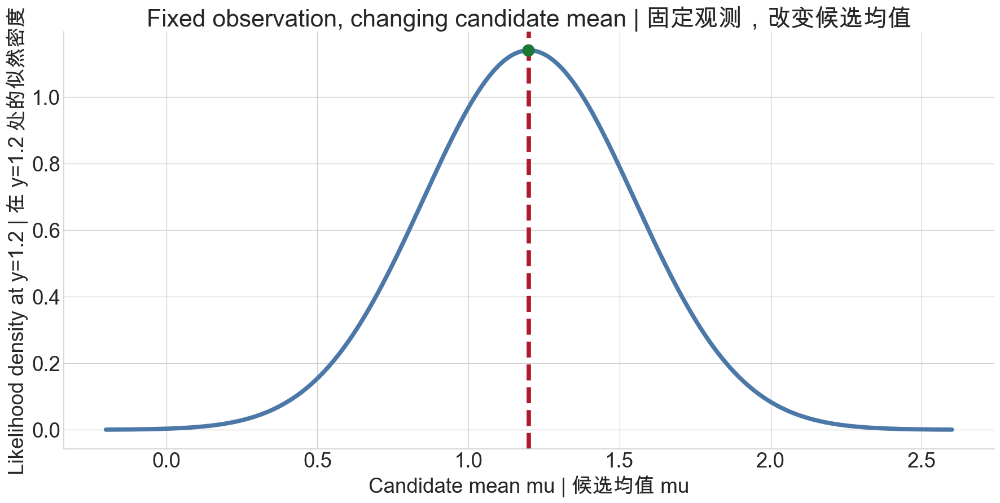

Observed value | 固定观测: 1.2
Highest-likelihood candidate mu | 最高似然候选 mu: 1.197


In [16]:
observed_y = 1.2
known_sigma = 0.35
candidate_mu = np.linspace(-0.2, 2.6, 500)
likelihood_curve = (
    np.exp(-0.5 * ((observed_y - candidate_mu) / known_sigma) ** 2)
    / (np.sqrt(2 * np.pi) * known_sigma)
)
best_mu = float(candidate_mu[np.argmax(likelihood_curve)])

fig, ax = plt.subplots(figsize=(16, 8), layout="constrained")
ax.plot(candidate_mu, likelihood_curve, color="#4C78A8", lw=5)
ax.axvline(observed_y, color="#B2182B", lw=5, ls="--")
ax.scatter([best_mu], [likelihood_curve.max()], s=180, color="#1B7837", zorder=3)
ax.set(
    title="Fixed observation, changing candidate mean | 固定观测，改变候选均值",
    xlabel="Candidate mean mu | 候选均值 mu",
    ylabel="Likelihood density at y=1.2 | 在 y=1.2 处的似然密度",
)
plt.show()
print("Observed value | 固定观测:", observed_y)
print("Highest-likelihood candidate mu | 最高似然候选 mu:", f"{best_mu:.3f}")


## 10. From toy trajectories to a Monte Carlo likelihood
## 10. 从玩具轨迹到 Monte Carlo 似然

**English.** This section deliberately uses invented teaching values.
There is no mouse ID, paper parameter, fitted circuit, or model winner.
We reuse the simple production-removal process from Micro-lab 2:

**中文。** 本节有意使用人为设置的教学数值，不包含小鼠编号、论文参数、
已拟合 circuit 或模型胜者。我们继续使用微实验 2 的简单产生-清除过程：

$$
dX=(p-rX)\,ds+\sqrt{2\epsilon}\,dW_s.
$$

**English.** The aim is to see how an endpoint cloud becomes one
likelihood contribution. Later, the same numerical steps are applied
to each of the 294 real conditional transitions.

**中文。** 目标是亲眼看到“终点云”如何变成一项似然贡献。后续真实拟合
会把同样的数值步骤应用于 294 条条件转移。

### Step 1. Define one toy observation
### 第 1 步：定义一条玩具观测

**English.** We invent a starting value, an observation duration, and
one recorded endpoint. The model must answer: how much density does it
place near this fixed endpoint?

**中文。** 我们人为指定起点、观察时长和一个记录终点。模型需要回答：
在这个固定终点附近，它给出了多高的密度？


In [17]:
TOY_PRODUCTION_RATE = 0.08
TOY_REMOVAL_COEFFICIENT = 0.04
TOY_EPSILON = 0.025
TOY_X_START = 1.00
TOY_OBSERVED_END = 1.65
TOY_DURATION_DAYS = 20
TOY_STEP_DAYS = 1.0
TOY_PATH_COUNT = 4000
TOY_SEED = 10010

toy_observation = pd.DataFrame({
    "quantity | 数量": [
        "production p | 产生率 p",
        "removal coefficient r | 清除系数 r",
        "noise intensity epsilon | 噪声强度 epsilon",
        "start X | 起点 X",
        "observed endpoint | 观测终点",
        "duration | 时长",
    ],
    "value | 数值": [
        TOY_PRODUCTION_RATE,
        TOY_REMOVAL_COEFFICIENT,
        TOY_EPSILON,
        TOY_X_START,
        TOY_OBSERVED_END,
        TOY_DURATION_DAYS,
    ],
    "unit | 单位": [
        "X/day", "1/day", "X^2/day", "X", "X", "day",
    ],
})
print("Toy observation only | 仅为教学玩具观测")
toy_observation


Toy observation only | 仅为教学玩具观测


,quantity | 数量,value | 数值,unit | 单位
0,production p | 产生率 p,0.080,X/day
1,removal coefficient r | 清除系数 r,0.040,1/day
2,noise intensity epsilon | 噪声强度 epsilon,0.025,X^2/day
3,start X | 起点 X,1.000,X
4,observed endpoint | 观测终点,1.650,X
5,duration | 时长,20.000,day


### Step 2. Perform one numerical update
### 第 2 步：完成一次数值更新

### Micro-lab 5. Separate production, removal, drift, and noise
### 微实验 5：分开查看产生、清除、漂移与噪声

**Goal.** Implement one Euler-Maruyama step without hiding any term.

**目标。** 不隐藏任何中间项，完整计算一次 Euler-Maruyama 更新。

**Predict first.** Will your chosen random value $z$ reinforce or
oppose the deterministic drift?

**先预测。** 你选择的随机数 $z$ 会加强还是抵消确定性漂移？

**Editable variables.** Change $p$, $r$, $\epsilon$, $X$, $\Delta s$,
and $z$ under `EDIT HERE`.

**可编辑变量。** 修改 `EDIT HERE` 下的 $p$、$r$、$\epsilon$、$X$、
$\Delta s$ 和 $z$。

$$
X_{\mathrm{new}}
=\left|X+(p-rX)\Delta s+\sqrt{2\epsilon\Delta s}\,z\right|.
$$

**Reading the result.** Production and removal determine the average
direction. One random increment can still move in the opposite
direction. Reflection keeps $X$ non-negative.

**阅读结果。** 产生与清除决定平均方向，但一次随机增量仍可能向相反方向
移动。绝对值反射保证 $X$ 不为负。

**Limit.** One update explains the algorithm; it is not a fitted model
and cannot evaluate goodness of fit.

**局限。** 单步更新只解释算法，并不是已拟合模型，也不能评价拟合优劣。


         component | 分项                       calculation | 计算  value | 数值
      production p | 产生                                      p     0.08000
        removal rX | 清除                                  r * X     0.04000
   net drift p-rX | 净漂移                              p - r * X     0.04000
 drift increment | 漂移增量                       (p - r * X) * ds     0.04000
    random scale | 随机尺度                 sqrt(2 * epsilon * ds)     0.22361
random increment | 随机增量             sqrt(2 * epsilon * ds) * z     0.43287
       raw new X | 原始新值 X + drift increment + random increment     1.47287
reflected new X | 反射后新值                         abs(raw new X)     1.47287


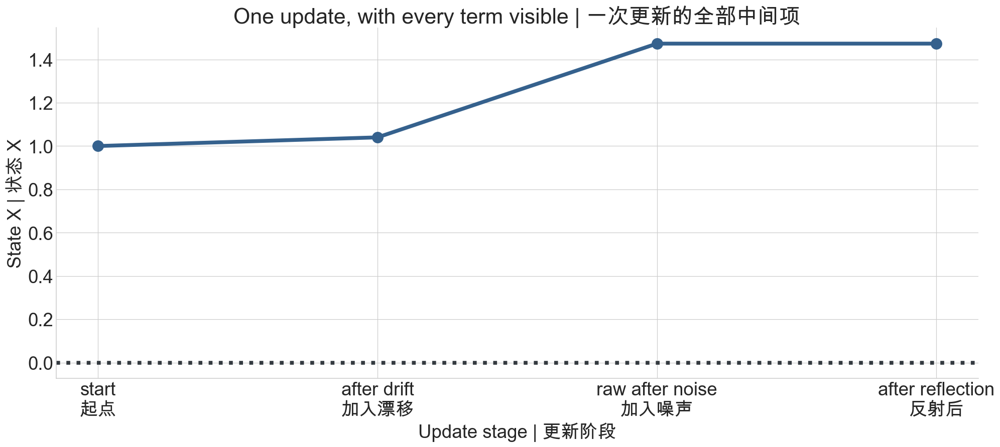

In [18]:
# EDIT HERE | 只修改这里
PRACTICE_5_PRODUCTION = 0.08
PRACTICE_5_REMOVAL_COEFFICIENT = 0.04
PRACTICE_5_EPSILON = 0.025
PRACTICE_5_X = 1.00
PRACTICE_5_STEP_DAYS = 1.0
PRACTICE_5_Z = np.random.default_rng().normal()*2.0

if (
    PRACTICE_5_PRODUCTION < 0
    or PRACTICE_5_REMOVAL_COEFFICIENT < 0
    or PRACTICE_5_EPSILON <= 0
    or PRACTICE_5_X < 0
    or PRACTICE_5_STEP_DAYS <= 0
):
    raise ValueError(
        "Use non-negative rates and X, positive epsilon and step. | "
        "产生率、清除系数与 X 不能为负，epsilon 和步长必须为正。"
    )

practice_5_production_term = PRACTICE_5_PRODUCTION
practice_5_removal_term = (
    PRACTICE_5_REMOVAL_COEFFICIENT * PRACTICE_5_X
)
practice_5_drift = (
    practice_5_production_term - practice_5_removal_term
)
practice_5_drift_increment = (
    practice_5_drift * PRACTICE_5_STEP_DAYS
)
practice_5_random_scale = np.sqrt(
    2 * PRACTICE_5_EPSILON * PRACTICE_5_STEP_DAYS
)
practice_5_random_increment = (
    practice_5_random_scale * PRACTICE_5_Z
)
practice_5_after_drift = (
    PRACTICE_5_X + practice_5_drift_increment
)
practice_5_raw = (
    practice_5_after_drift + practice_5_random_increment
)
practice_5_reflected = abs(practice_5_raw)

practice_5_components = pd.DataFrame({
    "component | 分项": [
        "production p | 产生",
        "removal rX | 清除",
        "net drift p-rX | 净漂移",
        "drift increment | 漂移增量",
        "random scale | 随机尺度",
        "random increment | 随机增量",
        "raw new X | 原始新值",
        "reflected new X | 反射后新值",
    ],
    "calculation | 计算": [
        "p",
        "r * X",
        "p - r * X",
        "(p - r * X) * ds",
        "sqrt(2 * epsilon * ds)",
        "sqrt(2 * epsilon * ds) * z",
        "X + drift increment + random increment",
        "abs(raw new X)",
    ],
    "value | 数值": [
        practice_5_production_term,
        practice_5_removal_term,
        practice_5_drift,
        practice_5_drift_increment,
        practice_5_random_scale,
        practice_5_random_increment,
        practice_5_raw,
        practice_5_reflected,
    ],
})
print(practice_5_components.round(5).to_string(index=False))

fig, ax = plt.subplots(figsize=(18, 8), layout="constrained")
stages = [
    PRACTICE_5_X,
    practice_5_after_drift,
    practice_5_raw,
    practice_5_reflected,
]
ax.plot(
    np.arange(4),
    stages,
    color="#35618D",
    lw=5,
    marker="o",
    ms=14,
)
ax.axhline(0, color="#343A40", lw=5, ls=":")
ax.set(
    title="One update, with every term visible | 一次更新的全部中间项",
    xlabel="Update stage | 更新阶段",
    ylabel="State X | 状态 X",
    xticks=np.arange(4),
    xticklabels=[
        "start\n起点",
        "after drift\n加入漂移",
        "raw after noise\n加入噪声",
        "after reflection\n反射后",
    ],
)
plt.show()


### Step 3. Build complete paths
### 第 3 步：生成完整路径

A trajectory is obtained by repeating the numerical update
from Step 2. Every path below uses the same production rate $p$, removal
coefficient $r$, noise intensity $\epsilon$, starting value $X_0$, and
duration. The paths differ only because each one receives a different
sequence of independent values $z_s\sim N(0,1)$.

一条完整轨迹来自反复执行第 2 步的数值更新。下图所有轨迹使用
相同的产生率 $p$、清除系数 $r$、噪声强度 $\epsilon$、起点 $X_0$ 和时长；
它们的差异只来自各自独立的随机数序列 $z_s\sim N(0,1)$。

For the toy model, the noise-free balance is

对这个玩具模型，无噪声平衡点为

$$
X^*=\frac{p}{r}
=\frac{0.08}{0.04}=2.
$$

Because $X_0=1<X^*$, the deterministic tendency initially
points upward. Random noise can still make an individual step rise or
fall. Random therefore does not mean directionless.

因为 $X_0=1<X^*$，确定性趋势最初指向上方；但随机噪声仍可使
任意一步上升或下降。因此“随机”并不等于“完全没有整体趋势”。

Change only `STEP3_SEED` and rerun this cell. The same seed
reproduces the same pseudo-random sequences; a different seed generates
another valid set of paths. A seed controls computation, not biology.

只修改 `STEP3_SEED` 并重新运行本单元。相同 seed 会复现相同
的伪随机序列，不同 seed 会生成另一组同样有效的轨迹。Seed 是计算控制量，
不是生物学参数。


Step 3 seed | 第 3 步 seed: 2026

First five updates | 前五次更新
 day | 日  start_X | 起点  production | 产生  removal | 清除  drift_increment | 漂移增量       z  noise_increment | 噪声增量  raw_X | 原始 X  new_X | 新 X
       1        1.0000             0.08        0.0400                  0.0400 -0.7931                 -0.1773        0.8627       0.8627
       2        0.8627             0.08        0.0345                  0.0455  0.2406                  0.0538        0.9619       0.9619
       3        0.9619             0.08        0.0385                  0.0415 -1.8963                 -0.4240        0.5794       0.5794
       4        0.5794             0.08        0.0232                  0.0568  1.3958                  0.3121        0.9484       0.9484
       5        0.9484             0.08        0.0379                  0.0421  0.6383                  0.1427        1.1332       1.1332

Last five updates | 最后五次更新
 day | 日  start_X | 起点  production | 产生  removal | 清除  drift_increment | 漂移增量       z  nois

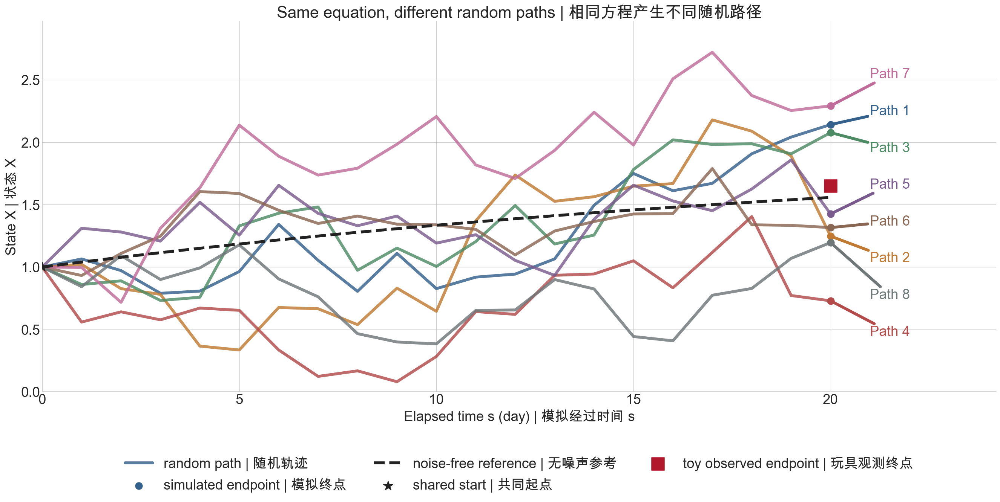

In [19]:
# EDIT HERE | 只修改这里
STEP3_SEED = 2026

toy_single_rng = np.random.default_rng(STEP3_SEED)
toy_single_x = TOY_X_START
toy_single_rows = []
for toy_day in range(1, TOY_DURATION_DAYS + 1):
    toy_production = TOY_PRODUCTION_RATE
    toy_removal = TOY_REMOVAL_COEFFICIENT * toy_single_x
    toy_drift = toy_production - toy_removal
    toy_z = toy_single_rng.normal()
    toy_noise = np.sqrt(
        2 * TOY_EPSILON * TOY_STEP_DAYS
    ) * toy_z
    toy_raw = (
        toy_single_x
        + toy_drift * TOY_STEP_DAYS
        + toy_noise
    )
    toy_new_x = abs(toy_raw)
    toy_single_rows.append({
        "day | 日": toy_day,
        "start_X | 起点": toy_single_x,
        "production | 产生": toy_production,
        "removal | 清除": toy_removal,
        "drift_increment | 漂移增量": (
            toy_drift * TOY_STEP_DAYS
        ),
        "z": toy_z,
        "noise_increment | 噪声增量": toy_noise,
        "raw_X | 原始 X": toy_raw,
        "new_X | 新 X": toy_new_x,
    })
    toy_single_x = toy_new_x
toy_single_table = pd.DataFrame(toy_single_rows)
print("Step 3 seed | 第 3 步 seed:", STEP3_SEED)
print("\nFirst five updates | 前五次更新")
print(toy_single_table.head().round(4).to_string(index=False))
print("\nLast five updates | 最后五次更新")
print(toy_single_table.tail().round(4).to_string(index=False))

toy_preview_rng = np.random.default_rng(STEP3_SEED + 1)
toy_preview_count = 8
toy_preview_x = np.full(toy_preview_count, TOY_X_START)
toy_preview_history = [toy_preview_x.copy()]
for _ in range(TOY_DURATION_DAYS):
    toy_preview_drift = (
        TOY_PRODUCTION_RATE
        - TOY_REMOVAL_COEFFICIENT * toy_preview_x
    )
    toy_preview_x = np.abs(
        toy_preview_x
        + toy_preview_drift * TOY_STEP_DAYS
        + np.sqrt(2 * TOY_EPSILON * TOY_STEP_DAYS)
        * toy_preview_rng.normal(size=toy_preview_count)
    )
    toy_preview_history.append(toy_preview_x.copy())
toy_preview_history = np.asarray(toy_preview_history)

toy_reference_x = TOY_X_START
toy_reference_history = [toy_reference_x]
for _ in range(TOY_DURATION_DAYS):
    toy_reference_x = (
        toy_reference_x
        + (
            TOY_PRODUCTION_RATE
            - TOY_REMOVAL_COEFFICIENT * toy_reference_x
        )
        * TOY_STEP_DAYS
    )
    toy_reference_history.append(toy_reference_x)
toy_reference_history = np.asarray(toy_reference_history)

toy_path_summary = pd.DataFrame({
    "path | 路径": [
        f"Path {index + 1}"
        for index in range(toy_preview_count)
    ],
    "simulated endpoint | 模拟终点": toy_preview_history[-1],
})
toy_path_summary[
    "endpoint minus observation | 终点减观测"
] = (
    toy_path_summary["simulated endpoint | 模拟终点"]
    - TOY_OBSERVED_END
)
print("\nPath endpoint summary | 路径终点汇总")
print(toy_path_summary.round(4).to_string(index=False))

toy_path_colors = [
    "#35618D", "#C07A32", "#4D8B64", "#B34B4B",
    "#7A5B8E", "#8A6753", "#C06C9A", "#6F7779",
]
toy_path_endpoints = toy_preview_history[-1]
toy_label_order = np.argsort(toy_path_endpoints)
toy_label_low = max(
    0.0,
    float(toy_path_endpoints.min()) - 0.25,
)
toy_label_high = max(
    toy_label_low + 1.4,
    float(toy_path_endpoints.max()) + 0.25,
)
toy_sorted_label_y = np.linspace(
    toy_label_low,
    toy_label_high,
    toy_preview_count,
)
toy_label_y = np.empty(toy_preview_count)
toy_label_y[toy_label_order] = toy_sorted_label_y

fig, ax = plt.subplots(figsize=(24, 12), layout="constrained")
toy_elapsed_days = np.arange(TOY_DURATION_DAYS + 1)
for path_index, color in enumerate(toy_path_colors):
    ax.plot(
        toy_elapsed_days,
        toy_preview_history[:, path_index],
        color=color,
        lw=5,
        alpha=0.82,
        label=(
            "random path | 随机轨迹"
            if path_index == 0
            else None
        ),
    )
    ax.scatter(
        [TOY_DURATION_DAYS],
        [toy_path_endpoints[path_index]],
        color=color,
        s=150,
        zorder=5,
        label=(
            "simulated endpoint | 模拟终点"
            if path_index == 0
            else None
        ),
    )
    ax.annotate(
        f"Path {path_index + 1}",
        xy=(
            TOY_DURATION_DAYS,
            toy_path_endpoints[path_index],
        ),
        xytext=(
            TOY_DURATION_DAYS + 1.0,
            toy_label_y[path_index],
        ),
        fontsize=24,
        color=color,
        va="center",
        arrowprops={
            "arrowstyle": "-",
            "color": color,
            "linewidth": 5,
        },
    )
ax.plot(
    toy_elapsed_days,
    toy_reference_history,
    color="#222222",
    ls="--",
    lw=5,
    label="noise-free reference | 无噪声参考",
)
ax.scatter(
    [0],
    [TOY_X_START],
    color="#222222",
    marker="*",
    s=300,
    zorder=6,
    label="shared start | 共同起点",
)
ax.scatter(
    [TOY_DURATION_DAYS],
    [TOY_OBSERVED_END],
    color="#B2182B",
    marker="s",
    s=500,
    zorder=10,
    label="toy observed endpoint | 玩具观测终点",
)
ax.set(
    title=(
        "Same equation, different random paths | "
        "相同方程产生不同随机路径"
    ),
    xlabel="Elapsed time s (day) | 模拟经过时间 s",
    ylabel="State X | 状态 X",
    xlim=(0, TOY_DURATION_DAYS + 4.2),
    ylim=(
        0,
        max(
            toy_label_high,
            float(toy_preview_history.max()),
            TOY_OBSERVED_END,
        )
        + 0.25,
    ),
)
ax.legend(
    frameon=False,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.14),
    ncol=3,
)
plt.show()


**How to read the figure.** Each colored line is one possible history,
not one fitted model. The dashed black line removes noise and shows the
deterministic tendency. The star is the shared starting state, colored
circles are simulated endpoints, and the red square is the invented
observation. The observation is not part of any simulated path.

**如何读图。** 每条彩色线是一种可能的历史，并不是一个单独拟合的模型。
黑色虚线去掉了噪声，用来显示确定性趋势；星号是共同起点，彩色圆点是模拟
终点，红色方块是人为设定的观测终点。该观测点不属于任何一条模拟轨迹。

**Scientific meaning.** A stochastic model predicts a distribution of
possible paths. Step 4 therefore repeats the process many times and
keeps all endpoints instead of selecting whichever line looks closest.

**科学含义。** 随机模型预测的是一组可能轨迹的分布。因此第 4 步会大量
重复模拟并保留全部终点，而不是挑选视觉上最接近观测的一条线。


### Step 4. Repeat and keep only the endpoints
### 第 4 步：重复模拟并只保留终点

Likelihood does not choose the single path that looks most
like the observation. It asks where the whole endpoint distribution
places its mass.

似然不会挑选一条“最像观测”的路径，而是检查完整终点分布把
多少分布质量放在观测附近。


Endpoint array shape | 终点数组形状: (4000,)
First 12 endpoints | 前 12 个终点: [1.4494 2.6854 0.3152 0.7236 0.0851 0.6839 1.3764 2.0961 1.9434 0.7508
 2.6721 1.5284]
Endpoint mean and sample SD | 终点均值与样本 SD: 1.5583, 0.6872


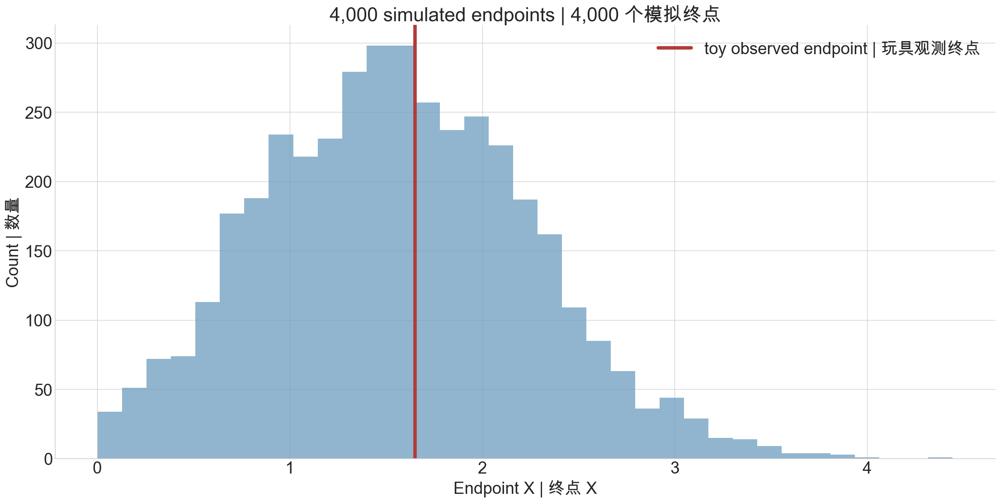

In [20]:
toy_endpoint_rng = np.random.default_rng(TOY_SEED + 2)
toy_endpoints = np.full(TOY_PATH_COUNT, TOY_X_START)
for _ in range(TOY_DURATION_DAYS):
    toy_endpoint_drift = (
        TOY_PRODUCTION_RATE
        - TOY_REMOVAL_COEFFICIENT * toy_endpoints
    )
    toy_endpoints = np.abs(
        toy_endpoints
        + toy_endpoint_drift * TOY_STEP_DAYS
        + np.sqrt(2 * TOY_EPSILON * TOY_STEP_DAYS)
        * toy_endpoint_rng.normal(size=TOY_PATH_COUNT)
    )

print("Endpoint array shape | 终点数组形状:", toy_endpoints.shape)
print(
    "First 12 endpoints | 前 12 个终点:",
    np.round(toy_endpoints[:12], 4),
)
print(
    "Endpoint mean and sample SD | 终点均值与样本 SD:",
    f"{toy_endpoints.mean():.4f}, {toy_endpoints.std(ddof=1):.4f}",
)

fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
ax.hist(
    toy_endpoints,
    bins=35,
    color="#72A0C1",
    alpha=0.78,
)
ax.axvline(
    TOY_OBSERVED_END,
    color="#B33A3A",
    lw=5,
    label="toy observed endpoint | 玩具观测终点",
)
ax.set(
    title="4,000 simulated endpoints | 4,000 个模拟终点",
    xlabel="Endpoint X | 终点 X",
    ylabel="Count | 数量",
)
ax.legend(frameon=False)
plt.show()


### Step 5. Turn the endpoint cloud into a density
### 第 5 步：把终点云转换为密度

#### Step 5A. Understand one Gaussian kernel
#### 第 5A 步：先理解一条 Gaussian kernel

Every simulated endpoint $x_i$ becomes the center of one
Gaussian kernel:

每个模拟终点 $x_i$ 都会成为一条 Gaussian kernel 的中心：

$$
K_h(x;x_i)
=
\frac{1}{\sqrt{2\pi}h}
\exp\left[-\frac{(x-x_i)^2}{2h^2}\right].
$$

The center $x_i$ moves the mound left or right. The
bandwidth $h$ controls its width. A smaller $h$ gives a narrower,
taller mound; a larger $h$ gives a wider, shorter mound. Its area over
the complete real line remains 1.

中心 $x_i$ 决定小峰左右位置，带宽 $h$ 决定宽窄。较小的 $h$
产生更窄、更高的小峰，较大的 $h$ 产生更宽、更低的小峰；但在完整实数轴上
的总面积始终为 1。

For this picture only, use the rounded teaching value
$h=0.12$. The data-driven bandwidth used by the likelihood is calculated
later in Step 5C.

本图暂时使用便于阅读的教学带宽 $h=0.12$。似然真正使用的
数据驱动带宽将在 Step 5C 中计算。


One Gaussian kernel | 一条 Gaussian kernel
              quantity | 数量  value | 数值
            center x_i | 中心    1.539625
teaching bandwidth h | 教学带宽    0.120000
      numerical area | 数值面积    0.999999


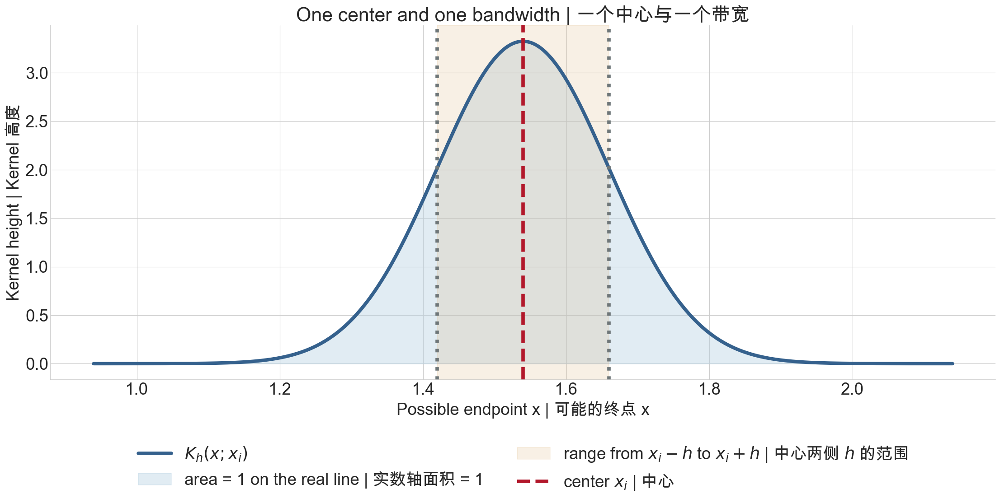

In [21]:
TEACHING_KERNEL_BANDWIDTH = 0.12
toy_sorted_endpoints = np.sort(toy_endpoints)
toy_kernel_center = float(
    toy_sorted_endpoints[len(toy_sorted_endpoints) // 2]
)

toy_one_kernel_grid = np.linspace(
    toy_kernel_center - 5 * TEACHING_KERNEL_BANDWIDTH,
    toy_kernel_center + 5 * TEACHING_KERNEL_BANDWIDTH,
    600,
)
toy_one_kernel = (
    np.exp(
        -0.5
        * (
            (toy_one_kernel_grid - toy_kernel_center)
            / TEACHING_KERNEL_BANDWIDTH
        ) ** 2
    )
    / (
        np.sqrt(2 * np.pi)
        * TEACHING_KERNEL_BANDWIDTH
    )
)
toy_one_kernel_area = float(
    np.trapezoid(toy_one_kernel, toy_one_kernel_grid)
)
toy_one_kernel_summary = pd.DataFrame({
    "quantity | 数量": [
        "center x_i | 中心",
        "teaching bandwidth h | 教学带宽",
        "numerical area | 数值面积",
    ],
    "value | 数值": [
        toy_kernel_center,
        TEACHING_KERNEL_BANDWIDTH,
        toy_one_kernel_area,
    ],
})
print("One Gaussian kernel | 一条 Gaussian kernel")
print(toy_one_kernel_summary.round(6).to_string(index=False))

fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
ax.plot(
    toy_one_kernel_grid,
    toy_one_kernel,
    color="#35618D",
    lw=5,
    label=r"$K_h(x;x_i)$",
)
ax.fill_between(
    toy_one_kernel_grid,
    0,
    toy_one_kernel,
    color="#B8D2E3",
    alpha=0.42,
    label="area = 1 on the real line | 实数轴面积 = 1",
)
ax.axvspan(
    toy_kernel_center - TEACHING_KERNEL_BANDWIDTH,
    toy_kernel_center + TEACHING_KERNEL_BANDWIDTH,
    color="#D8A25E",
    alpha=0.16,
    label=(
        r"range from $x_i-h$ to $x_i+h$ | "
        r"中心两侧 $h$ 的范围"
    ),
)
ax.axvline(
    toy_kernel_center,
    color="#B2182B",
    ls="--",
    lw=5,
    label=r"center $x_i$ | 中心",
)
for offset in [-1, 1]:
    ax.axvline(
        toy_kernel_center
        + offset * TEACHING_KERNEL_BANDWIDTH,
        color="#6F7779",
        ls=":",
        lw=5,
    )
ax.set(
    title="One center and one bandwidth | 一个中心与一个带宽",
    xlabel="Possible endpoint x | 可能的终点 x",
    ylabel="Kernel height | Kernel 高度",
)
ax.legend(
    frameon=False,
    ncol=2,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.14),
)
plt.show()


#### Step 5B. Six visible examples from 4,000 kernels
#### 第 5B 步：从 4,000 条 kernel 中展示六个例子

The six endpoints are selected near fixed percentiles so
that they span the endpoint cloud. The upper panel draws all six
kernels at full height to compare their locations and shapes. It does
not yet average them.

六个终点取自固定分位数，用来覆盖终点云的不同位置。上图把六条
kernel 都按完整高度绘制，只比较位置和形状，还没有进行平均。

The lower panel performs the averaging explicitly. Each
colored curve is divided by six, so its area changes from 1 to $1/6$.
The black line is their sum:

下图明确展示平均过程。每条彩色曲线先除以 6，所以面积从 1
变为 $1/6$；黑线是六条加权曲线之和：

$$
\widehat p_6(x)
=
\sum_{i=1}^{6}\frac{1}{6}K_i(x).
$$

These six curves remain teaching examples. The real
likelihood uses all 4,000 endpoints in Step 5C.

这六条曲线仍只是教学示例；真实似然会在 Step 5C 使用全部
4,000 个终点。


Six teaching kernels | 六条教学 kernel
kernel | 核  percentile | 分位数  center x_i | 中心
        K1              0.05         0.460073
        K2              0.20         0.941153
        K3              0.40         1.362339
        K4              0.60         1.718465
        K5              0.80         2.135742
        K6              0.95         2.723970
Area of each weighted kernel | 每条加权 kernel 的面积: 0.166667
Area under the black sum | 黑线下面积: 0.99999990


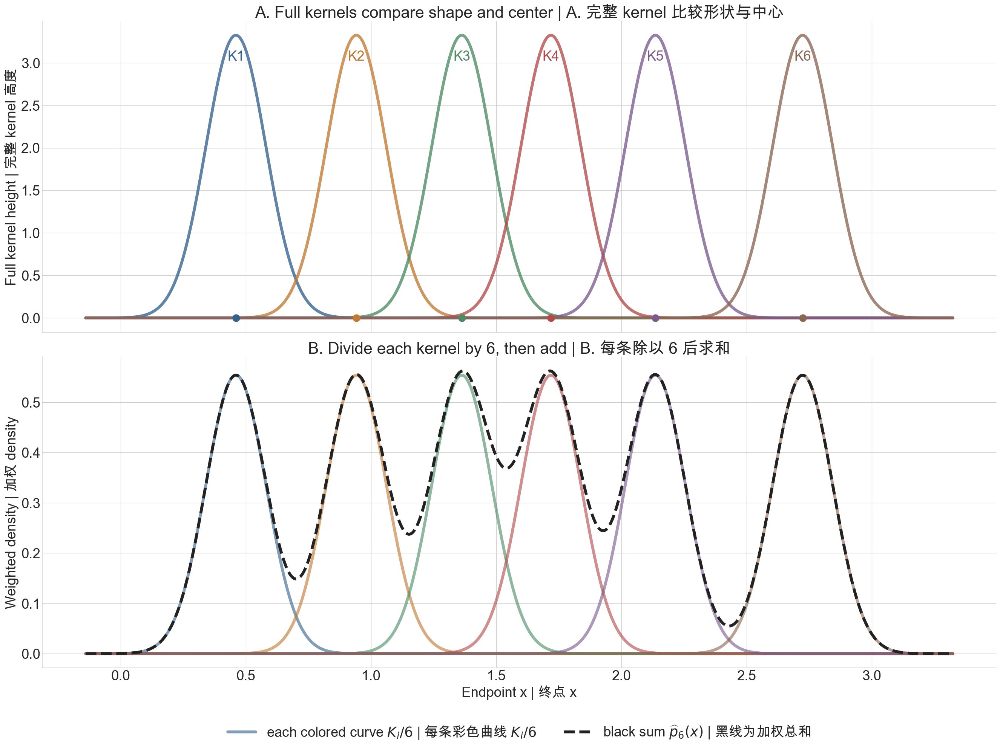

In [22]:
toy_kernel_percentiles = np.array([
    0.05, 0.20, 0.40, 0.60, 0.80, 0.95,
])
toy_kernel_indices = np.rint(
    toy_kernel_percentiles
    * (TOY_PATH_COUNT - 1)
).astype(int)
toy_kernel_examples = toy_sorted_endpoints[toy_kernel_indices]
toy_kernel_example_table = pd.DataFrame({
    "kernel | 核": [f"K{index + 1}" for index in range(6)],
    "percentile | 分位数": toy_kernel_percentiles,
    "center x_i | 中心": toy_kernel_examples,
})
print("Six teaching kernels | 六条教学 kernel")
print(toy_kernel_example_table.round(6).to_string(index=False))

toy_six_kernel_grid = np.linspace(
    toy_kernel_examples.min()
    - 5 * TEACHING_KERNEL_BANDWIDTH,
    toy_kernel_examples.max()
    + 5 * TEACHING_KERNEL_BANDWIDTH,
    900,
)
toy_six_kernel_matrix = np.column_stack([
    np.exp(
        -0.5
        * (
            (toy_six_kernel_grid - center)
            / TEACHING_KERNEL_BANDWIDTH
        ) ** 2
    )
    / (
        np.sqrt(2 * np.pi)
        * TEACHING_KERNEL_BANDWIDTH
    )
    for center in toy_kernel_examples
])
toy_six_weighted_kernels = (
    toy_six_kernel_matrix / len(toy_kernel_examples)
)
toy_six_weighted_sum = toy_six_weighted_kernels.sum(axis=1)
toy_six_weighted_area = float(
    np.trapezoid(
        toy_six_weighted_sum,
        toy_six_kernel_grid,
    )
)
assert np.allclose(
    toy_six_weighted_sum,
    toy_six_weighted_kernels.sum(axis=1),
)
assert abs(toy_six_weighted_area - 1.0) < 2e-3
print(
    "Area of each weighted kernel | "
    "每条加权 kernel 的面积:",
    f"{1 / len(toy_kernel_examples):.6f}",
)
print(
    "Area under the black sum | 黑线下面积:",
    f"{toy_six_weighted_area:.8f}",
)

toy_kernel_colors = [
    "#35618D", "#C07A32", "#4D8B64",
    "#B34B4B", "#7A5B8E", "#8A6753",
]
toy_teaching_peak = float(
    1
    / (
        np.sqrt(2 * np.pi)
        * TEACHING_KERNEL_BANDWIDTH
    )
)
fig, axes = plt.subplots(
    2,
    1,
    figsize=(24, 18),
    sharex=True,
    layout="constrained",
)
for kernel_index, (center, color) in enumerate(
    zip(toy_kernel_examples, toy_kernel_colors)
):
    axes[0].plot(
        toy_six_kernel_grid,
        toy_six_kernel_matrix[:, kernel_index],
        color=color,
        lw=5,
        alpha=0.78,
    )
    axes[0].scatter(
        [center],
        [0],
        color=color,
        s=150,
        zorder=5,
    )
    axes[0].text(
        center,
        toy_teaching_peak * 0.90,
        f"K{kernel_index + 1}",
        color=color,
        fontsize=24,
        ha="center",
        va="bottom",
    )
    axes[1].plot(
        toy_six_kernel_grid,
        toy_six_weighted_kernels[:, kernel_index],
        color=color,
        lw=5,
        alpha=0.62,
        label=(
            r"each colored curve $K_i/6$ | "
            r"每条彩色曲线 $K_i/6$"
            if kernel_index == 0
            else None
        ),
    )
axes[1].plot(
    toy_six_kernel_grid,
    toy_six_weighted_sum,
    color="#222222",
    ls="--",
    lw=5,
    label=(
        r"black sum $\widehat p_6(x)$ | 黑线为加权总和"
    ),
)
axes[0].set(
    title=(
        "A. Full kernels compare shape and center | "
        "A. 完整 kernel 比较形状与中心"
    ),
    ylabel="Full kernel height | 完整 kernel 高度",
)
axes[1].set(
    title=(
        "B. Divide each kernel by 6, then add | "
        "B. 每条除以 6 后求和"
    ),
    xlabel="Endpoint x | 终点 x",
    ylabel="Weighted density | 加权 density",
)
axes[1].legend(
    frameon=False,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.14),
    ncol=2,
)
plt.show()


#### Step 5C. Average all 4,000 kernels
#### 第 5C 步：平均全部 4,000 条 kernel

Now replace the rounded teaching bandwidth with the
data-driven robust Silverman bandwidth:

现在用数据驱动的稳健 Silverman 带宽替代前面的教学近似值：

$$
h
=
0.9\min\left(SD,\frac{IQR}{1.349}\right)N^{-1/5}.
$$

$SD$ and $IQR$ describe the endpoint spread, while
$N^{-1/5}$ adjusts the smoothing for the number of simulated endpoints.
The code displays every quantity used in this calculation.

$SD$ 和 $IQR$ 描述终点的离散程度，$N^{-1/5}$ 根据模拟终点
数量调整平滑程度。下面的代码会显示带宽计算中使用的每一个量。

The likelihood uses every simulated endpoint:

似然使用全部模拟终点：

$$
\widehat p(x)
=
\frac{1}{N}\sum_{i=1}^{N}K_h(x;x_i),
\qquad N=4000.
$$

Step 5B used six curves with weight $1/6$. Here all 4,000
curves receive weight $1/4000$. Gaussian kernels extend slightly below
zero, while the reflected model requires $X\ge0$, so the mixture is
divided by its total positive-side mass.

Step 5B 的六条曲线各占 $1/6$；这里的 4,000 条曲线各占
$1/4000$。Gaussian kernel 会稍微延伸到零点左侧，而反射模型要求
$X\ge0$，所以最终混合密度还要除以正区间总质量。


Data-driven bandwidth | 数据驱动带宽
                         quantity | 数量  value | 数值
                     sample SD | 样本 SD    0.687201
                           IQR / 1.349    0.722842
        selected robust scale | 选用稳健尺度    0.687201
                              N^(-1/5)    0.190365
Silverman bandwidth h | Silverman 带宽 h    0.117737
Teaching h and likelihood h | 教学带宽与似然带宽: 0.120000 and | 与 0.117737
Positive-side mass before normalization | 归一化前正区间质量: 0.99694187
Integral of normalized KDE on X>=0 | 归一化 KDE 在 X>=0 的积分: 0.99999918


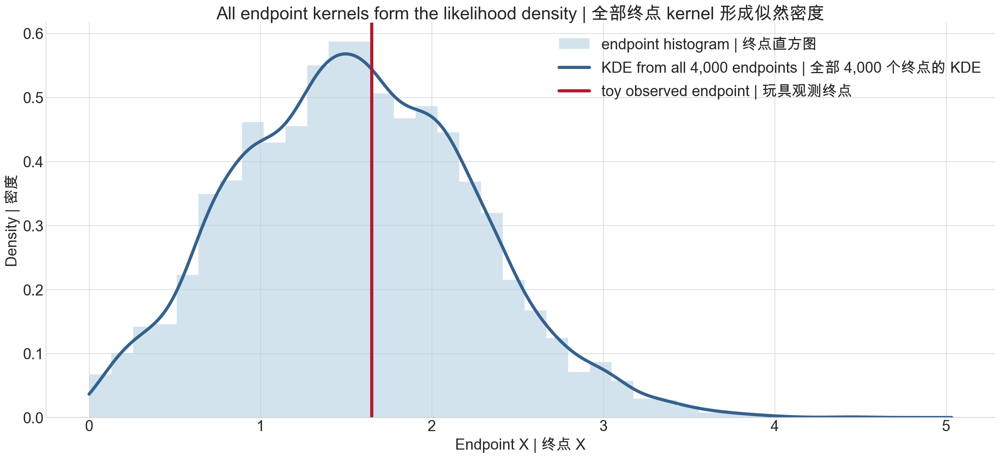

In [23]:
toy_endpoint_sd = toy_endpoints.std(ddof=1)
toy_q1, toy_q3 = np.quantile(
    toy_endpoints,
    [0.25, 0.75],
)
toy_iqr = toy_q3 - toy_q1
toy_robust_scale = min(
    toy_endpoint_sd,
    toy_iqr / 1.349,
)
toy_sample_size_factor = TOY_PATH_COUNT ** (-1 / 5)
toy_bandwidth = max(
    0.9
    * toy_robust_scale
    * toy_sample_size_factor,
    1e-3,
)
toy_bandwidth_steps = pd.DataFrame({
    "quantity | 数量": [
        "sample SD | 样本 SD",
        "IQR / 1.349",
        "selected robust scale | 选用稳健尺度",
        "N^(-1/5)",
        "Silverman bandwidth h | Silverman 带宽 h",
    ],
    "value | 数值": [
        toy_endpoint_sd,
        toy_iqr / 1.349,
        toy_robust_scale,
        toy_sample_size_factor,
        toy_bandwidth,
    ],
})
print("Data-driven bandwidth | 数据驱动带宽")
print(toy_bandwidth_steps.round(6).to_string(index=False))
print(
    "Teaching h and likelihood h | 教学带宽与似然带宽:",
    f"{TEACHING_KERNEL_BANDWIDTH:.6f}",
    "and | 与",
    f"{toy_bandwidth:.6f}",
)

toy_positive_mass = ndtr(
    toy_endpoints / toy_bandwidth
).mean()
toy_grid = np.linspace(
    0,
    float(toy_endpoints.max() + 5 * toy_bandwidth),
    900,
)
toy_grid_z = (
    toy_grid[:, None] - toy_endpoints[None, :]
) / toy_bandwidth
toy_grid_density = (
    np.exp(-0.5 * toy_grid_z**2).mean(axis=1)
    / (np.sqrt(2 * np.pi) * toy_bandwidth)
    / toy_positive_mass
)
toy_density_integral = float(
    np.trapezoid(toy_grid_density, toy_grid)
)
print(
    "Positive-side mass before normalization | "
    "归一化前正区间质量:",
    f"{toy_positive_mass:.8f}",
)
print(
    "Integral of normalized KDE on X>=0 | "
    "归一化 KDE 在 X>=0 的积分:",
    f"{toy_density_integral:.8f}",
)
assert abs(toy_density_integral - 1.0) < 2e-3

fig, ax = plt.subplots(figsize=(22, 10), layout="constrained")
ax.hist(
    toy_endpoints,
    bins=35,
    density=True,
    color="#B8D2E3",
    alpha=0.62,
    label="endpoint histogram | 终点直方图",
)
ax.plot(
    toy_grid,
    toy_grid_density,
    color="#35618D",
    lw=5,
    label="KDE from all 4,000 endpoints | 全部 4,000 个终点的 KDE",
)
ax.axvline(
    TOY_OBSERVED_END,
    color="#B2182B",
    lw=5,
    label="toy observed endpoint | 玩具观测终点",
)
ax.set(
    title="All endpoint kernels form the likelihood density | 全部终点 kernel 形成似然密度",
    xlabel="Endpoint X | 终点 X",
    ylabel="Density | 密度",
)
ax.legend(frameon=False)
plt.show()


**Density is not point probability.** For a very narrow interval of
width $\Delta x$ around $x$, its probability is approximately
$\widehat p(x)\Delta x$. Step 6 evaluates the complete 4,000-kernel KDE
at the observed endpoint. It never selects one of K1–K6.

**Density 不是单点概率。** 对 $x$ 附近一个宽度为 $\Delta x$ 的很窄区间，
其概率近似为 $\widehat p(x)\Delta x$。第 6 步会在观测终点读取完整的
4,000-kernel KDE，而不会从 K1–K6 中挑选一条。


### Step 6. Read density, take log, and add contributions
### 第 6 步：读取密度、取对数并汇总

For one observation, evaluate the KDE at the fixed
endpoint $x_{\mathrm{obs}}$ and take its logarithm:

对一条观测，在固定终点 $x_{\mathrm{obs}}$ 处读取 KDE，
然后取对数：

$$
\ell=\log \widehat p(x_{\mathrm{obs}}\mid x_{\mathrm{start}}).
$$

Several observations contribute by addition. The floor at
$-15$ limits unstable Monte Carlo tail estimates; it is a numerical
convention, not a biological threshold.

多条观测的贡献通过相加汇总。$-15$ 下限用于限制 Monte Carlo
尾部估计的不稳定性，是数值约定，不是生物学阈值。


In [24]:
toy_observed_z = (
    toy_endpoints - TOY_OBSERVED_END
) / toy_bandwidth
toy_kernel_at_observation = (
    np.exp(-0.5 * toy_observed_z**2)
    / (np.sqrt(2 * np.pi) * toy_bandwidth)
)
toy_raw_density = toy_kernel_at_observation.mean()
toy_density_at_observation = (
    toy_raw_density / toy_positive_mass
)
toy_log_density = np.log(
    max(toy_density_at_observation, 1e-300)
)
toy_floored_log_density = max(
    toy_log_density,
    TRANSITION_LL_FLOOR,
)

toy_likelihood_steps = pd.DataFrame({
    "step | 步骤": [
        "mean Gaussian kernel | kernel 平均",
        "divide by positive mass | 除以非负质量",
        "take natural log | 取自然对数",
        "apply LL floor | 应用 LL 下限",
    ],
    "value | 数值": [
        toy_raw_density,
        toy_density_at_observation,
        toy_log_density,
        toy_floored_log_density,
    ],
})
print(toy_likelihood_steps.round(6).to_string(index=False))

toy_observed_endpoints = np.array([1.15, 1.65, 2.30])
toy_multiple_rows = []
for toy_endpoint in toy_observed_endpoints:
    toy_z_values = (
        toy_endpoints - toy_endpoint
    ) / toy_bandwidth
    toy_density = (
        (
            np.exp(-0.5 * toy_z_values**2)
            / (np.sqrt(2 * np.pi) * toy_bandwidth)
        ).mean()
        / toy_positive_mass
    )
    toy_ll = np.log(max(toy_density, 1e-300))
    toy_multiple_rows.append({
        "toy observed endpoint | 玩具观测终点": toy_endpoint,
        "density | 密度": toy_density,
        "raw log-density | 原始 log-density": toy_ll,
        "used contribution | 使用的贡献": max(
            toy_ll, TRANSITION_LL_FLOOR
        ),
    })
toy_multiple_likelihood = pd.DataFrame(toy_multiple_rows)
print("\nSeveral toy observations | 多条玩具观测")
print(toy_multiple_likelihood.round(5).to_string(index=False))
print(
    "Toy total LL | 玩具总 LL:",
    f"{toy_multiple_likelihood['used contribution | 使用的贡献'].sum():.5f}",
)

toy_to_real_map = pd.DataFrame({
    "toy lesson | 玩具课程": [
        "one invented start | 一个虚构起点",
        "one invented endpoint | 一个虚构终点",
        "one duration | 一个时长",
        "4,000 simulated endpoints | 4,000 个模拟终点",
        "one log-density | 一项 log-density",
        "sum a few terms | 汇总少量项",
    ],
    "real analysis | 真实分析": [
        "`x_start` in one transition row | 一行中的 `x_start`",
        "`x_end` in the same row | 同一行中的 `x_end`",
        "`delta_days` | `delta_days`",
        "4,000 paths for each final score | 每项终评使用 4,000 路径",
        "one conditional LL contribution | 一项条件 LL",
        "sum 294 contributions | 汇总 294 项",
    ],
})
#toy_to_real_map


                       step | 步骤  value | 数值
mean Gaussian kernel | kernel 平均    0.541761
divide by positive mass | 除以非负质量    0.543423
        take natural log | 取自然对数   -0.609867
       apply LL floor | 应用 LL 下限   -0.609867

Several toy observations | 多条玩具观测
 toy observed endpoint | 玩具观测终点  density | 密度  raw log-density | 原始 log-density  used contribution | 使用的贡献
                           1.15       0.46069                          -0.77503                   -0.77503
                           1.65       0.54342                          -0.60987                   -0.60987
                           2.30       0.33024                          -1.10795                   -1.10795
Toy total LL | 玩具总 LL: -2.49284


### Reusable engine for the real transitions
### 用于真实转移的可复用计算引擎

The intuition is now complete. The next two functions
perform the same update, endpoint simulation, bandwidth calculation,
non-negative normalization, and log-density sum for a transition table.

直觉部分到此完成。下面两个函数把同样的更新、终点模拟、
带宽计算、非负区间归一化和 log-density 汇总应用于转移表。

The functions are defined here but receive mouse data only
when the fitting section calls them.

此处只定义函数；直到后续拟合章节调用时，它们才会接收小鼠数据。


In [25]:
def simulate_transition_endpoints(
    frame: pd.DataFrame,
    params: dict[str, float],
    n_paths: int,
    dt_days: float,
    seed: int,
) -> np.ndarray:
    """
    Purpose: Simulate conditional endpoints from every observed start.
    Parameters: Transition table, model parameters, paths, step, and seed.
    Returns: A transition-by-path matrix of simulated endpoints.
    Units: Ages and steps in day; states in normalized X.
    Assumptions: Euler-Maruyama, fixed start-age coefficients, reflection.
    中文说明：从每条真实起点模拟条件终点，使用 Euler-Maruyama 与非负反射。
    """
    rng = np.random.default_rng(seed)
    starts = frame["x_start"].to_numpy(float)
    start_days = frame["t_start_days"].to_numpy(float)
    durations = frame["delta_days"].to_numpy(float)
    endpoints = np.repeat(starts[:, None], n_paths, axis=1)
    elapsed = 0.0
    while elapsed < float(durations.max()) - 1e-12:
        step = np.clip(durations - elapsed, 0.0, dt_days)
        active = step > 0
        if not np.any(active):
            break
        active_x = endpoints[active]
        active_step = step[active, None]
        drift = family_drift(
            active_x,
            start_days[active, None],
            params,
        )
        random_increment = (
            np.sqrt(
                2 * params["epsilon"] * active_step
            )
            * rng.normal(size=active_x.shape)
        )
        endpoints[active] = np.abs(
            active_x + drift * active_step + random_increment
        )
        elapsed += dt_days
    return endpoints


def monte_carlo_log_likelihood(
    frame: pd.DataFrame,
    params: dict[str, float],
    n_paths: int,
    dt_days: float,
    seed: int,
) -> float:
    """
    Purpose: Sum simulated log-densities at observed endpoints.
    Parameters: Transition table, model parameters, paths, step, and seed.
    Returns: One Monte Carlo log-likelihood.
    Units: Dimensionless log-density score.
    Assumptions: Robust Silverman KDE, X>=0 normalization, LL floor -15.
    中文说明：估计真实终点的核密度，并汇总全部条件转移的对数密度。
    """
    if params["epsilon"] <= 0:
        return -1e12
    endpoints = simulate_transition_endpoints(
        frame,
        params,
        n_paths=n_paths,
        dt_days=dt_days,
        seed=seed,
    )
    if not np.isfinite(endpoints).all() or endpoints.max() > 1e5:
        return -1e12

    endpoint_sd = endpoints.std(axis=1, ddof=1)
    endpoint_quartiles = np.quantile(
        endpoints, [0.25, 0.75], axis=1
    )
    endpoint_iqr = (
        endpoint_quartiles[1] - endpoint_quartiles[0]
    )
    robust_scale = np.minimum(
        endpoint_sd,
        endpoint_iqr / 1.349,
    )
    bandwidth = np.maximum(
        0.9 * robust_scale * n_paths ** (-1 / 5),
        1e-3,
    )
    observed = frame["x_end"].to_numpy(float)
    standardized = (
        endpoints - observed[:, None]
    ) / bandwidth[:, None]
    density = (
        np.exp(-0.5 * standardized**2).mean(axis=1)
        / (np.sqrt(2 * np.pi) * bandwidth)
    )
    positive_mass = ndtr(
        endpoints / bandwidth[:, None]
    ).mean(axis=1)
    density = density / np.maximum(positive_mass, 1e-12)
    contributions = np.log(np.maximum(density, 1e-300))
    return float(
        np.maximum(
            contributions,
            TRANSITION_LL_FLOOR,
        ).sum()
    )


## 11. Why a parameter search appears here
## 11. 为什么这里需要参数搜索

We have defined a score $LL(m,\theta)$, but the parameter vector
$\theta$ is unknown. Parameter search asks which allowed values make
the observed transitions most plausible. A single guessed vector would
not be a fit.

我们已经定义了 $LL(m,\theta)$，但参数 $\theta$ 未知。参数搜索要在允许
范围中寻找使真实转移最合理的数值；只计算一组猜测参数不能称为拟合。

### Where the numbers come from | 数字来源

| number | source and role | 来源与作用 |
|---|---|---|
| $2^4=16$ circuits | all combinations of four mechanisms | 四种机制的全部组合 |
| 294 terms | paper-style adjacent conditional transitions | 论文口径的相邻条件项 |
| 4,000 paths | Karin et al. Methods final likelihood resolution | 论文 Methods 的最终似然分辨率 |
| 1-day step | Karin et al. stochastic simulations | 论文随机模拟步长 |
| at least 50,000 combinations | published log-spaced parameter scan | 论文参数扫描规模 |


The tutorial search is deliberately smaller than the published
Mathematica search. Published parameter scales replace two Sobol rows
only as starting anchors; Powell may move away from them.

教程搜索预算小于论文 Mathematica 流程。论文参数尺度只替换两个 Sobol
起点作为锚点，Powell 可以离开这些数值，因此不会把论文答案直接写入拟合。

### Three optimization stages plus one common score
### 三级优化与统一最终评分

| stage | starts or action | paths | step |
|---|---:|---:|---:|
| coarse | 256 Sobol or anchor points | 256 | 4 days |
| medium | Powell from best 4 | 800 | 2 days |
| high | local Powell plus equal boundary-anchor search for every circuit | 2,000 | 1 day |
| final score | fixed fitted vector | 4,000 | 1 day |

The workload is $16\times256\times294$: 256 belongs
to the coarse stage, where each evaluation uses 256 paths. The 4,000
paths are used only to score the final candidate vectors.

高精度阶段还给每个 circuit 一个相同的论文尺度边界起点，最多做 80 次
函数评估；它只是帮助优化器找到边界，不导入论文 LL。计算量
$16\times256\times294$：256 是粗搜起点数，粗搜每次只用
256 条路径；4000 条路径只用于最终候选参数的统一评分。


**Function card | 函数说明卡**

- Cache functions save results only when data, bounds, settings, and
  signatures match. A cache changes runtime, not the calculation.
- `fit_circuit_direct(...)` performs coarse, medium, high, and final
  evaluation for one circuit.
- The boundary branch fixes $\eta_0=0$ only to help locate a boundary
  maximum. The branch with higher LL is retained.
#
- 缓存只在数据、边界、配置和指纹一致时复用结果；它只减少重复时间。
- `fit_circuit_direct(...)` 对一个 circuit 完成粗搜、中搜、高精度优化和终评。
- $\eta_0=0$ 分支只帮助寻找边界最大值，最终保留 LL 更高的参数向量。

Example | 调用示例：
`fit_circuit_direct(candidate_models.iloc[0], transitions)`


The likelihood engine accepts biological parameters. The
optimizer works more reliably in a unit cube, so the following helper
functions translate between $[0,1]^k$ and the parameter bounds. These
transformations change coordinates, not the model.

似然引擎接收生物学参数。优化器在单位立方体中更稳定，因此
下列辅助函数负责在 $[0,1]^k$ 与参数边界之间转换。坐标转换不会改变模型。


In [26]:
def unit_to_values(unit_values, names):
    """Map unit coordinates to parameter bounds. | 把单位坐标映射到参数范围。"""
    unit_values = np.asarray(unit_values, dtype=float)
    lows = np.array([PARAMETER_BOUNDS[name][0] for name in names])
    highs = np.array([PARAMETER_BOUNDS[name][1] for name in names])
    return lows + np.clip(unit_values, 0, 1) * (highs - lows)


def params_to_unit(params, names):
    """Map parameter values to unit coordinates. | 把参数值映射到单位坐标。"""
    lows = np.array([PARAMETER_BOUNDS[name][0] for name in names])
    highs = np.array([PARAMETER_BOUNDS[name][1] for name in names])
    values = np.array([params[name] for name in names])
    return np.clip((values - lows) / (highs - lows), 0, 1)


def paper_anchor_units(names):
    """Convert paper scale anchors to unit coordinates. | 转换论文尺度锚点。"""
    return np.vstack([
        params_to_unit(anchor, names)
        for anchor in PAPER_SCALE_ANCHORS
    ])


def score_unit_vector(
    unit_values,
    names,
    frame,
    n_paths,
    dt_days,
    seed,
):
    """Score one unit parameter vector. | 计算一组单位坐标参数的模拟 LL。"""
    params = vector_to_family_params(
        names,
        unit_to_values(unit_values, names),
    )
    return monte_carlo_log_likelihood(
        frame,
        params,
        n_paths=n_paths,
        dt_days=dt_days,
        seed=seed,
    )


In [27]:
CACHE_DIR = Path(".cache/sr_model_tutorial")
CACHE_DIR.mkdir(parents=True, exist_ok=True)
SEARCH_VERSION = "direct-sde-v8-boundary-anchor"


def cache_signature(kind: str, extra=None) -> str:
    '''
    Purpose: Create a fingerprint for one cached numerical result.
    Parameters: Result kind and optional settings that affect the calculation.
    Returns: A short hexadecimal signature.
    Units: Not applicable.
    Assumptions: Equal serialized inputs imply reusable results.
    中文说明：为缓存结果生成指纹；缓存只减少重复计算，不改变算法。
    '''
    payload = {
        "kind": kind,
        "version": SEARCH_VERSION,
        "configuration": "formal",
        "config": SEARCH_CONFIG,
        "data_sha256": EXPECTED_SHA256,
        "bounds": PARAMETER_BOUNDS,
        "extra": extra,
    }
    raw = json.dumps(payload, sort_keys=True).encode()
    return hashlib.sha256(raw).hexdigest()[:16]


def load_json_cache(path: Path, signature: str):
    '''
    Purpose: Reuse a cached result only when its signature matches.
    Parameters: Cache path and expected signature.
    Returns: Stored result or None.
    Units: Not applicable.
    Assumptions: A mismatched or absent cache must be recomputed.
    中文说明：仅在指纹一致时读取缓存；缓存不会改变随机模型或评分公式。
    '''
    if not USE_CACHE or not path.exists():
        return None
    with path.open() as handle:
        payload = json.load(handle)
    return payload.get("result") if payload.get("signature") == signature else None


def save_json_cache(path: Path, signature: str, result) -> None:
    '''
    Purpose: Save a numerical result together with its provenance signature.
    Parameters: Cache path, signature, and JSON-compatible result.
    Returns: None.
    Units: Not applicable.
    Assumptions: The result is JSON serializable.
    中文说明：保存计算结果及其来源指纹，供完全相同的后续计算复用。
    '''
    if USE_CACHE:
        path.parent.mkdir(parents=True, exist_ok=True)
        with path.open("w") as handle:
            json.dump(
                {"signature": signature, "result": result},
                handle, indent=2, sort_keys=True,
            )


def fit_circuit_direct(
    model_row,
    frame: pd.DataFrame,
    seed_offset: int = 0,
):
    '''
    Purpose: Fit one circuit by coarse, medium, and high simulation search.
    Parameters: One model row, transition table, and optional seed offset.
    Returns: Parameters, stage LL values, counts, and timing in a dictionary.
    Units: Parameters follow their bounds; LL is dimensionless; time is seconds.
    Assumptions: Fixed formal budget, common random numbers, and nominal-k BIC later.
    中文说明：用三级随机模拟搜索拟合一个 circuit；边界 eta0=0 只帮助寻找更高 LL。
    '''
    circuit = model_row.circuit
    names = list(model_row.parameter_names)
    signature = cache_signature(
        "circuit-fit",
        {"circuit": circuit, "seed_offset": int(seed_offset)},
    )
    cache_path = CACHE_DIR / f"formal_{circuit}_{signature}.json"
    cached = load_json_cache(cache_path, signature)
    if cached is not None:
        print(f"{circuit}: loaded checkpoint")
        return cached

    started = time.perf_counter()
    coarse_points = SEARCH_CONFIG["coarse_points"]
    sampler = qmc.Sobol(
        d=len(names),
        scramble=True,
        seed=RANDOM_SEED + int(seed_offset),
    )
    if coarse_points > 0 and coarse_points & (coarse_points - 1) == 0:
        unit_design = sampler.random_base2(int(np.log2(coarse_points)))
    else:
        unit_design = sampler.random(coarse_points)
    anchor_design = paper_anchor_units(names)
    n_anchors = min(len(anchor_design), len(unit_design))
    unit_design[:n_anchors] = anchor_design[:n_anchors]

    coarse_scores = np.array([
        score_unit_vector(
            point, names, frame,
            SEARCH_CONFIG["coarse_paths"],
            SEARCH_CONFIG["coarse_dt"],
            seed=4100 + int(seed_offset),
        )
        for point in unit_design
    ])
    best_indices = np.argsort(coarse_scores)[-SEARCH_CONFIG["medium_starts"]:][::-1]

    medium_runs = []
    for point_index in best_indices:
        result = minimize(
            lambda unit: -score_unit_vector(
                unit, names, frame,
                SEARCH_CONFIG["medium_paths"],
                SEARCH_CONFIG["medium_dt"],
                seed=5100 + int(seed_offset),
            ),
            unit_design[point_index],
            method="Powell",
            bounds=[(0.0, 1.0)] * len(names),
            options={
                "maxfev": SEARCH_CONFIG["medium_maxfev"],
                "xtol": 0.015,
                "ftol": 0.003,
            },
        )
        medium_runs.append(result)

    best_medium = min(medium_runs, key=lambda result: result.fun)
    screening_units = np.vstack([
        unit_design[best_indices],
        np.vstack([run.x for run in medium_runs]),
        anchor_design,
    ])
    screening_units = np.unique(
        np.round(np.clip(screening_units, 0.0, 1.0), 12), axis=0
    )
    screening_scores = np.array([
        score_unit_vector(
            unit, names, frame,
            SEARCH_CONFIG["high_paths"],
            SEARCH_CONFIG["high_dt"],
            seed=6100 + int(seed_offset),
        )
        for unit in screening_units
    ])
    best_screening = screening_units[np.argmax(screening_scores)]
    local_radius = 0.14
    local_bounds = [
        (max(0.0, value - local_radius), min(1.0, value + local_radius))
        for value in best_screening
    ]
    high_result = minimize(
        lambda unit: -score_unit_vector(
            unit, names, frame,
            SEARCH_CONFIG["high_paths"],
            SEARCH_CONFIG["high_dt"],
            seed=6100 + int(seed_offset),
        ),
        best_screening,
        method="Powell",
        bounds=local_bounds,
        options={
            "maxfev": SEARCH_CONFIG["high_maxfev"],
            "xtol": 0.008,
            "ftol": 0.001,
        },
    )
    free_high_units = np.vstack([screening_units, high_result.x])
    free_high_scores = np.append(screening_scores, -high_result.fun)
    best_free_unit = free_high_units[np.argmax(free_high_scores)]
    free_params = vector_to_family_params(
        names, unit_to_values(best_free_unit, names)
    )
    free_final_ll = monte_carlo_log_likelihood(
        frame, free_params,
        n_paths=SEARCH_CONFIG["final_paths"],
        dt_days=SEARCH_CONFIG["final_dt"],
        seed=7100 + int(seed_offset),
    )

    fixed_names = [name for name in names if name != "eta0"]
    fixed_screening_units = np.vstack([
        params_to_unit(
            vector_to_family_params(names, unit_to_values(unit, names)),
            fixed_names,
        )
        for unit in free_high_units
    ])
    fixed_screening_units = np.unique(
        np.round(np.clip(fixed_screening_units, 0.0, 1.0), 12), axis=0
    )
    fixed_screening_scores = np.array([
        score_unit_vector(
            unit, fixed_names, frame,
            SEARCH_CONFIG["high_paths"],
            SEARCH_CONFIG["high_dt"],
            seed=6100 + int(seed_offset),
        )
        for unit in fixed_screening_units
    ])
    best_fixed_screening = fixed_screening_units[
        np.argmax(fixed_screening_scores)
    ]
    fixed_local_bounds = [
        (max(0.0, value - local_radius), min(1.0, value + local_radius))
        for value in best_fixed_screening
    ]
    fixed_high_result = minimize(
        lambda unit: -score_unit_vector(
            unit, fixed_names, frame,
            SEARCH_CONFIG["high_paths"],
            SEARCH_CONFIG["high_dt"],
            seed=6100 + int(seed_offset),
        ),
        best_fixed_screening,
        method="Powell",
        bounds=fixed_local_bounds,
        options={
            "maxfev": SEARCH_CONFIG["high_maxfev"],
            "xtol": 0.008,
            "ftol": 0.001,
        },
    )

    # Give every circuit the same additional chance to locate the
    # eta0=0 boundary from the published biological rate scale.
    # This is an optimization start, not a reported LL or fitted answer.
    fixed_anchor_unit = paper_anchor_units(fixed_names)[0]
    fixed_anchor_bounds = [
        (max(0.0, value - local_radius), min(1.0, value + local_radius))
        for value in fixed_anchor_unit
    ]
    fixed_anchor_result = minimize(
        lambda unit: -score_unit_vector(
            unit, fixed_names, frame,
            SEARCH_CONFIG["high_paths"],
            SEARCH_CONFIG["high_dt"],
            seed=6100 + int(seed_offset),
        ),
        fixed_anchor_unit,
        method="Powell",
        bounds=fixed_anchor_bounds,
        options={
            "maxfev": SEARCH_CONFIG["boundary_anchor_maxfev"],
            "xtol": 0.005,
            "ftol": 0.0005,
        },
    )
    fixed_high_units = np.vstack([
        fixed_screening_units,
        fixed_high_result.x,
        fixed_anchor_result.x,
    ])
    fixed_high_scores = np.concatenate([
        fixed_screening_scores,
        [-fixed_high_result.fun, -fixed_anchor_result.fun],
    ])
    best_fixed_unit = fixed_high_units[np.argmax(fixed_high_scores)]
    fixed_params = vector_to_family_params(
        fixed_names, unit_to_values(best_fixed_unit, fixed_names)
    )
    fixed_final_ll = monte_carlo_log_likelihood(
        frame, fixed_params,
        n_paths=SEARCH_CONFIG["final_paths"],
        dt_days=SEARCH_CONFIG["final_dt"],
        seed=7100 + int(seed_offset),
    )

    # eta0=0 is a boundary point of the same nominal model. Keep the
    # parameter vector with the higher final likelihood; do not use a
    # smaller BIC penalty to choose the optimization branch.
    nominal_k = int(model_row.parameters_k)
    if fixed_final_ll > free_final_ll:
        fitted_params = fixed_params
        final_ll = fixed_final_ll
        effective_k = nominal_k - 1
        selected_parameterization = "boundary eta0 = 0"
        selected_high_ll = float(fixed_high_scores.max())
    else:
        fitted_params = free_params
        final_ll = free_final_ll
        effective_k = nominal_k
        selected_parameterization = "eta0 free"
        selected_high_ll = float(free_high_scores.max())

    result = {
        "model_id": int(model_row.model_id),
        "circuit": circuit,
        "parameter_names": names,
        "nominal_k": nominal_k,
        "effective_k": effective_k,
        "parameters_k": nominal_k,
        "selected_parameterization": selected_parameterization,
        "params": {key: float(value) for key, value in fitted_params.items()},
        "coarse_best_ll": float(coarse_scores.max()),
        "medium_best_ll": float(-best_medium.fun),
        "high_best_ll": selected_high_ll,
        "final_log_likelihood": float(final_ll),
        "elapsed_seconds": float(time.perf_counter() - started),
        "medium_evaluations": int(sum(run.nfev for run in medium_runs)),
        "high_evaluations": int(
            high_result.nfev
            + fixed_high_result.nfev
            + fixed_anchor_result.nfev
        ),
    }
    save_json_cache(cache_path, signature, result)
    print(
        f"{circuit}: LL={final_ll:.2f}, "
        f"elapsed={result['elapsed_seconds']:.1f} s"
    )
    return result


### Run the search and expose every stage summary
### 运行搜索并展示各阶段汇总

The next cell runs or loads the 16 fitted circuits.
Its output keeps the best coarse, medium, high, and common-resolution
final LL visible for every circuit. A cache message only reports
where the numbers came from; it does not hide or alter them.

下一单元运行或读取 16 个模型的拟合结果，并对每个 circuit
显示最佳 coarse、medium、high 和统一分辨率 final LL。缓存提示只说明
数值来源，不会隐藏或改变结果。


In [28]:
fit_records = [
    fit_circuit_direct(row, transitions)
    for row in candidate_models.itertuples(index=False)
]
simulation_fits = pd.DataFrame(fit_records)
simulation_fits["BIC"] = (
    simulation_fits["parameters_k"] * np.log(len(transitions))
    - 2.0 * simulation_fits["final_log_likelihood"]
)
simulation_fits = simulation_fits.sort_values("BIC").reset_index(drop=True)
simulation_fits[
    ["circuit", "nominal_k", "effective_k", "coarse_best_ll",
     "medium_best_ll", "high_best_ll", "final_log_likelihood", "BIC",
     "elapsed_seconds"]
].round(2)


C0000: loaded checkpoint
C0001: loaded checkpoint
C0010: loaded checkpoint
C0011: loaded checkpoint
C0100: loaded checkpoint
C0101: loaded checkpoint
C0110: loaded checkpoint
C0111: loaded checkpoint
C1000: loaded checkpoint
C1001: loaded checkpoint
C1010: loaded checkpoint
C1011: loaded checkpoint
C1100: loaded checkpoint
C1101: loaded checkpoint
C1110: loaded checkpoint
C1111: loaded checkpoint


,circuit,nominal_k,effective_k,coarse_best_ll,medium_best_ll,high_best_ll,final_log_likelihood,BIC,elapsed_seconds
0,C1001,5,4,-492.61,-479.36,-472.46,-473.90,976.22,86.88
1,C1011,6,5,-492.61,-479.65,-472.51,-474.41,982.93,87.25
2,C1101,6,6,-492.61,-479.85,-475.72,-475.46,985.01,85.84
3,C0011,5,5,-501.73,-482.70,-477.61,-480.76,989.95,86.74
4,C0111,6,6,-501.73,-485.36,-478.12,-479.35,992.80,84.85
5,C1111,7,7,-492.61,-480.84,-477.79,-480.76,1001.31,83.59
6,C1110,6,5,-520.09,-562.88,-487.82,-489.39,1012.89,84.71
7,C1010,5,4,-522.21,-518.82,-494.41,-495.45,1019.32,85.69
8,C0010,4,3,-522.59,-502.52,-505.85,-500.71,1024.14,87.16
9,C0110,5,5,-542.34,-502.78,-499.20,-500.83,1030.09,85.87


## 12. Inspect one fitted conditional distribution
## 12. 查看一条已拟合的条件分布

The fit has now used all 294 transitions. To understand one building
block, choose a mouse, one of its retained transitions, and one fitted
circuit. The model starts every simulated path at the real $X_{\rm
start}$. The histogram and smoothed density show possible endpoints;
the red line is the real $X_{\rm end}$.

拟合已经使用全部 294 条转移。为了理解其中一个组成部分，可以选择小鼠、
该小鼠的一条有效转移和一个已拟合模型。所有模拟路径从真实
$X_{\rm start}$ 出发；直方图和密度曲线表示可能终点，红线是真实
$X_{\rm end}$。

A higher density at this endpoint gives a less negative single-term
log-density. It does not automatically make the circuit the overall
winner because BIC combines all transitions and penalizes complexity.

真实终点处密度越高，单条 log-density 越不负。但单条转移表现最好不等于
总体胜者，因为 BIC 会汇总全部转移并惩罚复杂度。


### Micro-lab 6. Choose mouse, transition, and model
### 微实验 6：选择小鼠、转移和模型

**Goal | 目标.** Connect a real start-end pair to its simulated density
and log-density under any fitted circuit.

**Predict first | 先预测.** Will the observed endpoint lie near the
center or in a tail of the chosen model's endpoint distribution?

**Steps | 操作步骤.**

1. Choose a valid mouse ID.
2. Choose a transition number shown for that mouse.
3. Choose any circuit from `C0000` to `C1111`.
4. Read the endpoint density, log-density, and central 90% interval.

**Scientific meaning | 科学解释.** This is one term of the total LL and
shows *how* a model succeeds or fails locally.

**Limit | 局限.** Monte Carlo density varies with seed and path count;
one transition cannot select the model.

该图是总 LL 中的一项，用来观察某个模型在特定小鼠、特定转移上的局部表现。
它不能单独完成模型筛选。


Available transitions | 可选转移
 transition_number  week_start  week_end  x_start  x_end
                 1           0         8    0.000  0.178
                 2           8        16    0.178  0.798
                 3          16        24    0.798  0.334
                 4          24        32    0.334  3.842
                 5          32        40    3.842  3.930
                 6          40        48    3.930  1.235
                 7          48        56    1.235  2.203
                 8          56        64    2.203  3.328
                 9          64        72    3.328  4.663


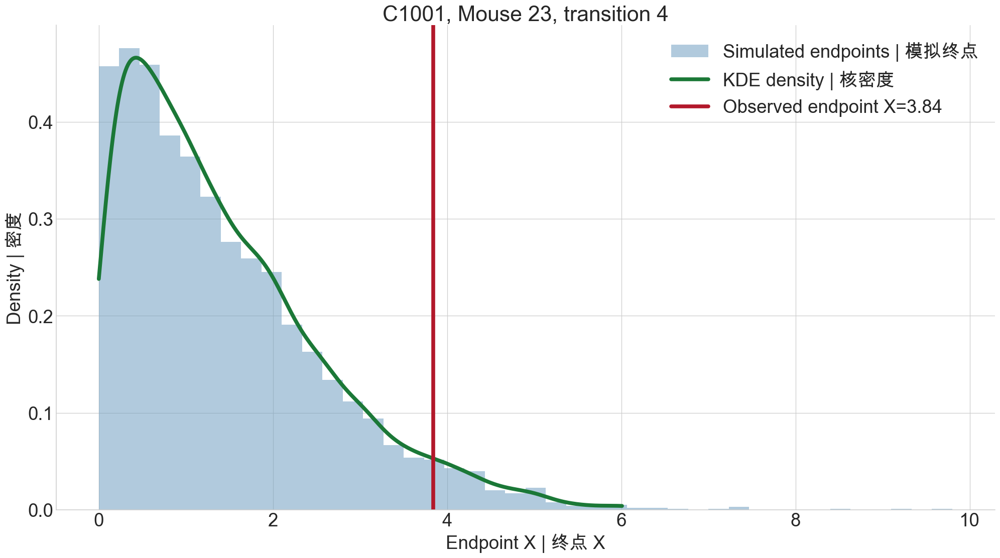

Central 90% interval | 中央 90% 区间: [0.115 3.782]
Density at observation | 观测处密度: 0.052930
Single-transition log-density | 单条转移 log-density: -2.939


In [29]:
# EDIT HERE | 只修改这里
PRACTICE_6_MOUSE_ID = 23
PRACTICE_6_TRANSITION_NUMBER = 4
PRACTICE_6_CIRCUIT = "C1001"

if PRACTICE_6_MOUSE_ID not in mouse_ids:
    raise ValueError(
        f"Choose a mouse ID from {mouse_ids}. "
        f"请从有效小鼠编号中选择：{mouse_ids}。"
    )
valid_circuits = simulation_fits["circuit"].tolist()
if PRACTICE_6_CIRCUIT not in valid_circuits:
    raise ValueError(
        f"Choose a circuit from {valid_circuits}. "
        f"请从有效 circuit 中选择：{valid_circuits}。"
    )

practice_6_options = (
    transitions.loc[transitions["mouse_id"] == PRACTICE_6_MOUSE_ID]
    .reset_index(drop=True)
    .reset_index(names="zero_based_index")
)
practice_6_options["transition_number"] = practice_6_options["zero_based_index"] + 1
if PRACTICE_6_TRANSITION_NUMBER not in practice_6_options["transition_number"].tolist():
    raise ValueError(
        f"Choose a transition number from "
        f"{practice_6_options['transition_number'].tolist()}. "
        f"请选择该小鼠实际存在的转移编号。"
    )
print("Available transitions | 可选转移")
print(
    practice_6_options[
        ["transition_number", "week_start", "week_end", "x_start", "x_end"]
    ].round(3).to_string(index=False)
)

practice_6_transition = practice_6_options.loc[
    practice_6_options["transition_number"] == PRACTICE_6_TRANSITION_NUMBER
].drop(columns=["zero_based_index", "transition_number"])
practice_6_fit = simulation_fits.set_index("circuit").loc[PRACTICE_6_CIRCUIT]
practice_6_endpoints = simulate_transition_endpoints(
    practice_6_transition,
    practice_6_fit["params"],
    n_paths=SEARCH_CONFIG["final_paths"],
    dt_days=SEARCH_CONFIG["final_dt"],
    seed=7600,
)[0]
practice_6_observed = float(practice_6_transition.iloc[0]["x_end"])
practice_6_sd = float(practice_6_endpoints.std(ddof=1))
practice_6_iqr = float(
    np.quantile(practice_6_endpoints, 0.75)
    - np.quantile(practice_6_endpoints, 0.25)
)
practice_6_bandwidth = max(
    0.9
    * min(practice_6_sd, practice_6_iqr / 1.349)
    * len(practice_6_endpoints) ** (-1 / 5),
    1e-3,
)
practice_6_grid = np.linspace(
    0,
    max(practice_6_observed, np.quantile(practice_6_endpoints, 0.995)) * 1.08,
    450,
)
practice_6_density_curve = (
    np.exp(
        -0.5
        * (
            (practice_6_endpoints[:, None] - practice_6_grid[None, :])
            / practice_6_bandwidth
        ) ** 2
    ).mean(axis=0)
    / (np.sqrt(2 * np.pi) * practice_6_bandwidth)
)
practice_6_density_curve /= max(
    ndtr(practice_6_endpoints / practice_6_bandwidth).mean(),
    1e-12,
)
practice_6_z = (
    practice_6_endpoints - practice_6_observed
) / practice_6_bandwidth
practice_6_density = (
    np.exp(-0.5 * practice_6_z**2).mean()
    / (np.sqrt(2 * np.pi) * practice_6_bandwidth)
)
practice_6_density /= max(
    ndtr(practice_6_endpoints / practice_6_bandwidth).mean(),
    1e-12,
)
practice_6_log_density = max(
    float(np.log(max(practice_6_density, 1e-300))),
    TRANSITION_LL_FLOOR,
)
practice_6_interval = np.quantile(practice_6_endpoints, [0.05, 0.95])

fig, ax = plt.subplots(figsize=(18, 10), layout="constrained")
ax.hist(
    practice_6_endpoints,
    bins=42,
    density=True,
    alpha=0.55,
    color="#72A0C1",
    label="Simulated endpoints | 模拟终点",
)
ax.plot(
    practice_6_grid,
    practice_6_density_curve,
    color="#1B7837",
    lw=5,
    label="KDE density | 核密度",
)
ax.axvline(
    practice_6_observed,
    color="#B2182B",
    lw=5,
    label=f"Observed endpoint X={practice_6_observed:.2f}",
)
ax.set(
    title=(
        f"{PRACTICE_6_CIRCUIT}, Mouse {PRACTICE_6_MOUSE_ID}, "
        f"transition {PRACTICE_6_TRANSITION_NUMBER}"
    ),
    xlabel="Endpoint X | 终点 X",
    ylabel="Density | 密度",
)
ax.legend(frameon=False)
plt.show()

print("Central 90% interval | 中央 90% 区间:", np.round(practice_6_interval, 3))
print("Density at observation | 观测处密度:", f"{practice_6_density:.6f}")
print("Single-transition log-density | 单条转移 log-density:", f"{practice_6_log_density:.3f}")


## 13. Compare all circuits with absolute BIC
## 13. 使用绝对 BIC 比较全部模型

For every circuit, the final parameter vector is scored with the same
4,000 paths, one-day step, and seed. The Bayesian information criterion is

$$
\mathrm{BIC}=-2\log\hat L+k\log n.
$$

| symbol | this notebook | 本教程含义 |
|---|---|---|
| $\log\hat L$ | maximized Monte Carlo LL | 最大化后的 Monte Carlo LL |
| $k$ | nominal free-parameter count | 名义自由参数数 |
| $n$ | 294 conditional terms | 294 条条件项 |

Lower BIC is better. It is a comparison score, not a probability,
percentage, or absolute goodness-of-fit grade.

BIC 越小越好。它是模型间比较分数，不是概率、百分比，也不是脱离其他模型
后可以单独解释的“及格分”。

### Why $\eta_0$ still counts | 为什么 $\eta_0$ 仍计入参数数目

Every circuit allows $\eta_0$ to vary before fitting, so it belongs to
nominal $k$ even when the maximum lies at $\eta_0=0$. The
fixed-zero branch is only an optimization aid for locating that boundary
point. Free and boundary branches are compared by LL, and the higher LL
is retained. The main BIC never receives a smaller penalty because the
fitted value happened to be zero.

所有 circuit 在拟合前都允许 $\eta_0$ 自由变化，因此即使最大值落在
$\eta_0=0$，它仍属于 nominal $k$。固定为 0 的分支只是寻找边界最优点
的数值工具；两个分支按 LL 选较高者，主 BIC 不会因为结果恰好为 0 就减少
惩罚。

`effective_k` is shown only to explain a simplified written equation.
For `C1001`, nominal $k=5$; if $\eta_0=0$, its SR equation can be
written with four nonzero parameters. That descriptive count is not
used to rank models.

`effective_k` 只用于解释简化公式。`C1001` 的 nominal $k=5$；若
$\eta_0=0$，SR 方程可写成四个非零参数，但该描述性计数不参与排序。


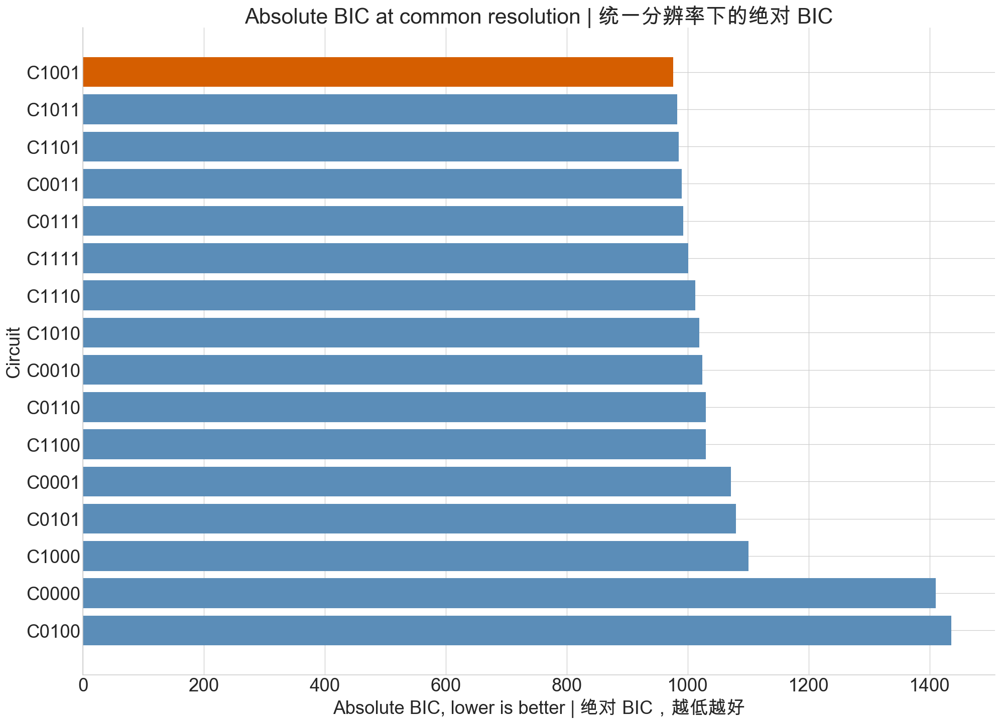

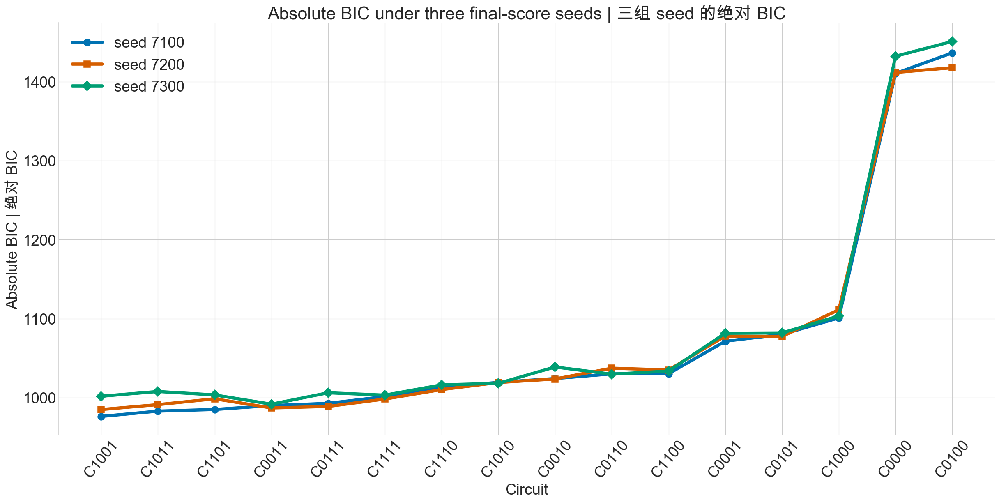

Tutorial and paper comparison | 教程与论文对照
circuit  nominal_k  effective_k  final_log_likelihood     BIC  rank  paper_model_number  paper_LL  paper_BIC         paper_status
  C1001          5            4               -473.90  976.22     1                 9.0    -475.0      978.0       reported | 已报告
  C1011          6            5               -474.41  982.93     2                10.0    -475.0      984.0       reported | 已报告
  C1101          6            6               -475.46  985.01     3                11.0    -473.7      982.0       reported | 已报告
  C0011          5            5               -480.76  989.95     4                 7.0    -483.0      994.0       reported | 已报告
  C0111          6            6               -479.35  992.80     5                 8.0    -479.0      992.0       reported | 已报告
  C1111          7            7               -480.76 1001.31     6                12.0    -473.7      987.0       reported | 已报告
  C1110          6            5               -489

In [30]:
FINAL_SCORE_SEEDS = [7100, 7200, 7300]
stability_signature = cache_signature(
    "nominal-k-final-seed-audit",
    {
        "seeds": FINAL_SCORE_SEEDS,
        "paths": SEARCH_CONFIG["final_paths"],
        "fits": {
            row.circuit: row.params
            for row in simulation_fits.itertuples()
        },
    },
)
stability_path = CACHE_DIR / f"formal_seed_audit_{stability_signature}.json"
stability_records = load_json_cache(stability_path, stability_signature)
if stability_records is None:
    stability_records = []
    for row in simulation_fits.itertuples(index=False):
        for seed in FINAL_SCORE_SEEDS:
            ll = monte_carlo_log_likelihood(
                transitions,
                row.params,
                n_paths=SEARCH_CONFIG["final_paths"],
                dt_days=SEARCH_CONFIG["final_dt"],
                seed=seed,
            )
            stability_records.append({
                "circuit": row.circuit,
                "seed": seed,
                "log_likelihood": float(ll),
                "nominal_k": int(row.nominal_k),
                "BIC": float(
                    -2 * ll + row.nominal_k * np.log(len(transitions))
                ),
            })
    save_json_cache(stability_path, stability_signature, stability_records)

seed_stability = pd.DataFrame(stability_records)
seed_stability["rank"] = seed_stability.groupby("seed")["BIC"].rank(
    method="min"
)
stability_summary = (
    seed_stability.groupby("circuit")
    .agg(
        mean_BIC=("BIC", "mean"),
        BIC_sd=("BIC", "std"),
        best_rank=("rank", "min"),
        worst_rank=("rank", "max"),
    )
    .sort_values("mean_BIC")
)

ROBUST_FINAL_PATHS = 12000
robust_candidates = simulation_fits.nsmallest(4, "BIC")
robust_signature = cache_signature(
    "nominal-k-top-four-audit",
    {
        "paths": ROBUST_FINAL_PATHS,
        "seeds": FINAL_SCORE_SEEDS,
        "fits": {
            row.circuit: row.params
            for row in robust_candidates.itertuples()
        },
    },
)
robust_path = CACHE_DIR / f"formal_robust_score_{robust_signature}.json"
robust_records = load_json_cache(robust_path, robust_signature)
if robust_records is None:
    robust_records = []
    for row in robust_candidates.itertuples(index=False):
        for seed in FINAL_SCORE_SEEDS:
            ll = monte_carlo_log_likelihood(
                transitions,
                row.params,
                n_paths=ROBUST_FINAL_PATHS,
                dt_days=SEARCH_CONFIG["final_dt"],
                seed=seed,
            )
            robust_records.append({
                "circuit": row.circuit,
                "seed": seed,
                "log_likelihood": float(ll),
                "nominal_k": int(row.nominal_k),
                "BIC": float(
                    -2 * ll + row.nominal_k * np.log(len(transitions))
                ),
            })
    save_json_cache(robust_path, robust_signature, robust_records)

robust_scores = pd.DataFrame(robust_records)
robust_scores["rank"] = robust_scores.groupby("seed")["BIC"].rank(method="min")
robust_summary = (
    robust_scores.groupby("circuit")
    .agg(
        mean_BIC=("BIC", "mean"),
        BIC_sd=("BIC", "std"),
        best_rank=("rank", "min"),
        worst_rank=("rank", "max"),
    )
    .sort_values("mean_BIC")
)

simulation_fits["rank"] = simulation_fits["BIC"].rank(method="min").astype(int)
simulation_fits = simulation_fits.sort_values("BIC").reset_index(drop=True)
selected_circuit = str(simulation_fits.iloc[0]["circuit"])
high_path_mean_winner = str(robust_summary.index[0])

paper_rows = [
    (1, "C1000", -535.0, 1092.0),
    (2, "C1100", -507.0, 1042.0),
    (3, "C0010", -500.0, 1023.0),
    (4, "C1010", -500.0, 1028.0),
    (5, "C0110", -500.0, 1028.0),
    (6, "C1110", -500.0, 1034.0),
    (7, "C0011", -483.0, 994.0),
    (8, "C0111", -479.0, 992.0),
    (9, "C1001", -475.0, 978.0),
    (10, "C1011", -475.0, 984.0),
    (11, "C1101", -473.7, 982.0),
    (12, "C1111", -473.7, 987.0),
]
paper_model_scores = pd.DataFrame(
    paper_rows,
    columns=["paper_model_number", "circuit", "paper_LL", "paper_BIC"],
)
bic_comparison = (
    simulation_fits[
        [
            "circuit", "nominal_k", "effective_k",
            "final_log_likelihood", "BIC", "rank",
        ]
    ]
    .merge(paper_model_scores, on="circuit", how="left")
    .sort_values("BIC")
    .reset_index(drop=True)
)
bic_comparison["paper_status"] = np.where(
    bic_comparison["paper_BIC"].notna(),
    "reported | 已报告",
    "not reported | 论文未报告",
)

ordered = simulation_fits.sort_values("BIC", ascending=False)
fig, ax = plt.subplots(figsize=(18, 13), layout="constrained")
ax.barh(
    ordered["circuit"],
    ordered["BIC"],
    color=np.where(ordered["circuit"] == "C1001", "#D55E00", "#5B8DB8"),
)
ax.set(
    title="Absolute BIC at common resolution | 统一分辨率下的绝对 BIC",
    xlabel="Absolute BIC, lower is better | 绝对 BIC，越低越好",
    ylabel="Circuit",
)
plt.show()

seed_styles = {
    7100: ("#0072B2", "o"),
    7200: ("#D55E00", "s"),
    7300: ("#009E73", "D"),
}
circuit_order = simulation_fits["circuit"].tolist()
fig, ax = plt.subplots(figsize=(22, 11), layout="constrained")
for seed, (color, marker) in seed_styles.items():
    frame = seed_stability.loc[
        seed_stability["seed"] == seed
    ].set_index("circuit").loc[circuit_order]
    ax.plot(
        circuit_order,
        frame["BIC"],
        color=color,
        marker=marker,
        ms=11,
        lw=5,
        label=f"seed {seed}",
    )
ax.set(
    title="Absolute BIC under three final-score seeds | 三组 seed 的绝对 BIC",
    xlabel="Circuit",
    ylabel="Absolute BIC | 绝对 BIC",
)
ax.tick_params(axis="x", rotation=50)
ax.legend(frameon=False)
plt.show()

print("Tutorial and paper comparison | 教程与论文对照")
print(
    bic_comparison[
        [
            "circuit", "nominal_k", "effective_k",
            "final_log_likelihood", "BIC", "rank",
            "paper_model_number", "paper_LL", "paper_BIC", "paper_status",
        ]
    ].round(2).to_string(index=False)
)
print("\nThree-seed summary | 三 seed 汇总")
print(stability_summary.round(2).to_string())
print("\n12,000-path top-four audit | 12,000 路径前四名审计")
print(robust_summary.round(2).to_string())


### External comparison with Supplementary Table 1
### 与论文 Supplementary Table 1 的外部对照

The paper reported 12 of the 16 circuits; four models without
time-dependent parameters had very low likelihood and were omitted.
The comparison table maps each reported equation to this tutorial's
bit code. Paper BIC values do not enter the tutorial search or ranking.

论文报告了 16 个 circuit 中的 12 个；四个没有时间依赖参数、似然很低的模型
未列入补充表。上表把论文方程映射到本教程四位代码。论文 BIC 不参与教程
搜索或排序。

Numerical disagreement is expected because the paper used a much larger
Mathematica scan and its own stochastic-density implementation, whereas
the tutorial uses Sobol starts, Powell optimization, finite Monte Carlo
paths, explicit KDE choices, an LL floor, and fixed seeds. This becomes
an open research question rather than something hidden.

数值差异是可预期的：论文使用更大规模的 Mathematica 扫描和其随机密度
实现；教程使用 Sobol 起点、Powell、有限路径、明确的 KDE、LL floor 和固定
seed。该差异会作为开放问题保留，而不是隐藏。


### Micro-lab 7. Rescore all 16 fitted models with another seed
### 微实验 7：更换 seed，重新评分全部 16 个已拟合模型

**Goal | 目标.** Observe Monte Carlo score variation without repeating
the much more expensive parameter optimization.

**Predict first | 先预测.** Will the absolute BIC values move slightly?
Will the top-ranked circuit remain the same?

**Steps | 操作步骤.** Change only the seed. The function keeps every
fitted parameter vector fixed, simulates all 16 models again at the
formal 4,000-path resolution, and prints a new absolute-BIC table.

**Scientific meaning | 科学解释.** A stable mechanism ranking across
seeds is more credible than one based on a single Monte Carlo draw.

**Limit | 局限.** This checks final-score noise only. It does not rerun
parameter optimization and cannot measure search uncertainty.

本实验固定全部拟合参数，只更换随机数序列重算 16 个模型的绝对 BIC。它检查
最终评分噪声，但不重新搜索参数。


In [31]:
def rescore_all_circuits(seed: int) -> pd.DataFrame:
    '''
    Purpose: Recalculate final LL and absolute nominal-k BIC for all circuits.
    Parameters: One integer random seed.
    Returns: A 16-row table sorted by absolute BIC.
    Units: LL and BIC are dimensionless.
    Assumptions: Fitted parameters stay fixed; 4,000 paths and one-day steps.
    中文说明：固定已拟合参数，更换 seed 后重算全部 16 个模型的 LL 与绝对 BIC。
    '''
    if not isinstance(seed, (int, np.integer)) or seed < 0:
        raise ValueError("Seed must be a non-negative integer. Seed 必须是非负整数。")
    signature = cache_signature(
        "student-all-circuit-rescore",
        {
            "seed": int(seed),
            "fits": {
                row.circuit: row.params
                for row in simulation_fits.itertuples()
            },
        },
    )
    path = CACHE_DIR / f"formal_student_rescore_{signature}.json"
    records = load_json_cache(path, signature)
    if records is None:
        records = []
        for row in simulation_fits.itertuples(index=False):
            ll = monte_carlo_log_likelihood(
                transitions,
                row.params,
                n_paths=SEARCH_CONFIG["final_paths"],
                dt_days=SEARCH_CONFIG["final_dt"],
                seed=int(seed),
            )
            records.append({
                "circuit": row.circuit,
                "seed": int(seed),
                "nominal_k": int(row.nominal_k),
                "log_likelihood": float(ll),
                "BIC": float(
                    -2 * ll + row.nominal_k * np.log(len(transitions))
                ),
            })
        save_json_cache(path, signature, records)
    result = pd.DataFrame(records).sort_values("BIC").reset_index(drop=True)
    result["rank"] = np.arange(1, len(result) + 1)
    return result


# EDIT HERE | 只修改这里
PRACTICE_7_SEED = 7400

practice_7_scores = rescore_all_circuits(PRACTICE_7_SEED)
print(practice_7_scores.round(2).to_string(index=False))


    BIC circuit  log_likelihood  nominal_k  seed  rank
 977.92   C0011         -474.75          5  7400     1
 986.41   C0111         -476.15          6  7400     2
 989.26   C1111         -474.74          7  7400     3
 990.77   C1001         -481.18          5  7400     4
 997.01   C1011         -481.46          6  7400     5
1001.37   C1101         -483.63          6  7400     6
1011.15   C1110         -488.52          6  7400     7
1020.94   C1010         -496.26          5  7400     8
1030.46   C0110         -501.02          5  7400     9
1032.42   C1100         -502.00          5  7400    10
1035.55   C0010         -506.41          4  7400    11
1065.00   C0101         -518.29          5  7400    12
1078.39   C0001         -527.83          4  7400    13
1111.04   C1000         -544.15          4  7400    14
1401.09   C0100         -689.18          4  7400    15
1442.54   C0000         -712.75          3  7400    16


### Selection result and parameter browser
### 筛选结果与参数浏览器

`C1001` is shown by default because it ranks first under the formal
common-resolution score and is the mechanism reported by the paper:
production increases with age and removal saturates with $X$.
However, the audit is not uniformly stable. The 4,000-path three-seed
mean still favors `C1001`, but its seed-specific rank ranges from 1 to
2; the 12,000-path mean favors `C0011`. Treat `C1001` as the
paper-consistent focal model, not as a uniquely proven mechanism.

默认显示 `C1001`，因为它在正式统一分辨率评分中排名第一，也与论文报告的
机制一致：产生随年龄增加，清除随 $X$ 饱和。但审计并非完全稳定：
4000-path 三 seed 平均仍支持 `C1001`，单个 seed 的排名为 1 至 2；
12000-path 平均则支持 `C0011`。因此应把 `C1001` 视为与论文一致的重点
工作模型，而不是已被唯一证明的机制。

The ranking supports a mechanism within this 16-model family. It does
not prove that every omitted biological process is absent.

排名只在这 16 个候选模型范围内支持某个机制，不能证明未纳入的生物过程
不存在。


In [32]:
# EDIT HERE | 只修改这里
MODEL_TO_VIEW = "C1001"

valid_circuits = simulation_fits["circuit"].tolist()
if MODEL_TO_VIEW not in valid_circuits:
    raise ValueError(
        f"Choose a circuit from {valid_circuits}. "
        f"请从有效 circuit 中选择：{valid_circuits}。"
    )

browser_model = candidate_models.set_index("circuit").loc[MODEL_TO_VIEW]
browser_fit = simulation_fits.set_index("circuit").loc[MODEL_TO_VIEW]
print("Circuit | 模型:", MODEL_TO_VIEW)
print("Complete drift | 完整漂移:", browser_model["drift_formula"])
print("Mechanisms | 机制:", browser_model["mechanisms_en"])
print("中文机制:", browser_model["mechanisms_zh"])
print("Nominal k | 名义参数数:", int(browser_fit["nominal_k"]))
print("Effective count | 有效非零参数数:", int(browser_fit["effective_k"]))
print("Final LL | 最终 LL:", f"{browser_fit['final_log_likelihood']:.3f}")
print("Absolute BIC | 绝对 BIC:", f"{browser_fit['BIC']:.3f}")
print("Rank | 排名:", int(browser_fit["rank"]))
print("Parameters | 参数")
print(pd.Series(browser_fit["params"]).round(6).to_string())

print("Audit status | 审计状态")
if high_path_mean_winner == selected_circuit:
    print(
        f"Formal and 12,000-path mean winners agree: {selected_circuit}. "
        f"正式评分与 12000-path 平均胜者一致。"
    )
else:
    print(
        f"Formal winner: {selected_circuit}; "
        f"12,000-path mean winner: {high_path_mean_winner}. "
        f"排名对 Monte Carlo 设置敏感。"
    )
c1001_row = simulation_fits.set_index("circuit").loc["C1001"]
selected_family_params = dict(c1001_row["params"])


Circuit | 模型: C1001
Complete drift | 完整漂移: (eta0 + eta1*t) - (beta0*X)/(1 + beta2*X)
Mechanisms | 机制: age production, saturation
中文机制: 年龄产生、饱和清除
Nominal k | 名义参数数: 5
Effective count | 有效非零参数数: 4
Final LL | 最终 LL: -473.901
Absolute BIC | 绝对 BIC: 976.219
Rank | 排名: 1
Parameters | 参数
beta0                   0.213274
beta2                   0.898672
epsilon                 0.140428
eta0                    0.000000
eta1                    0.121589
eta2                    0.000000
removal_age_fraction    0.000000
Audit status | 审计状态
Formal winner: C1001; 12,000-path mean winner: C0011. 排名对 Monte Carlo 设置敏感。


## 14. Mouse-level bootstrap
## 14. 整鼠 Bootstrap

Imagine a bag containing 33 mouse IDs. Draw one ID, record it, return it
to the bag, and draw again until you have 33 draws. Returning the ID is
**sampling with replacement**: some mice repeat and some are absent.

想象袋中放有 33 个 mouse ID。抽出一个、记录后放回，再继续抽，直到完成
33 次。有放回意味着某些小鼠会重复，另一些完全未抽中。

Each selected ID brings all of that mouse's transitions. This preserves
within-mouse dependence. Resampling 294 rows independently would pretend
that repeated visits from one mouse are independent animals.

每次抽中一只小鼠，就带入它的全部转移，从而保留同鼠依赖。如果独立抽取
294 行，就会错误地把同一只小鼠的重复访视当作独立动物。

The notebook performs 100 resamples and refits `C1001`. The 5th and
95th percentiles form a 90% percentile interval. It measures sensitivity
to which mice entered the cohort under the same model and algorithm; it
does not include uncertainty from choosing another model family,
likelihood implementation, or search budget.

Notebook 执行 100 次整鼠重抽样并重拟合 `C1001`。第 5% 和第 95% 分位数
构成 90% percentile interval。它描述在相同模型和算法下“换一批小鼠”的
敏感性，不覆盖模型集合、似然实现和搜索预算的不确定性。


In [33]:
bootstrap_demo_seed = 2026
bootstrap_demo_rng = np.random.default_rng(bootstrap_demo_seed)
bootstrap_demo_ids = np.array(mouse_ids)
bootstrap_demo_draws = bootstrap_demo_rng.choice(
    bootstrap_demo_ids,
    size=len(bootstrap_demo_ids),
    replace=True,
)
bootstrap_demo_counts = (
    pd.Series(bootstrap_demo_draws, name="mouse_id")
    .value_counts()
    .reindex(bootstrap_demo_ids, fill_value=0)
    .rename("times_drawn")
    .rename_axis("mouse_id")
    .reset_index()
)
print("One draw from the mouse-ID bag | 一次整鼠抽签")
print(bootstrap_demo_counts.to_string(index=False))
print(
    "Repeated mice | 重复小鼠:",
    bootstrap_demo_counts.query("times_drawn > 1")["mouse_id"].tolist(),
)
print(
    "Not drawn | 未抽中小鼠:",
    bootstrap_demo_counts.query("times_drawn == 0")["mouse_id"].tolist(),
)


One draw from the mouse-ID bag | 一次整鼠抽签
 mouse_id  times_drawn
        0            1
        1            0
        2            1
        3            2
        4            0
        5            3
        6            0
        7            0
        8            0
        9            2
       10            0
       11            1
       12            2
       13            0
       14            0
       15            1
       16            0
       17            1
       18            0
       19            1
       20            1
       21            5
       22            0
       23            2
       24            2
       25            0
       26            1
       27            2
       28            2
       29            1
       30            1
       31            1
       32            0
Repeated mice | 重复小鼠: [3, 5, 9, 12, 21, 23, 24, 27, 28]
Not drawn | 未抽中小鼠: [1, 4, 6, 7, 8, 10, 13, 14, 16, 18, 22, 25, 32]


**Function card | 函数说明卡**

- `resample_mice(frame, seed)` draws whole mice with replacement.
- `bootstrap_refit(...)` refits all nominal `C1001` parameters to one
  resampled cohort.
- The seed controls the reproducible draw and optimizer shocks.

- `resample_mice(frame, seed)` 以整只小鼠为单位有放回抽样。
- `bootstrap_refit(...)` 对一份重抽样队列重新拟合 `C1001` 全部名义参数。
- Seed 控制可重复的抽样与随机模拟序列。

Example | 调用示例：`resample_mice(transitions, seed=12000)`


Completed bootstrap refits | 已完成 Bootstrap 重拟合: 100
         estimate      5%     95%
eta0       0.0000  0.0080  1.3064
eta        0.1216  0.1216  0.1216
beta       0.2373  0.2183  1.3299
kappa      1.1128  1.1128  1.1128
epsilon    0.1404  0.0945  0.3458


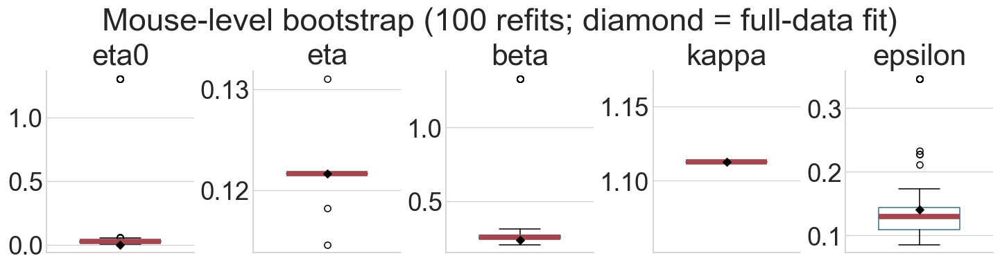

In [34]:
C1001_NAMES = list(
    candidate_models.set_index("circuit").loc["C1001", "parameter_names"]
)


def resample_mice(frame: pd.DataFrame, seed: int) -> pd.DataFrame:
    '''
    Purpose: Draw whole mice with replacement for one bootstrap sample.
    Parameters: Transition table and reproducible random seed.
    Returns: A transition table with relabeled bootstrap mouse identities.
    Units: All transition columns retain their original units.
    Assumptions: Mice are sampling units; each draw keeps all mouse transitions.
    中文说明：以整只小鼠为单位有放回抽样，并保留每次抽中小鼠的全部转移。
    '''
    rng = np.random.default_rng(seed)
    mouse_ids = np.sort(frame["mouse_id"].unique())
    sampled = rng.choice(mouse_ids, size=len(mouse_ids), replace=True)
    pieces = []
    for bootstrap_mouse, mouse_id in enumerate(sampled, start=1):
        piece = frame.loc[frame["mouse_id"] == mouse_id].copy()
        piece["mouse_id"] = bootstrap_mouse
        pieces.append(piece)
    return pd.concat(pieces, ignore_index=True)


def bootstrap_refit(frame: pd.DataFrame, initial_params, seed: int):
    '''
    Purpose: Refit C1001 to one mouse-level bootstrap sample.
    Parameters: Resampled transitions, initial parameters, and seed.
    Returns: A complete C1001 family-parameter dictionary.
    Units: Parameters retain the model-unit definitions.
    Assumptions: Formal medium and high budgets; all nominal C1001 parameters free.
    中文说明：对一份整鼠 Bootstrap 样本重新拟合 C1001 的全部名义参数。
    '''
    initial_unit = params_to_unit(initial_params, C1001_NAMES)
    medium = minimize(
        lambda unit: -score_unit_vector(
            unit, C1001_NAMES, frame,
            SEARCH_CONFIG["medium_paths"],
            SEARCH_CONFIG["medium_dt"],
            seed=9000 + seed,
        ),
        initial_unit,
        method="Powell",
        bounds=[(0.0, 1.0)] * len(C1001_NAMES),
        options={
            "maxfev": SEARCH_CONFIG["bootstrap_medium_maxfev"],
            "xtol": 0.02, "ftol": 0.004,
        },
    )
    local_bounds = [
        (max(0.0, value - 0.12), min(1.0, value + 0.12))
        for value in medium.x
    ]
    high = minimize(
        lambda unit: -score_unit_vector(
            unit, C1001_NAMES, frame,
            SEARCH_CONFIG["high_paths"],
            SEARCH_CONFIG["high_dt"],
            seed=10000 + seed,
        ),
        np.clip(medium.x, 0.0, 1.0),
        method="Powell",
        bounds=local_bounds,
        options={
            "maxfev": SEARCH_CONFIG["bootstrap_high_maxfev"],
            "xtol": 0.01, "ftol": 0.002,
        },
    )
    values = unit_to_values(high.x, C1001_NAMES)
    return vector_to_family_params(C1001_NAMES, values)


n_bootstrap = SEARCH_CONFIG["bootstrap_replicates"]
bootstrap_signature = cache_signature(
    "mouse-bootstrap",
    {"replicates": n_bootstrap, "initial": selected_family_params},
)
bootstrap_path = CACHE_DIR / f"{FORMAL_CONFIGURATION}_bootstrap_{bootstrap_signature}.json"
bootstrap_records = load_json_cache(bootstrap_path, bootstrap_signature)
if bootstrap_records is None:
    bootstrap_records = []
    for replicate in range(n_bootstrap):
        sampled_transitions = resample_mice(
            transitions, seed=12000 + replicate
        )
        fitted = bootstrap_refit(
            sampled_transitions,
            selected_family_params,
            seed=replicate,
        )
        fitted["replicate"] = replicate + 1
        bootstrap_records.append(fitted)
        if (replicate + 1) % 10 == 0 or replicate + 1 == n_bootstrap:
            print(f"Bootstrap {replicate + 1}/{n_bootstrap}")
    save_json_cache(bootstrap_path, bootstrap_signature, bootstrap_records)

bootstrap_fits = pd.DataFrame(bootstrap_records)
print(
    "Completed bootstrap refits | 已完成 Bootstrap 重拟合:",
    len(bootstrap_fits),
)
bootstrap_fits["eta"] = bootstrap_fits["eta1"]
bootstrap_fits["beta"] = bootstrap_fits["beta0"] / bootstrap_fits["beta2"]
bootstrap_fits["kappa"] = 1.0 / bootstrap_fits["beta2"]

interval_parameters = ["eta", "beta", "kappa", "epsilon"]
interval_estimates = {
    "eta": selected_family_params["eta1"],
    "beta": selected_family_params["beta0"] / selected_family_params["beta2"],
    "kappa": 1.0 / selected_family_params["beta2"],
    "epsilon": selected_family_params["epsilon"],
}
if "eta0" in C1001_NAMES:
    interval_parameters.insert(0, "eta0")
    interval_estimates["eta0"] = selected_family_params["eta0"]
bootstrap_intervals = pd.DataFrame({
    "estimate": interval_estimates,
    "5%": bootstrap_fits[interval_parameters].quantile(0.05),
    "95%": bootstrap_fits[interval_parameters].quantile(0.95),
}).loc[interval_parameters]
print(bootstrap_intervals.round(4).to_string())

fig, axes = plt.subplots(
    1, len(interval_parameters),
    figsize=(2.6 * len(interval_parameters), 3.4),
    layout="constrained",
)
axes = np.atleast_1d(axes)
for ax, parameter in zip(axes, interval_parameters):
    ax.boxplot(
        bootstrap_fits[parameter], widths=0.55, showfliers=True,
        boxprops={"color": "#3A6F8F"},
        medianprops={"color": "#A5454D", "linewidth": 5},
    )
    ax.scatter(
        [1], [bootstrap_intervals.loc[parameter, "estimate"]],
        color="black", marker="D", s=28, zorder=3,
    )
    ax.set(title=parameter, xticks=[])
fig.suptitle(
    f"Mouse-level bootstrap ({n_bootstrap} refits; diamond = full-data fit)",
    fontweight=600,
)
plt.show()


### Micro-lab 8. Compare observed and predicted mean and SD for any model
### 微实验 8：比较任意模型的观测与预测 mean 和 SD

**Goal | 目标.** Use a simple diagnostic after model selection without
confusing it with the likelihood used for fitting.

**Predict first | 先预测.** At which ages will your chosen circuit
overpredict or underpredict the observed mean and SD?

**Steps | 操作步骤.** Choose any fitted circuit and a seed. The cell
simulates complete cohorts from $X(0)=0$, then plots observed and
simulated mean and sample SD at every week.

**Scientific meaning | 科学解释.** Large systematic mismatches expose
a basic model failure. Approximate agreement is useful but does not
validate the complete conditional distribution.

**Limit | 局限.** These marginal summaries discard the identity and
temporal dependence that the transition likelihood uses.

该诊断比较周龄边际汇总，不会替代用于筛选的条件似然；均值和 SD 接近也不能
证明完整分布已经正确。


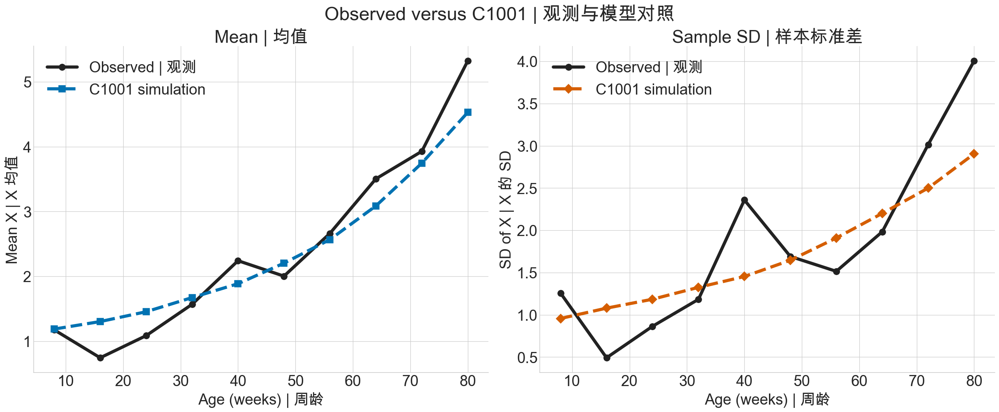

,week,n_mice,mean_X,between_mouse_sd,model_mean,model_sd
0,8,33,1.175,1.256,1.187,0.956
1,16,33,0.744,0.491,1.303,1.079
2,24,32,1.085,0.864,1.454,1.184
3,32,32,1.568,1.183,1.672,1.325
4,40,31,2.241,2.358,1.886,1.453
5,48,31,2.003,1.690,2.203,1.645
6,56,31,2.663,1.514,2.567,1.909
7,64,30,3.503,1.983,3.085,2.200
8,72,26,3.927,3.015,3.745,2.500
9,80,21,5.322,4.005,4.528,2.905


In [35]:
def simulate_population_at_schedule(
    params,
    weeks,
    n_paths=4000,
    dt_days=1.0,
    seed=14000,
):
    '''
    Purpose: Simulate a model cohort from birth at scheduled observation weeks.
    Parameters: Parameters, week schedule, path count, day step, and seed.
    Returns: A table of simulated mean and sample SD by week.
    Units: Week labels and normalized X summaries.
    Assumptions: X(0)=0, Euler-Maruyama, reflection at X=0.
    中文说明：从出生初值模拟完整队列，并按计划周龄返回模型均值与样本 SD。
    '''
    rng = np.random.default_rng(seed)
    x = np.zeros(n_paths)
    output = []
    current_day = 0.0
    for week in weeks:
        target_day = week * 7.0
        while current_day < target_day - 1e-12:
            h = min(dt_days, target_day - current_day)
            x = x + family_drift(x, current_day, params) * h
            x = x + np.sqrt(2 * params["epsilon"] * h) * rng.normal(
                size=n_paths
            )
            x = np.abs(x)
            current_day += h
        output.append({
            "week": week,
            "model_mean": x.mean(),
            "model_sd": x.std(ddof=1),
        })
    return pd.DataFrame(output)


# EDIT HERE | 只修改这里
PRACTICE_8_CIRCUIT = "C1001"
PRACTICE_8_SEED = 14000

if PRACTICE_8_CIRCUIT not in simulation_fits["circuit"].tolist():
    raise ValueError(
        f"Choose a fitted circuit from {simulation_fits['circuit'].tolist()}. "
        f"请选择一个有效的已拟合 circuit。"
    )
practice_8_params = dict(
    simulation_fits.set_index("circuit").loc[PRACTICE_8_CIRCUIT, "params"]
)
practice_8_model_summary = simulate_population_at_schedule(
    practice_8_params,
    scheduled_weeks,
    n_paths=SEARCH_CONFIG["final_paths"],
    dt_days=SEARCH_CONFIG["final_dt"],
    seed=PRACTICE_8_SEED,
)
practice_8_diagnostic = age_summary.merge(
    practice_8_model_summary,
    on="week",
)

fig, axes = plt.subplots(1, 2, figsize=(22, 9), layout="constrained")
axes[0].plot(
    practice_8_diagnostic["week"],
    practice_8_diagnostic["mean_X"],
    "o-",
    color="#222222",
    lw=5,
    ms=10,
    label="Observed | 观测",
)
axes[0].plot(
    practice_8_diagnostic["week"],
    practice_8_diagnostic["model_mean"],
    "s--",
    color="#0072B2",
    lw=5,
    ms=10,
    label=f"{PRACTICE_8_CIRCUIT} simulation",
)
axes[0].set(
    title="Mean | 均值",
    xlabel="Age (weeks) | 周龄",
    ylabel="Mean X | X 均值",
)
axes[1].plot(
    practice_8_diagnostic["week"],
    practice_8_diagnostic["between_mouse_sd"],
    "o-",
    color="#222222",
    lw=5,
    ms=10,
    label="Observed | 观测",
)
axes[1].plot(
    practice_8_diagnostic["week"],
    practice_8_diagnostic["model_sd"],
    "D--",
    color="#D55E00",
    lw=5,
    ms=10,
    label=f"{PRACTICE_8_CIRCUIT} simulation",
)
axes[1].set(
    title="Sample SD | 样本标准差",
    xlabel="Age (weeks) | 周龄",
    ylabel="SD of X | X 的 SD",
)
for ax in axes:
    ax.legend(frameon=False)
fig.suptitle(
    f"Observed versus {PRACTICE_8_CIRCUIT} | 观测与模型对照",
    fontsize=30,
    fontweight=600,
)
plt.show()
practice_8_diagnostic.round(3)


## Model selection complete
## 模型筛选完成

You have moved from an official workbook to conditional likelihoods,
fitted 16 stochastic circuits, checked Monte Carlo seeds, interpreted
nominal-parameter BIC, and quantified mouse-sampling uncertainty.

你已经从官方工作簿出发，建立条件似然，拟合 16 个随机 circuit，检查 seed
稳健性，理解 nominal-parameter BIC，并量化整鼠抽样不确定性。下面进入
生物学解释部分。


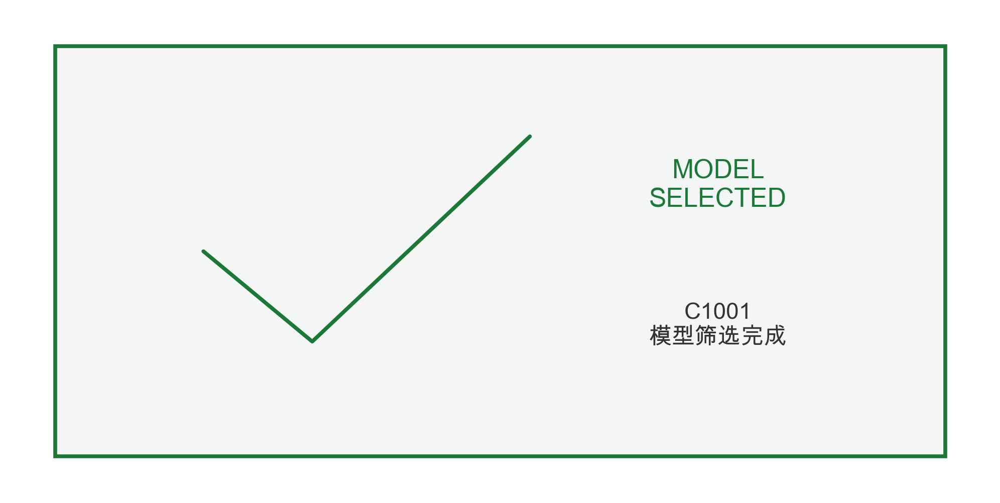

In [36]:
def draw_model_selection_congratulations(selected_model="C1001"):
    '''
    Purpose: Mark the transition from model selection to interpretation.
    Parameters: The selected circuit label.
    Returns: A bilingual Matplotlib figure and axes.
    Units: Not applicable.
    Assumptions: The label summarizes the current tutorial audit.
    中文说明：生成双语完成图，标记从模型筛选进入机制解释。
    '''
    fig, ax = plt.subplots(figsize=(18, 9), layout="constrained")
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.axis("off")
    ax.add_patch(
        plt.Rectangle(
            (0.5, 0.5),
            9,
            5,
            facecolor="#F4F6F5",
            edgecolor="#1B7837",
            linewidth=5,
        )
    )
    ax.plot([2.0, 3.1, 5.3], [3.0, 1.9, 4.4], color="#1B7837", lw=5)
    ax.text(
        7.2,
        3.8,
        "MODEL\nSELECTED",
        ha="center",
        va="center",
        fontsize=34,
        fontweight=600,
        color="#1B7837",
    )
    ax.text(
        7.2,
        2.1,
        f"{selected_model}\n模型筛选完成",
        ha="center",
        va="center",
        fontsize=30,
        color="#333333",
    )
    return fig, ax


draw_model_selection_congratulations(selected_circuit)
plt.show()


# Part III. What the focal SR mechanism means
# 第三部分：重点 SR 工作模型意味着什么

The formal selection is finished, and the seed audit has exposed its
numerical sensitivity. The equations below interpret paper-consistent
`C1001` as the focal working model and clearly label which conclusions
come from the longitudinal fit, independent Figure 3 data, local
approximations, or an added mortality threshold.

正式模型筛选已经结束，seed 审计也揭示了数值敏感性。下面把与论文一致的
`C1001` 作为重点工作模型进行解释，并明确区分：哪些结论来自纵向拟合，
哪些来自独立 Figure 3 数据、局部近似或额外的死亡阈值假设。


### Part III route: interpretation, independent evidence, and hypothesis
### 第三部分路线：机制解释、独立证据与附加假设

The first six steps interpret the longitudinal model.
Bleomycin data provide an independent check. Mortality analysis uses a
separate parameter set and therefore sits at the end as a conditional
extension.

前六步解释纵向模型；bleomycin 数据提供独立检验；死亡率分析
使用单独参数，因此放在最后，作为有条件的扩展解释。


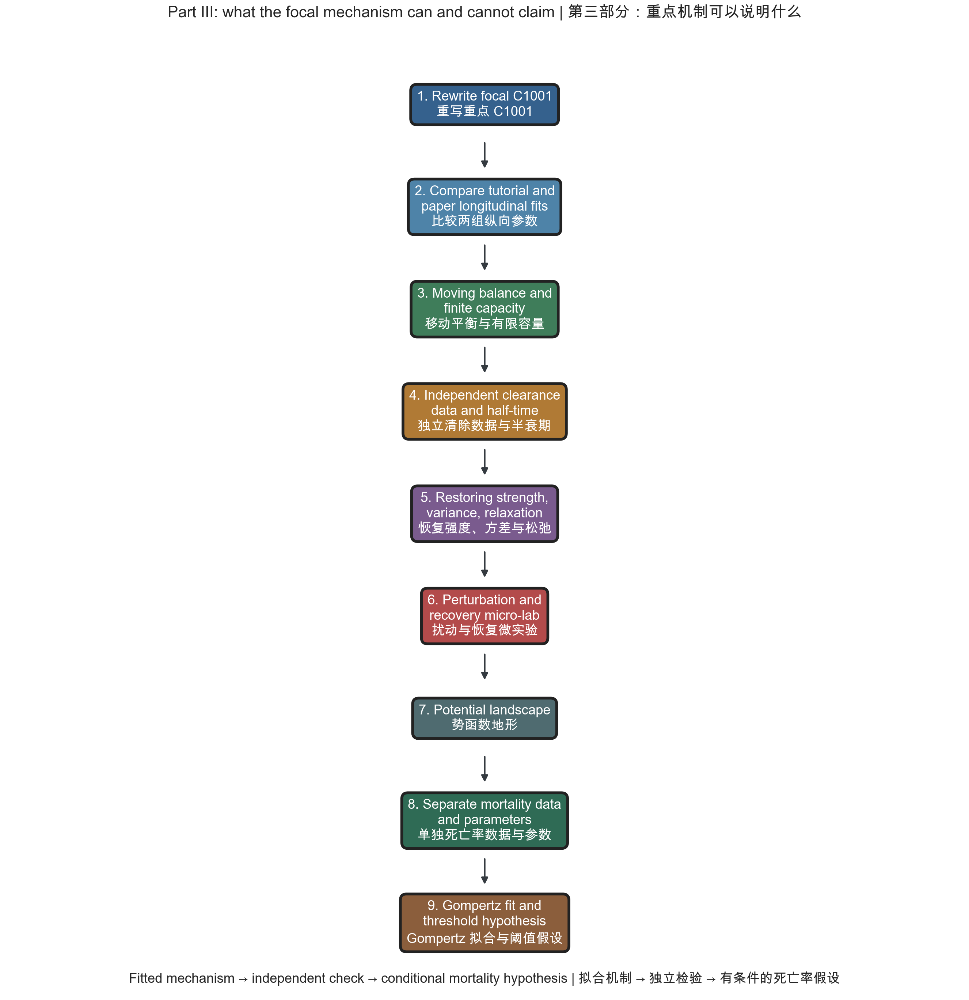

In [37]:
part_three_route = [
    "Rewrite focal C1001\n重写重点 C1001",
    "Compare tutorial and\npaper longitudinal fits\n比较两组纵向参数",
    "Moving balance and\nfinite capacity\n移动平衡与有限容量",
    "Independent clearance\ndata and half-time\n独立清除数据与半衰期",
    "Restoring strength,\nvariance, relaxation\n恢复强度、方差与松弛",
    "Perturbation and\nrecovery micro-lab\n扰动与恢复微实验",
    "Potential landscape\n势函数地形",
    "Separate mortality data\nand parameters\n单独死亡率数据与参数",
    "Gompertz fit and\nthreshold hypothesis\nGompertz 拟合与阈值假设",
]
draw_ordered_route(
    part_three_route,
    "Part III: what the focal mechanism can and cannot claim | "
    "第三部分：重点机制可以说明什么",
    "Fitted mechanism → independent check → conditional mortality hypothesis | "
    "拟合机制 → 独立检验 → 有条件的死亡率假设",
)
plt.show()


## 15. Rewrite `C1001` as the SR model
## 15. 把 `C1001` 重写为 SR 模型

For `C1001`,

$$
f(X,t)=\eta_0+\eta_1t-\frac{\beta_0X}{1+\beta_2X}.
$$

Define

$$
\eta=\eta_1,\qquad
\kappa=\frac{1}{\beta_2},\qquad
\beta=\frac{\beta_0}{\beta_2}.
$$

The same equation becomes

$$
\boxed{
dX=\left(\eta_0+\eta t-\frac{\beta X}{\kappa+X}\right)ds
+\sqrt{2\epsilon}\,dW_s.}
$$

| symbol | meaning | unit |
|---|---|---|
| $\eta_0$ | basal production | $X/\mathrm{day}$ |
| $\eta$ | yearly rise in production | $X/(\mathrm{day}\cdot\mathrm{year})$ |
| $\beta$ | maximum total removal | $X/\mathrm{day}$ |
| $\kappa$ | load giving half-maximal removal | $X$ |
| $\epsilon$ | diffusion intensity | $X^2/\mathrm{day}$ |

The removal curve approaches the finite capacity $\beta$. At
$X=\kappa$, total removal is $\beta/2$. If the estimated
$\eta_0=0$, the written SR equation contains four nonzero parameters,
but `C1001` still used nominal $k=5$ in model selection because
$\eta_0$ was free before fitting.

清除曲线随 $X$ 增大逐渐接近有限上限 $\beta$；在 $X=\kappa$ 时达到
$\beta/2$。若拟合得到 $\eta_0=0$，简化方程可写成四个非零参数；但
`C1001` 在筛选中仍使用 nominal $k=5$，因为拟合前 $\eta_0$ 可以自由变化。


**Function card | 函数说明卡**

- `sr_drift(x, t_days, params)` evaluates production minus saturating
  removal in the reparameterized equation.
- `TUTORIAL_SR` comes from this notebook's direct refit.
- `PAPER_LONGITUDINAL_SR` contains the published Figure 2 longitudinal
  parameter estimates. The two dictionaries are never mixed.
#
- `sr_drift(...)` 计算重参数化方程中的产生减饱和清除。
- `TUTORIAL_SR` 来自本 notebook 的独立重拟合。
- `PAPER_LONGITUDINAL_SR` 是论文 Figure 2 纵向参数；两组变量始终分开。

Example | 调用示例：`sr_drift(2.0, 365.25, TUTORIAL_SR)`


In [38]:
if selected_family_params["beta2"] <= 0:
    raise ValueError("C1001 requires a positive saturation parameter.")

TUTORIAL_SR = {
    "eta0": selected_family_params["eta0"],
    "eta": selected_family_params["eta1"],
    "beta": selected_family_params["beta0"] / selected_family_params["beta2"],
    "kappa": 1.0 / selected_family_params["beta2"],
    "epsilon": selected_family_params["epsilon"],
}
PAPER_LONGITUDINAL_SR = {
    "eta0": 0.0,
    "eta": 0.15,
    "beta": 0.27,
    "kappa": 1.10,
    "epsilon": 0.14,
}
LONGITUDINAL_PARAMETER_SETS = {
    "tutorial direct fit": TUTORIAL_SR,
    "paper longitudinal fit": PAPER_LONGITUDINAL_SR,
}


def sr_drift(x, t_days, params):
    '''
    Purpose: Evaluate drift in the reparameterized C1001 SR equation.
    Parameters: State X, biological age in days, and SR parameters.
    Returns: Production minus saturating removal.
    Units: X per day.
    Assumptions: eta uses age in years and parameters remain fixed.
    中文说明：计算重参数化 SR 模型的净漂移，即年龄产生减饱和清除。
    '''
    age_years = np.asarray(t_days) / DAYS_PER_YEAR
    x = np.asarray(x)
    return (
        params["eta0"]
        + params["eta"] * age_years
        - params["beta"] * x / (params["kappa"] + x)
    )


comparison_names = ["eta0", "eta", "beta", "kappa", "epsilon"]
parameter_comparison = pd.DataFrame({
    "quantity": comparison_names + ["capacity_age_years"],
    "tutorial direct fit": [
        TUTORIAL_SR[name] for name in comparison_names
    ] + [
        (TUTORIAL_SR["beta"] - TUTORIAL_SR["eta0"])
        / TUTORIAL_SR["eta"]
    ],
    "paper longitudinal fit": [
        PAPER_LONGITUDINAL_SR[name] for name in comparison_names
    ] + [
        (
            PAPER_LONGITUDINAL_SR["beta"]
            - PAPER_LONGITUDINAL_SR["eta0"]
        )
        / PAPER_LONGITUDINAL_SR["eta"]
    ],
})
parameter_comparison["tutorial_minus_paper"] = (
    parameter_comparison["tutorial direct fit"]
    - parameter_comparison["paper longitudinal fit"]
)
paper_denominator = parameter_comparison[
    "paper longitudinal fit"
].replace(0.0, np.nan)
parameter_comparison["relative_difference_percent"] = (
    100.0
    * parameter_comparison["tutorial_minus_paper"]
    / paper_denominator
)
parameter_comparison.round(4)


,quantity,tutorial direct fit,paper longitudinal fit,tutorial_minus_paper,relative_difference_percent
0,eta0,0.0000,0.00,0.0000,NaN
1,eta,0.1216,0.15,-0.0284,-18.9407
2,beta,0.2373,0.27,-0.0327,-12.1030
3,kappa,1.1128,1.10,0.0128,1.1594
4,epsilon,0.1404,0.14,0.0004,0.3058
5,capacity_age_years,1.9518,1.80,0.1518,8.4354


### Reproducing a mechanism is not reproducing every number
### 复现机制不等于每个数字完全相同

A parameter estimate is produced by both data and numerical procedure.
It is not a directly observed biological constant. The preceding table
calculates the tutorial fit, paper fit, relative differences, and
capacity ages from separate dictionaries.

参数估计值由数据与数值流程共同产生，不是直接观测到的生物常数。上一个
单元使用两个独立字典，现场计算教程拟合、论文拟合、相对差异和容量年龄。

**Three levels of reproduction | 三个复现层级**

1. **Data reproduction | 数据复现.** Checksum, 9.63 normalization,
   33 mice, 300 observations, and 294 main transitions agree.
2. **Mechanism reproduction | 机制复现.** Both analyses support
   `C1001`: age-dependent production and saturating removal.
3. **Numerical reproduction | 数值复现.** Parameters, LL, BIC, and
   downstream predictions are not identical. This is an independent
   tutorial refit, not an exact replication.

Differences can arise from the paper's much larger Mathematica scan,
tutorial Sobol and Powell budgets, finite path counts, KDE details, LL
floor, random seeds, and rounding of reported parameters. Mouse
bootstrap covers cohort sampling under the same model and algorithm,
not all of these numerical and structural uncertainties.

数值差异可能来自论文更大的 Mathematica 扫描、教程的 Sobol 与 Powell
预算、有限路径、KDE 细节、LL floor、seed 和论文参数舍入。整鼠 Bootstrap
只覆盖同一模型与算法下的队列抽样，不覆盖全部数值与结构不确定性。

**Allowed conclusion：** the same minimal mechanism is
recovered and most parameter scales are similar.

**Not allowed：** every paper parameter or quantitative
prediction has been exactly reproduced.

All balance, half-time, recovery, and mortality figures below label
the parameter set they use.

下方平衡、半衰期、恢复和死亡率图都会标明所使用的参数组。


## 16. Moving balance and finite removal capacity
## 16. 移动平衡与有限清除容量

Ignore noise briefly. At a local balance, production equals removal:

$$
p(t)=\eta_0+\eta t
=\frac{\beta X^*}{\kappa+X^*}.
$$

Solving gives

$$
X^*(t)=\frac{\kappa p(t)}{\beta-p(t)}
\quad\text{when }p(t)<\beta,
\qquad
t_c=\frac{\beta-\eta_0}{\eta}.
$$

$X^*(t)$ is the load where the average drift is zero at age $t$.
Below it, drift points upward; above it, drift points downward.
$t_c$ is the mathematical age when production reaches removal
capacity. It is not an observed death age or a hard biological deadline.

$X^*(t)$ 是年龄 $t$ 下平均漂移为 0 的负荷。低于它时漂移向上，高于它
时漂移向下。$t_c$ 是产生达到清除容量的数学年龄，不是观测死亡年龄或
确定的生物截止日期。

As production approaches $\beta$, the denominator shrinks and the
balance rises sharply. The removal plots extend to $X=20$, well beyond
the fitted 1.6-year production line, so the black saturation curve can
visibly approach its capacity.

当产生接近 $\beta$ 时，分母缩小，平衡迅速上升。清除图把横轴延伸到
$X=20$，使饱和曲线能够清楚接近其最大容量，而不是在 1.6 year 对应位置
截断。


**Function card | 函数说明卡**

- `production_rate(...)` calculates $p(t)$.
- `capacity_age(...)` calculates $t_c$.
- `quasi_steady_state(...)` solves for $X^*(t)$.
#
- `production_rate(...)` 计算 $p(t)$。
- `capacity_age(...)` 计算 $t_c$。
- `quasi_steady_state(...)` 求解 $X^*(t)$。

Example | 调用示例：`quasi_steady_state(0.75, TUTORIAL_SR)`


Capacity ages in years | 容量年龄（year）:
tutorial direct fit       1.952
paper longitudinal fit    1.800


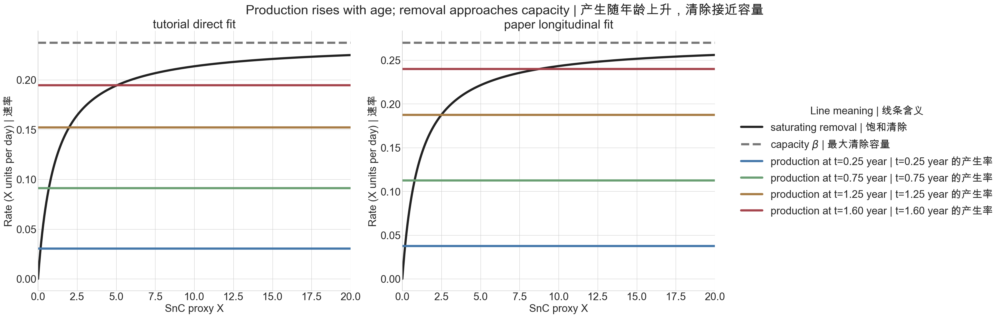

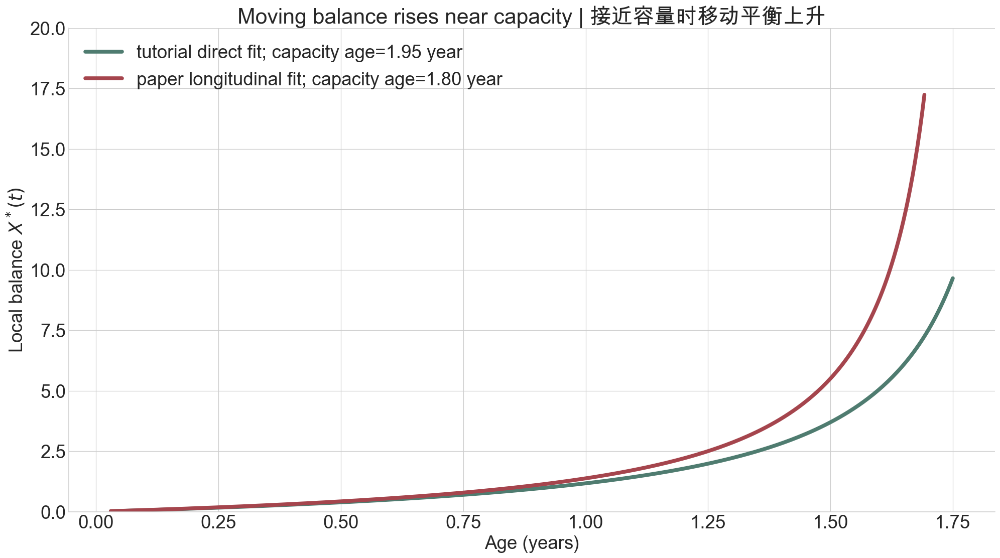

In [39]:
def production_rate(age_years, params):
    '''
    Purpose: Calculate SR production at a specified biological age.
    Parameters: Age in years and an SR parameter dictionary.
    Returns: Production rate.
    Units: X per day.
    Assumptions: Production is eta0 plus eta times age.
    中文说明：计算指定年龄的 SR 产生率。
    '''
    return params["eta0"] + params["eta"] * np.asarray(age_years)


def capacity_age(params):
    '''
    Purpose: Find the age when production reaches maximal removal capacity.
    Parameters: An SR parameter dictionary.
    Returns: Capacity age or infinity when eta is non-positive.
    Units: Years.
    Assumptions: Parameters are constant and beta exceeds eta0 initially.
    中文说明：计算产生率达到最大清除容量的数学年龄。
    '''
    if params["eta"] <= 0:
        return np.inf
    return (params["beta"] - params["eta0"]) / params["eta"]


def quasi_steady_state(age_years, params):
    '''
    Purpose: Solve production equals removal for the moving local balance.
    Parameters: Age in years and an SR parameter dictionary.
    Returns: X-star, or NaN when production reaches capacity.
    Units: Normalized X.
    Assumptions: The balance exists only when production is below beta.
    中文说明：求产生率等于清除率时的移动平衡 X-star。
    '''
    p = production_rate(age_years, params)
    denominator = params["beta"] - p
    return np.where(
        denominator > 0,
        params["kappa"] * p / denominator,
        np.nan,
    )


critical_ages = {
    name: capacity_age(params)
    for name, params in LONGITUDINAL_PARAMETER_SETS.items()
}
print("Capacity ages in years | 容量年龄（year）:")
print(pd.Series(critical_ages).round(3).to_string())

x_grid = np.linspace(0.0, 20.0, 600)
comparison_ages = [0.25, 0.75, 1.25, 1.60]
muted_age_colors = ["#4477AA", "#6A9F73", "#A77C45", "#A5454D"]

fig = plt.figure(figsize=(32, 10), layout="constrained")
section_16_grid = fig.add_gridspec(
    1,
    3,
    width_ratios=[1.0, 1.0, 0.78],
)
axes = [
    fig.add_subplot(section_16_grid[0, 0]),
    fig.add_subplot(section_16_grid[0, 1]),
]
section_16_legend_ax = fig.add_subplot(section_16_grid[0, 2])
section_16_legend_ax.axis("off")

for ax, (label, params) in zip(
    axes,
    LONGITUDINAL_PARAMETER_SETS.items(),
):
    removal = (
        params["beta"]
        * x_grid
        / (params["kappa"] + x_grid)
    )
    ax.plot(
        x_grid,
        removal,
        color="#222222",
        lw=5,
        label="saturating removal | 饱和清除",
    )
    ax.axhline(
        params["beta"],
        color="#777777",
        ls="--",
        lw=5,
        label=r"capacity $\beta$ | 最大清除容量",
    )
    for age, color in zip(comparison_ages, muted_age_colors):
        ax.axhline(
            production_rate(age, params),
            color=color,
            lw=5,
            label=(
                f"production at t={age:.2f} year | "
                f"t={age:.2f} year 的产生率"
            ),
        )
    ax.set(
        title=label,
        xlabel="SnC proxy X",
        ylabel="Rate (X units per day) | 速率",
        xlim=(0, 20),
    )

section_16_handles, section_16_labels = (
    axes[0].get_legend_handles_labels()
)
section_16_legend_ax.legend(
    section_16_handles,
    section_16_labels,
    title="Line meaning | 线条含义",
    frameon=False,
    loc="center left",
)
fig.suptitle(
    "Production rises with age; removal approaches capacity | "
    "产生随年龄上升，清除接近容量",
    fontweight=600,
)
plt.show()

fig, ax = plt.subplots(figsize=(18, 10), layout="constrained")
for (label, params), color in zip(
    LONGITUDINAL_PARAMETER_SETS.items(), ["#4F7C70", "#A5454D"]
):
    age_stop = min(1.75, 0.94 * capacity_age(params))
    ages_local = np.linspace(0.03, max(0.04, age_stop), 350)
    ax.plot(
        ages_local, quasi_steady_state(ages_local, params),
        color=color, lw=5,
        label=f"{label}; capacity age={capacity_age(params):.2f} year",
    )
ax.set(
    title="Moving balance rises near capacity | 接近容量时移动平衡上升",
    xlabel="Age (years)", ylabel=r"Local balance $X^*(t)$",
    ylim=(0, 20),
)
ax.legend(frameon=False)
plt.show()


**How to read the first figure.** The black curve is total
saturating removal. The gray dashed line is its maximum
capacity $\beta$. Each colored horizontal line is production at
one biological age $t$. A crossing of production and removal
is the local balance for that age. The shared legend on the
right applies to both parameter panels.

**如何阅读第一张图。** 黑色曲线是总饱和清除率，灰色虚线是最大清除
容量 $\beta$，每条彩色水平线表示一个生物年龄 $t$ 下的产生率。
产生线与清除曲线的交点就是该年龄的局部平衡。右侧共享图例同时适用
于两组参数面板。


### Micro-lab 9. Set `C1001` parameters and move the balance
### 微实验 9：人为设置 `C1001` 参数并观察平衡移动

**Goal | 目标.** Build intuition for how each SR parameter changes the
production line, saturation curve, moving balance, and capacity age.

**Predict first | 先预测.** If $\beta$ increases while other values
stay fixed, will capacity age and $X^*(t)$ rise or fall?

**Steps | 操作步骤.**

1. Edit all five SR parameters without changing `TUTORIAL_SR`.
2. Compare production and removal at the selected age.
3. Locate their intersection.
4. Change one parameter and run again.

**Scientific meaning | 科学解释.** The intersection is a moving local
reference. Stronger capacity or a larger half-saturation load changes
where average production and removal balance.

**Limit | 局限.** Manually chosen parameters are not fitted estimates;
the figure is a mechanistic thought experiment.

人为参数只用于机制思考，不会覆盖正式拟合。每次只改变一个参数，观察产生线、
饱和清除曲线、交点和容量年龄如何变化。


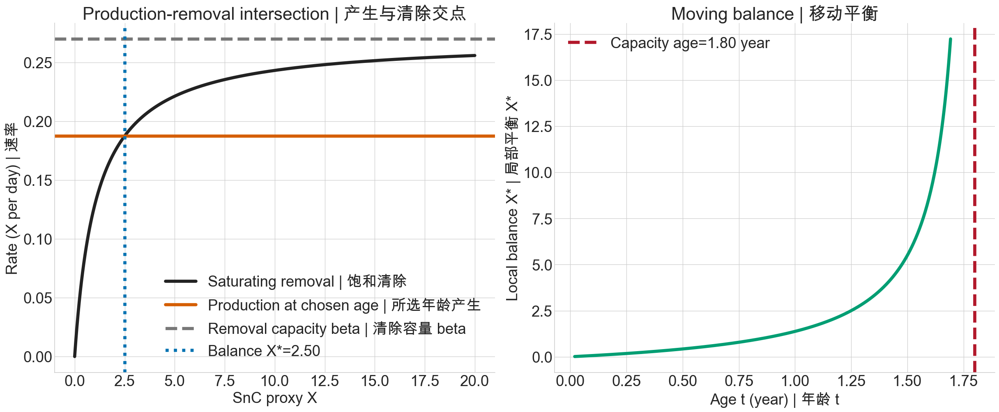

Manual parameters | 人为参数
eta0       0.00
eta        0.15
beta       0.27
kappa      1.10
epsilon    0.14
Chosen-age balance | 所选年龄平衡: 2.500
Capacity age | 容量年龄: 1.800 year


In [40]:
# EDIT HERE | 只修改这里
PRACTICE_9_ETA0 = 0.0
PRACTICE_9_ETA = 0.15
PRACTICE_9_BETA = 0.27
PRACTICE_9_KAPPA = 1.10
PRACTICE_9_EPSILON = 0.14
PRACTICE_9_AGE_YEARS = 1.25

practice_9_params = {
    "eta0": PRACTICE_9_ETA0,
    "eta": PRACTICE_9_ETA,
    "beta": PRACTICE_9_BETA,
    "kappa": PRACTICE_9_KAPPA,
    "epsilon": PRACTICE_9_EPSILON,
}
if PRACTICE_9_ETA0 < 0 or PRACTICE_9_ETA <= 0:
    raise ValueError("eta0 must be non-negative and eta positive. eta0 不能为负，eta 必须为正。")
if PRACTICE_9_BETA <= PRACTICE_9_ETA0 or PRACTICE_9_KAPPA <= 0:
    raise ValueError("beta must exceed eta0 and kappa must be positive. beta 必须大于 eta0，kappa 必须为正。")
if PRACTICE_9_EPSILON < 0 or PRACTICE_9_AGE_YEARS < 0:
    raise ValueError("epsilon and age must be non-negative. epsilon 与年龄不能为负。")

practice_9_capacity_age = capacity_age(practice_9_params)
if PRACTICE_9_AGE_YEARS >= practice_9_capacity_age:
    raise ValueError(
        f"Choose an age below capacity age {practice_9_capacity_age:.3f} year. "
        f"请选择低于容量年龄的 age。"
    )
practice_9_balance = float(
    quasi_steady_state(PRACTICE_9_AGE_YEARS, practice_9_params)
)
practice_9_x = np.linspace(0, max(20, practice_9_balance * 1.5), 700)
practice_9_production = float(
    production_rate(PRACTICE_9_AGE_YEARS, practice_9_params)
)
practice_9_removal = (
    practice_9_params["beta"]
    * practice_9_x
    / (practice_9_params["kappa"] + practice_9_x)
)
practice_9_ages = np.linspace(
    0.02,
    0.94 * practice_9_capacity_age,
    400,
)

fig, axes = plt.subplots(1, 2, figsize=(22, 9), layout="constrained")
axes[0].plot(
    practice_9_x,
    practice_9_removal,
    color="#222222",
    lw=5,
    label="Saturating removal | 饱和清除",
)
axes[0].axhline(
    practice_9_production,
    color="#D55E00",
    lw=5,
    label="Production at chosen age | 所选年龄产生",
)
axes[0].axhline(
    practice_9_params["beta"],
    color="#777777",
    lw=5,
    ls="--",
    label="Removal capacity beta | 清除容量 beta",
)
axes[0].axvline(
    practice_9_balance,
    color="#0072B2",
    lw=5,
    ls=":",
    label=f"Balance X*={practice_9_balance:.2f}",
)
axes[0].set(
    title="Production-removal intersection | 产生与清除交点",
    xlabel="SnC proxy X",
    ylabel="Rate (X per day) | 速率",
)
axes[0].legend(frameon=False)
axes[1].plot(
    practice_9_ages,
    quasi_steady_state(practice_9_ages, practice_9_params),
    color="#009E73",
    lw=5,
)
axes[1].axvline(
    practice_9_capacity_age,
    color="#B2182B",
    lw=5,
    ls="--",
    label=f"Capacity age={practice_9_capacity_age:.2f} year",
)
axes[1].set(
    title="Moving balance | 移动平衡",
    xlabel="Age t (year) | 年龄 t",
    ylabel="Local balance X* | 局部平衡 X*",
)
axes[1].legend(frameon=False)
plt.show()

print("Manual parameters | 人为参数")
print(pd.Series(practice_9_params).round(4).to_string())
print("Chosen-age balance | 所选年龄平衡:", f"{practice_9_balance:.3f}")
print("Capacity age | 容量年龄:", f"{practice_9_capacity_age:.3f} year")


## 17. Turnover and an independent perturbation experiment
## 17. 更新与独立扰动实验

The per-unit removal rate and local half-time are

$$
r_{\mathrm{unit}}(X)=\frac{\beta}{\kappa+X},
\qquad
t_{1/2}(X)=\frac{\log 2\,(\kappa+X)}{\beta}.
$$

At high load, total removal is near capacity, so each additional unit
receives less removal and the half-time grows. This half-time is not a
mouse lifespan and does not mean total $X$ must halve while production
continues.

高负荷时总清除接近容量，每个新增单位分到的清除能力下降，因此局部半衰期
增长。该半衰期不是小鼠寿命，也不表示在持续产生时总 $X$ 必然减半。

Figure 3 is independent of the longitudinal Figure 2 fitting cohort.
Bleomycin induced lung epithelial SnCs, and their decline was measured
with SA-beta-Gal and epithelial markers. In this notebook:

- points and error bars are labeled **Paper Source Data**;
- computed curves are labeled **Tutorial refit** or
  **Paper longitudinal fit**.

Figure 3 使用独立于 Figure 2 拟合队列的小鼠。图中的点和误差条明确标为
**Paper Source Data**；计算曲线分别标为 **Tutorial refit** 与
**Paper longitudinal fit**。


**Function card | 函数说明卡**

`local_removal_half_time(x, params)` converts local per-unit removal
into days required for a small excess to halve if that local rate stayed
fixed.

`local_removal_half_time(x, params)` 把局部单位清除率换算为一个小扰动在
局部速率不变时减少一半所需的 day。

Example | 调用示例：
`local_removal_half_time(3.0, PAPER_LONGITUDINAL_SR)`


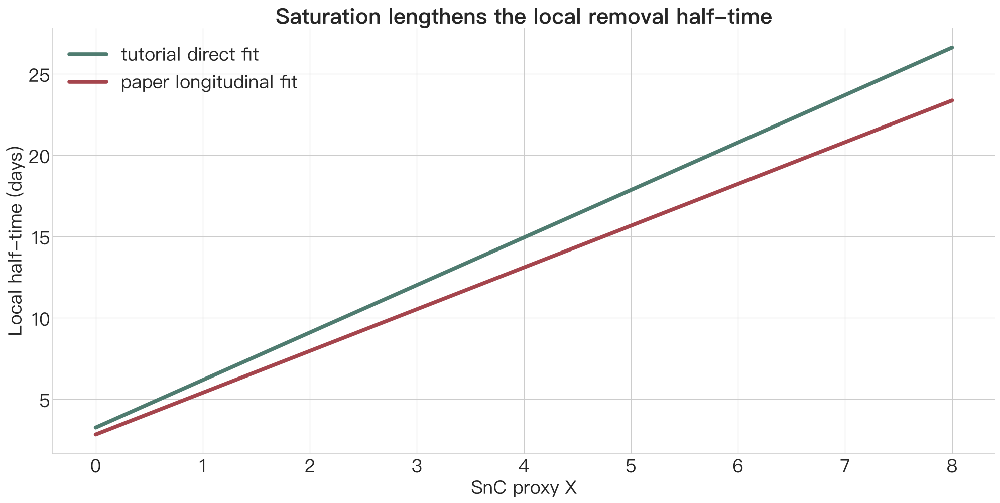

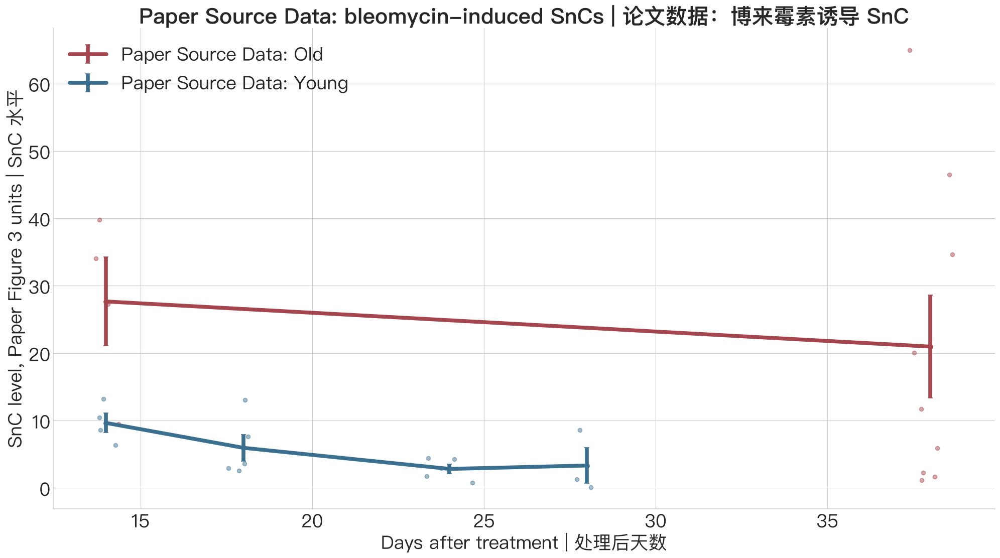

,quantity,young mice (days),old mice (days)
0,Observed half-life,4.7,18.0
1,SR prediction from longitudinal fit,5.0,25.0


In [44]:
def local_removal_half_time(x, params):
    '''
    Purpose: Convert local per-unit removal into a half-time.
    Parameters: SnC proxy load X and an SR parameter dictionary.
    Returns: Local removal half-time.
    Units: Days.
    Assumptions: The local per-unit rate beta divided by kappa plus X stays fixed.
    中文说明：把局部单位清除率转换为清除半衰期。
    '''
    return np.log(2.0) * (params["kappa"] + np.asarray(x)) / params["beta"]


half_time_x = np.linspace(0, 8, 300)
fig, ax = plt.subplots(figsize=(18, 9), layout="constrained")
for (label, params), color in zip(
    LONGITUDINAL_PARAMETER_SETS.items(), ["#4F7C70", "#A5454D"]
):
    ax.plot(
        half_time_x, local_removal_half_time(half_time_x, params),
        color=color, lw=5, label=label,
    )
ax.set(
    title="Saturation lengthens the local removal half-time",
    xlabel="SnC proxy X", ylabel="Local half-time (days)",
)
ax.legend(frameon=False)
plt.show()

fig3 = source_cells["Figure3"]
turnover_rows = []
for row in range(3, 52):
    group = fig3.get(f"B{row}")
    if group is not None:
        day_after_treatment = fig3.get(f"D{row}")
        turnover_rows.append({
            "group": str(group),
            "SnC": float(fig3[f"C{row}"]),
            "day_after_treatment": (
                float(day_after_treatment)
                if day_after_treatment is not None
                else np.nan
            ),
        })
turnover = pd.DataFrame(turnover_rows)
bleomycin = turnover[
    turnover["group"].str.startswith("BLEO")
    & turnover["day_after_treatment"].notna()
].copy()
bleomycin["age_group"] = np.where(
    bleomycin["group"].str.endswith("YNG"), "Young", "Old"
)
turnover_means = (
    bleomycin.groupby(["age_group", "day_after_treatment"])["SnC"]
    .agg(["mean", "sem"]).reset_index()
)

fig, ax = plt.subplots(figsize=(18, 10), layout="constrained")
turnover_palette = {"Young": "#3A6F8F", "Old": "#A5454D"}
for age_group, frame in bleomycin.groupby("age_group"):
    rng = np.random.default_rng(15000 if age_group == "Young" else 15001)
    jitter = rng.normal(0, 0.32, len(frame))
    ax.scatter(
        frame["day_after_treatment"] + jitter, frame["SnC"],
        alpha=0.48, color=turnover_palette[age_group], s=28,
    )
    means = turnover_means.query("age_group == @age_group")
    ax.errorbar(
        means["day_after_treatment"], means["mean"], yerr=means["sem"],
        color=turnover_palette[age_group], marker="o", lw=5,
        capsize=3, label=f"Paper Source Data: {age_group}",
    )
ax.set(
    title="Paper Source Data: bleomycin-induced SnCs | 论文数据：博来霉素诱导 SnC",
    xlabel="Days after treatment | 处理后天数", ylabel="SnC level, Paper Figure 3 units | SnC 水平",
)
ax.legend(frameon=False)
plt.show()

published_turnover_check = pd.DataFrame({
    "quantity": ["Observed half-life", "SR prediction from longitudinal fit"],
    "young mice (days)": [4.7, 5.0],
    "old mice (days)": [18.0, 25.0],
})
published_turnover_check


### Micro-lab 10. Compare two longitudinal fits at the same load
### 微实验 10：在同一负荷下比较两组纵向拟合

**Goal.** Compare the tutorial refit and paper longitudinal fit while
holding the SnC proxy load $X$ fixed.

**目标。** 固定同一个 SnC proxy 负荷 $X$，比较教程重拟合和论文纵向拟合。

**Predict first.** Which parameter set gives the longer local removal
half-time at your chosen $X$?

**先预测。** 在所选 $X$ 下，哪一组参数给出更长的局部清除半衰期？

$$
T_{1/2}(X)
=
\frac{\log 2\,(\kappa+X)}{\beta}.
$$

**Steps.** Choose one non-negative $X$, 
and run the cell. The table substitutes the same $X$ into both parameter
sets; the figure shows where that comparison sits on the full curves.

**操作步骤。** 选择一个非负 $X$，然后运行
单元。表格把同一个 $X$ 代入两组参数，图中则显示该比较在完整曲线上的位置。

**Scientific meaning.** This isolates the effect of the fitted
$\beta$ and $\kappa$. It is not a new fit to Figure 3, whose experimental
measurements and reported half-lives remain in the preceding cell.

**科学含义。** 该实验单独考察拟合得到的 $\beta$ 与 $\kappa$ 如何影响
半衰期。它不是对 Figure 3 的重新拟合；实验数据和论文报告半衰期仍保留在
前一个单元。

**Limit.** A local half-time assumes the per-unit removal rate stays
fixed near the chosen load. A finite perturbation can leave that local
regime; Micro-lab 11 studies recovery trajectories.

**局限。** 局部半衰期假定所选负荷附近的单位清除率保持不变。有限扰动可能
离开这个局部范围；微实验 11 再研究完整恢复轨迹。


Same-load half-time comparison | 同一负荷半衰期比较
parameter set | 参数组  beta | 最大清除容量  kappa | 半饱和负荷  chosen X | 所选 X  local half-time day | 局部半衰期 day
           tutorial         0.2373         1.1128              3.0                          12.0121
              paper         0.2700         1.1000              3.0                          10.5256


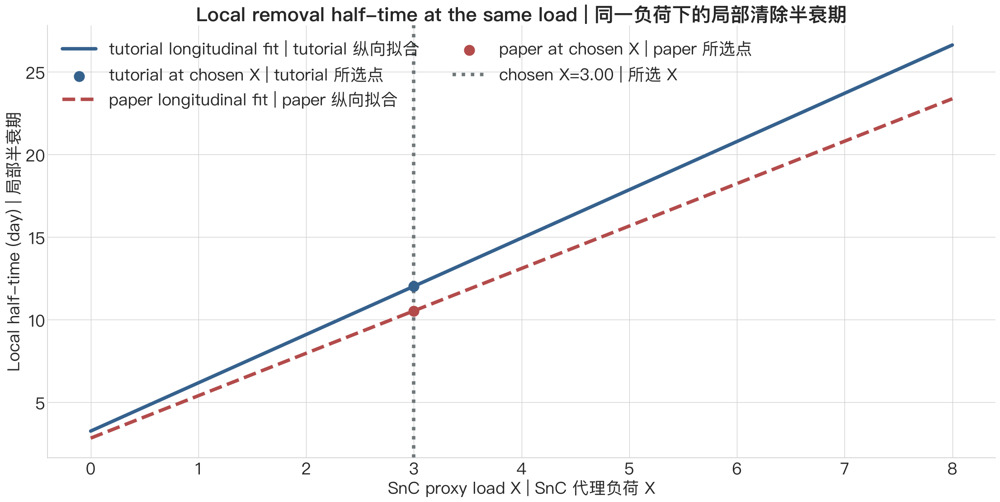

In [90]:
# EDIT HERE | 只修改这里
PRACTICE_10_X = 3.0

if PRACTICE_10_X < 0:
    raise ValueError(
        "Choose a non-negative X. | 请选择非负的 X。"
    )

practice_10_parameter_sets = {
    "tutorial": TUTORIAL_SR,
    "paper": PAPER_LONGITUDINAL_SR,
}
practice_10_rows = []
for label, params in practice_10_parameter_sets.items():
    practice_10_rows.append({
        "parameter set | 参数组": label,
        "beta | 最大清除容量": params["beta"],
        "kappa | 半饱和负荷": params["kappa"],
        "chosen X | 所选 X": PRACTICE_10_X,
        "local half-time day | 局部半衰期 day": float(
            local_removal_half_time(
                PRACTICE_10_X,
                params,
            )
        ),
    })
practice_10_results = pd.DataFrame(practice_10_rows)
practice_10_winner = str(
    practice_10_results.sort_values(
        "local half-time day | 局部半衰期 day",
        ascending=False,
    ).iloc[0]["parameter set | 参数组"]
)
print("Same-load half-time comparison | 同一负荷半衰期比较")
print(practice_10_results.round(4).to_string(index=False))

practice_10_x_grid = np.linspace(
    0,
    max(8.0, PRACTICE_10_X * 1.5 + 1.0),
    500,
)
practice_10_styles = {
    "tutorial": ("#35618D", "-"),
    "paper": ("#B34B4B", "--"),
}
fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
for label, params in practice_10_parameter_sets.items():
    color, linestyle = practice_10_styles[label]
    curve = local_removal_half_time(
        practice_10_x_grid,
        params,
    )
    selected_half_time = float(
        local_removal_half_time(PRACTICE_10_X, params)
    )
    ax.plot(
        practice_10_x_grid,
        curve,
        color=color,
        ls=linestyle,
        lw=5,
        label=f"{label} longitudinal fit | {label} 纵向拟合",
    )
    ax.scatter(
        [PRACTICE_10_X],
        [selected_half_time],
        color=color,
        s=220,
        zorder=5,
        label=f"{label} at chosen X | {label} 所选点",
    )
ax.axvline(
    PRACTICE_10_X,
    color="#6F7779",
    ls=":",
    lw=5,
    label=f"chosen X={PRACTICE_10_X:.2f} | 所选 X",
)
ax.set(
    title="Local removal half-time at the same load | 同一负荷下的局部清除半衰期",
    xlabel="SnC proxy load X | SnC 代理负荷 X",
    ylabel="Local half-time (day) | 局部半衰期",
)
ax.legend(frameon=False, ncol=2)
plt.show()


## 18. Restoring strength, local variance, and relaxation time
## 18. 恢复强度、局部方差与松弛时间

Near a local balance $X^*(t)$, consider a small displacement
$\delta X$. The restoring strength is the negative slope of the drift:

在局部平衡 $X^*(t)$ 附近，考虑一个很小的偏离 $\delta X$。
恢复强度等于漂移斜率的相反数：

$$
\lambda(t)
=-\left.\frac{\partial f}{\partial X}\right|_{X^*(t)}
=\frac{\beta\kappa}{\left(\kappa+X^*(t)\right)^2}.
$$

A larger $\lambda$ means a stronger average pull back
toward balance. A local linear approximation gives

$\lambda$ 越大，系统平均回到平衡的力量越强。局部线性近似给出

$$
\operatorname{Var}(X\mid t)\approx\frac{\epsilon}{\lambda(t)},
\qquad
\tau(t)=\frac{1}{\lambda(t)}.
$$

| Quantity | English meaning | 中文含义 | Unit |
|---|---|---|---|
| $\lambda$ | restoring strength | 恢复强度 | day $^{-1}$ |
| $\epsilon/\lambda$ | local variance around balance | 平衡附近的局部方差 | $X^2$ |
| $\tau=1/\lambda$ | characteristic relaxation time | 特征松弛时间 | day |

These are local approximations. They describe small
deviations while age changes slowly; they are not a second fitted model.

这些都是局部近似，只描述年龄变化较慢时平衡附近的小偏离，
并不是第二个独立拟合的模型。


**Function card.** `local_dynamic_metrics(age_years, params)` calculates
$X^*$, $\lambda$, $\epsilon/\lambda$, and $1/\lambda$ for selected ages.

**函数说明卡。** `local_dynamic_metrics(age_years, params)` 计算指定年龄
下的 $X^*$、$\lambda$、$\epsilon/\lambda$ 和 $1/\lambda$。

**Example | 示例：**
`local_dynamic_metrics(np.array([0.5, 1.0]), TUTORIAL_SR)`


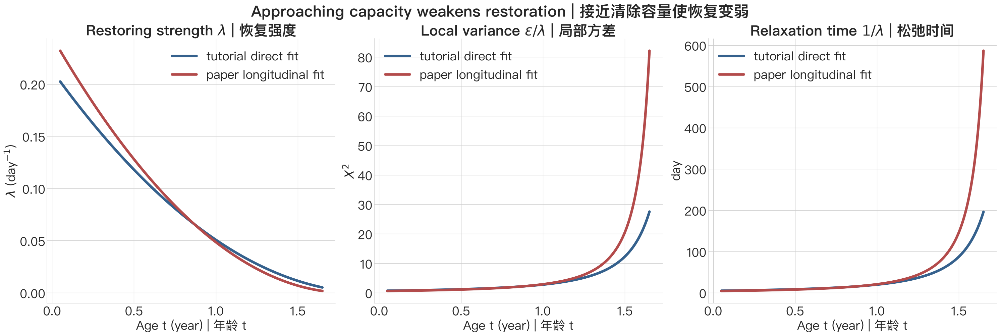

,parameter_set,age_years,x_star,lambda_per_day,local_variance,relaxation_days
0,tutorial direct fit,0.50,0.3832,0.1180,1.1901,8.4745
1,tutorial direct fit,1.25,1.9819,0.0276,5.0925,36.2640
2,paper longitudinal fit,0.50,0.4231,0.1280,1.0935,7.8107
3,paper longitudinal fit,1.25,2.5000,0.0229,6.1091,43.6364


In [46]:
def local_dynamic_metrics(age_years, params):
    """
    Purpose: Calculate local balance, restoration, variance, and relaxation.
    Parameters: Ages in year and one SR parameter dictionary.
    Returns: A DataFrame with one row per requested age.
    Units: lambda in 1/day, variance in X^2, relaxation in day.
    Assumptions: Small deviations near a slowly moving local balance.
    中文说明：计算局部平衡、恢复强度、方差近似和松弛时间。
    """
    ages = np.asarray(age_years, dtype=float)
    x_star = quasi_steady_state(ages, params)
    restoring = (
        params["beta"] * params["kappa"]
        / (params["kappa"] + x_star) ** 2
    )
    return pd.DataFrame({
        "age_years": ages,
        "x_star": x_star,
        "lambda_per_day": restoring,
        "local_variance": params["epsilon"] / restoring,
        "relaxation_days": 1 / restoring,
    })


fig, axes = plt.subplots(
    1,
    3,
    figsize=(27, 9),
    layout="constrained",
)
metric_specs = [
    (
        "lambda_per_day",
        r"Restoring strength $\lambda$ | 恢复强度",
        r"$\lambda$ (day$^{-1}$)",
    ),
    (
        "local_variance",
        r"Local variance $\epsilon/\lambda$ | 局部方差",
        r"$X^2$",
    ),
    (
        "relaxation_days",
        r"Relaxation time $1/\lambda$ | 松弛时间",
        "day",
    ),
]
parameter_colors = {
    "tutorial direct fit": "#35618D",
    "paper longitudinal fit": "#B34B4B",
}
for label, params in LONGITUDINAL_PARAMETER_SETS.items():
    age_stop = min(1.65, 0.92 * capacity_age(params))
    metric_ages = np.linspace(0.05, max(0.06, age_stop), 320)
    metric_table = local_dynamic_metrics(metric_ages, params)
    for ax, (column, title, ylabel) in zip(
        axes,
        metric_specs,
    ):
        ax.plot(
            metric_table["age_years"],
            metric_table[column],
            color=parameter_colors[label],
            lw=5,
            label=label,
        )
        ax.set(
            title=title,
            xlabel="Age t (year) | 年龄 t",
            ylabel=ylabel,
        )
        ax.legend(frameon=False)
fig.suptitle(
    "Approaching capacity weakens restoration | 接近清除容量使恢复变弱",
    fontweight=600,
)
plt.show()

worked_dynamic_example = pd.concat(
    [
        local_dynamic_metrics(
            np.array([0.50, 1.25]),
            params,
        ).assign(parameter_set=label)
        for label, params in LONGITUDINAL_PARAMETER_SETS.items()
    ],
    ignore_index=True,
)
worked_dynamic_example[
    [
        "parameter_set",
        "age_years",
        "x_star",
        "lambda_per_day",
        "local_variance",
        "relaxation_days",
    ]
].round(4)


### Micro-lab 11. Perturb the SR model and watch recovery slow
### 微实验 11：扰动 SR 模型并观察恢复变慢

**Goal.** Compare the complete deterministic `C1001` drift with its
local exponential approximation after the same upward perturbation.

**目标。** 对同样大小的向上扰动，比较 `C1001` 完整确定性漂移与局部指数
近似的恢复过程。

**Model used.** The equation is the `C1001` SR model. The default
parameter set is `tutorial direct fit`; students may switch to
`paper longitudinal fit`.

**使用模型。** 方程为 `C1001` 的 SR 模型。默认参数是
`tutorial direct fit`，也可以切换为 `paper longitudinal fit`。

**Predict first.** At which selected age will the same displacement
remain larger for longer?

**先预测。** 在你选择的两个年龄中，同样的偏离会在哪个年龄保持得更久？

**Editable variables.** Choose the parameter set, two ages, perturbation
size, total duration, and numerical step.

**可编辑变量。** 可选择参数组、两个年龄、扰动大小、总观察时长与数值步长。

$$
\delta X_{\mathrm{local}}(s)
=\delta X_0e^{-\lambda s}.
$$

**Reading the figure.** Solid lines use the complete nonlinear drift.
Dashed lines use the local approximation. Their separation shows where
a finite perturbation is no longer well described as infinitesimal.

**阅读图片。** 实线使用完整非线性漂移，虚线使用局部近似。两者之间的差距
表示有限扰动在多大程度上偏离“小扰动”假设。

**Limit.** This holds age fixed and omits random noise. It is an
intervention thought experiment, not a new fit and not Figure 3 itself.

**局限。** 本实验固定年龄且不加入随机噪声，是一个干预思想实验，不是新的
参数拟合，也不等同于 Figure 3 的真实实验。


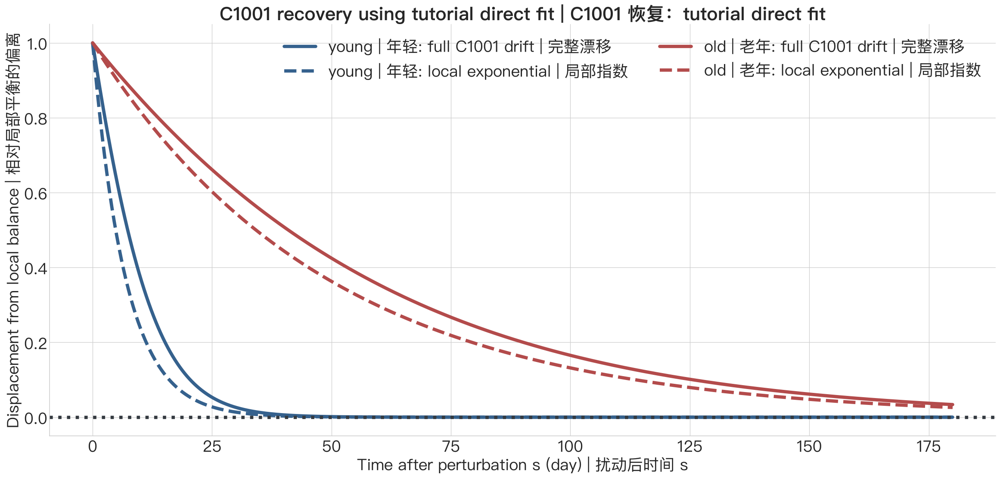

Model | 模型: C1001 SR
Parameter set | 参数组: tutorial direct fit
Initial perturbation | 初始扰动: 1.000 X
Observation duration | 观察时长: 180 day


,age_label | 年龄组,age_years,local_balance,lambda_per_day,relaxation_days,full_remaining_fraction,local_remaining_fraction
0,young | 年轻,0.35,0.2431,0.1436,6.9616,0.0000,0.000
1,old | 老年,1.35,2.4961,0.0203,49.3162,0.0337,0.026


In [47]:
# EDIT HERE | 只修改这里
PRACTICE_11_PARAMETER_SET = "tutorial direct fit"
PRACTICE_11_YOUNG_AGE_YEARS = 0.35
PRACTICE_11_OLD_AGE_YEARS = 1.35
PRACTICE_11_PERTURBATION_X = 1.0
PRACTICE_11_DURATION_DAYS = 180
PRACTICE_11_STEP_DAYS = 0.25

if PRACTICE_11_PARAMETER_SET not in LONGITUDINAL_PARAMETER_SETS:
    raise ValueError(
        f"Choose from {list(LONGITUDINAL_PARAMETER_SETS)}. | "
        f"请从以下参数组中选择：{list(LONGITUDINAL_PARAMETER_SETS)}"
    )
if (
    PRACTICE_11_YOUNG_AGE_YEARS < 0
    or PRACTICE_11_OLD_AGE_YEARS
    <= PRACTICE_11_YOUNG_AGE_YEARS
    or PRACTICE_11_PERTURBATION_X <= 0
    or PRACTICE_11_DURATION_DAYS <= 0
    or PRACTICE_11_STEP_DAYS <= 0
):
    raise ValueError(
        "Use ordered non-negative ages and positive experiment settings. | "
        "年龄必须非负且 old 大于 young，实验参数必须为正。"
    )

practice_11_params = LONGITUDINAL_PARAMETER_SETS[
    PRACTICE_11_PARAMETER_SET
]
practice_11_capacity_age = capacity_age(practice_11_params)
if PRACTICE_11_OLD_AGE_YEARS >= practice_11_capacity_age:
    raise ValueError(
        f"Old age must stay below capacity age "
        f"{practice_11_capacity_age:.3f} year. | "
        f"较老年龄必须低于容量年龄 {practice_11_capacity_age:.3f} year。"
    )

practice_11_ages = [
    ("young | 年轻", PRACTICE_11_YOUNG_AGE_YEARS, "#35618D"),
    ("old | 老年", PRACTICE_11_OLD_AGE_YEARS, "#B34B4B"),
]
practice_11_time = np.arange(
    0,
    PRACTICE_11_DURATION_DAYS + PRACTICE_11_STEP_DAYS / 2,
    PRACTICE_11_STEP_DAYS,
)
practice_11_rows = []
fig, ax = plt.subplots(figsize=(21, 10), layout="constrained")
for age_label, age_years, color in practice_11_ages:
    equilibrium = float(
        quasi_steady_state(age_years, practice_11_params)
    )
    restoring = (
        practice_11_params["beta"]
        * practice_11_params["kappa"]
        / (practice_11_params["kappa"] + equilibrium) ** 2
    )
    state = equilibrium + PRACTICE_11_PERTURBATION_X
    full_deviation = [PRACTICE_11_PERTURBATION_X]
    for _ in practice_11_time[1:]:
        state += float(
            sr_drift(
                state,
                age_years * DAYS_PER_YEAR,
                practice_11_params,
            )
        ) * PRACTICE_11_STEP_DAYS
        full_deviation.append(state - equilibrium)
    full_deviation = np.asarray(full_deviation)
    local_deviation = (
        PRACTICE_11_PERTURBATION_X
        * np.exp(-restoring * practice_11_time)
    )
    ax.plot(
        practice_11_time,
        full_deviation,
        color=color,
        lw=5,
        label=f"{age_label}: full C1001 drift | 完整漂移",
    )
    ax.plot(
        practice_11_time,
        local_deviation,
        color=color,
        lw=5,
        ls="--",
        label=f"{age_label}: local exponential | 局部指数",
    )
    practice_11_rows.append({
        "age_label | 年龄组": age_label,
        "age_years": age_years,
        "local_balance": equilibrium,
        "lambda_per_day": restoring,
        "relaxation_days": 1 / restoring,
        "full_remaining_fraction": (
            full_deviation[-1] / PRACTICE_11_PERTURBATION_X
        ),
        "local_remaining_fraction": (
            local_deviation[-1] / PRACTICE_11_PERTURBATION_X
        ),
    })
ax.axhline(0, color="#343A40", lw=5, ls=":")
ax.set(
    title=(
        f"C1001 recovery using {PRACTICE_11_PARAMETER_SET} | "
        f"C1001 恢复：{PRACTICE_11_PARAMETER_SET}"
    ),
    xlabel="Time after perturbation s (day) | 扰动后时间 s",
    ylabel="Displacement from local balance | 相对局部平衡的偏离",
)
ax.legend(frameon=False, ncol=2)
plt.show()

practice_11_results = pd.DataFrame(practice_11_rows)
print(
    "Model | 模型: C1001 SR\n"
    f"Parameter set | 参数组: {PRACTICE_11_PARAMETER_SET}\n"
    f"Initial perturbation | 初始扰动: {PRACTICE_11_PERTURBATION_X:.3f} X\n"
    f"Observation duration | 观察时长: {PRACTICE_11_DURATION_DAYS} day"
)
practice_11_results.round(4)


## 19. Potential landscape: a visual summary of restoration
## 19. 势函数：恢复力的图形总结

The deterministic SR drift can be written as
$f=-\partial U/\partial X$ using

SR 模型的确定性漂移可以写成 $f=-\partial U/\partial X$，其中

$$
U(X,t)
=\left[\beta-(\eta_0+\eta t)\right]X
-\beta\kappa\log(\kappa+X).
$$

Imagine a ball in a valley. The negative slope gives the
deterministic direction of motion. The absolute height is arbitrary;
differences in height and steepness carry the information.

可以把系统想象成山谷中的小球。势函数的负斜率给出确定性运动
方向。绝对高度可以整体平移，真正有意义的是高度差与地形陡峭程度。

A steep well produces strong restoration. A flatter well near
removal capacity produces weaker restoration and a wider local density
view. This is another representation of the same SR equation, not a newly
fitted mechanism.

陡峭势阱对应较强恢复；接近清除容量时势阱变平，对应较弱恢复和
更宽的局部密度图。它只是同一个 SR 方程的另一种表示，并非新的拟合机制。


**Function card | 函数说明卡**

`sr_potential(x, age_years, params)` returns a landscape whose negative
slope equals the deterministic SR drift. Only height differences and
slopes matter; adding a constant does not change the dynamics.

`sr_potential(...)` 返回一个负斜率等于 SR 确定性漂移的地形。只有高度差和
斜率有意义；整体加上常数不会改变动力学。

Example | 调用示例：`sr_potential(3.0, 1.0, TUTORIAL_SR)`


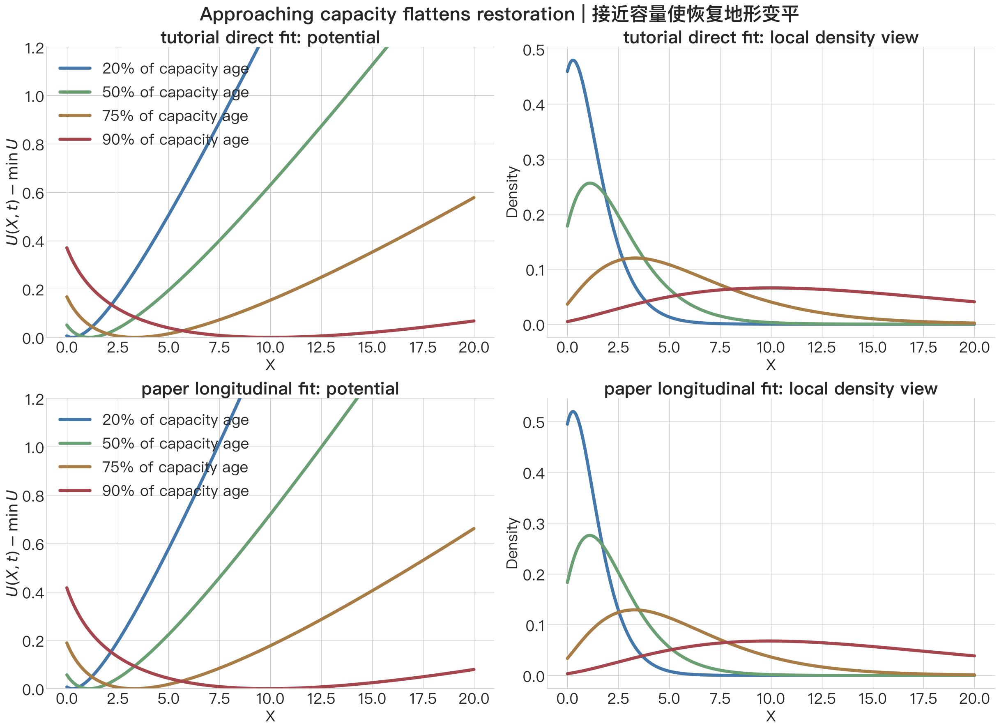


Potential formula check | 势函数公式检查
  X  -dU_dX numerical | 数值负斜率  SR drift formula | SR 漂移公式  absolute difference | 绝对差
0.5                  0.048012                    0.048012                        0.0
2.0                 -0.030895                   -0.030895                        0.0
5.0                 -0.072531                   -0.072531                        0.0


In [48]:
def sr_potential(x, age_years, params):
    '''
    Purpose: Evaluate a potential whose negative slope equals SR drift.
    Parameters: State X, age in years, and SR parameters.
    Returns: Potential values up to an arbitrary additive constant.
    Units: X squared per day in the tutorial scaling.
    Assumptions: Age is held fixed while viewing one landscape.
    中文说明：计算负斜率等于 SR 漂移的势函数；绝对零点可任意平移。
    '''
    p = production_rate(age_years, params)
    return (
        (params["beta"] - p) * np.asarray(x)
        - params["beta"] * params["kappa"]
        * np.log(params["kappa"] + np.asarray(x))
    )


landscape_x = np.linspace(0, 20, 900)
capacity_fractions = [0.20, 0.50, 0.75, 0.90]
landscape_colors = ["#4477AA", "#6A9F73", "#A77C45", "#A5454D"]
fig, axes = plt.subplots(2, 2, figsize=(22, 16), layout="constrained")
for row_index, (label, params) in enumerate(LONGITUDINAL_PARAMETER_SETS.items()):
    for fraction, color in zip(capacity_fractions, landscape_colors):
        age = fraction * capacity_age(params)
        potential_values = sr_potential(landscape_x, age, params)
        potential_values -= np.nanmin(potential_values)
        axes[row_index, 0].plot(
            landscape_x, potential_values, color=color, lw=5,
            label=f"{fraction:.0%} of capacity age",
        )
        density = np.exp(-potential_values / params["epsilon"])
        density /= np.trapezoid(density, landscape_x)
        axes[row_index, 1].plot(landscape_x, density, color=color, lw=5)
    axes[row_index, 0].set(
        title=f"{label}: potential", xlabel="X",
        ylabel=r"$U(X,t)-\min U$", ylim=(0, 1.2),
    )
    axes[row_index, 1].set(
        title=f"{label}: local density view", xlabel="X", ylabel="Density",
    )
    axes[row_index, 0].legend(frameon=False, fontsize=24)
fig.suptitle("Approaching capacity flattens restoration | 接近容量使恢复地形变平", fontweight=600)
plt.show()



# Numerical derivative check: the formula and code must agree.
potential_check_x = np.array([0.5, 2.0, 5.0])
potential_check_age_years = 1.0
potential_check_step = 1e-5
negative_numerical_slope = -(
    sr_potential(
        potential_check_x + potential_check_step,
        potential_check_age_years,
        TUTORIAL_SR,
    )
    - sr_potential(
        potential_check_x - potential_check_step,
        potential_check_age_years,
        TUTORIAL_SR,
    )
) / (2 * potential_check_step)
direct_sr_drift = sr_drift(
    potential_check_x,
    potential_check_age_years * DAYS_PER_YEAR,
    TUTORIAL_SR,
)
potential_formula_check = pd.DataFrame({
    "X": potential_check_x,
    "-dU_dX numerical | 数值负斜率": negative_numerical_slope,
    "SR drift formula | SR 漂移公式": direct_sr_drift,
    "absolute difference | 绝对差": np.abs(
        negative_numerical_slope - direct_sr_drift
    ),
})
assert np.allclose(
    negative_numerical_slope,
    direct_sr_drift,
    atol=1e-8,
)
print("\nPotential formula check | 势函数公式检查")
print(potential_formula_check.round(8).to_string(index=False))


## 20. Gompertz hazard before the threshold mechanism
## 20. 先区分死亡风险、hazard 与存活率，再讨论阈值机制

Four quantities are often confused. Let $T$ be age at
death:

四个量经常被混用。令 $T$ 表示死亡年龄：

$$
S(t)=P(T>t),
\qquad
F(t)=1-S(t).
$$

| Quantity | English meaning | 中文含义 | Range or unit |
|---|---|---|---|
| $S(t)$ | probability of surviving beyond age $t$ | 活过年龄 $t$ 的概率 | 0 to 1 |
| $F(t)$ | probability of having died by age $t$ | 到年龄 $t$ 已死亡的累计概率 | 0 to 1 |
| $q_t$ | probability of dying during the next year, conditional on being alive at $t$ | 已活到 $t$ 岁后下一年死亡的条件概率 | 0 to 1 |
| $h(t)$ | instantaneous death rate among those alive at $t$ | 年龄 $t$ 时存活者的瞬时死亡率 | year $^{-1}$ |

The workbook columns `risk_men` and `risk_women` are annual
conditional risks per 1,000 survivors. They satisfy, up to source-data
rounding,

工作簿中的 `risk_men` 和 `risk_women` 是每千名存活者的年度
条件死亡风险。除去原始数据舍入误差，它们满足

$$
q_t
=
1-\frac{S(t+1)}{S(t)},
\qquad
\mathrm{source\ risk}=1000q_t.
$$

If hazard is treated as constant inside each one-year
interval, the exact conversion is

若假定每个一年区间内 hazard 恒定，则精确换算为

$$
h_t=-\log(1-q_t).
$$

Gompertz law applies to hazard, not survival:

Gompertz law 描述的是 hazard，而不是 survival：

$$
h(t)=h_0e^{\gamma t},
\qquad
\log h(t)=\log h_0+\gamma t.
$$

Survival is obtained by accumulating hazard:

Survival 需要通过 hazard 的累计积分得到：

$$
S(t)
=
\exp\left[-\int_0^t h(u)\,du\right]
=
\exp\left[
-\frac{h_0}{\gamma}
\left(e^{\gamma t}-1\right)
\right].
$$

Hazard is therefore neither the probability of already
being dead nor $1-S(t)$. The doubling time of Gompertz hazard is

因此 hazard 既不是“已经死亡的概率”，也不是 $1-S(t)$。
Gompertz hazard 的倍增时间为

$$
T_{\mathrm{double}}=\frac{\log 2}{\gamma}.
$$


**Function card.** `fit_gompertz_hazard(age, hazard)` fits a straight
line to $\log h(t)$ and returns $\gamma$, $h_0$, doubling time,
log-scale $R^2$, and fitted hazard.

**函数说明卡。** `fit_gompertz_hazard(age, hazard)` 对 $\log h(t)$
拟合直线，并返回 $\gamma$、$h_0$、倍增时间、对数尺度 $R^2$ 和拟合
hazard。

**English.** `gompertz_conditional_survival(...)` integrates the fitted
hazard and returns survival conditional on being alive at a selected
starting age.

**中文。** `gompertz_conditional_survival(...)` 对拟合 hazard 积分，
返回在指定起始年龄仍存活这一条件下的后续 survival。

**English.** `simulate_first_passage(...)` separately uses the paper's
mouse-mortality SR parameters until each path first crosses $X_C$.

**中文。** `simulate_first_passage(...)` 另行使用论文的小鼠死亡率 SR
参数，模拟每条轨迹首次越过 $X_C$ 的日期。


Parameter roles | 参数用途
                      parameter set | 参数组                                  used for | 用途  shared | 是否共享
tutorial direct longitudinal fit | 教程纵向拟合 Figure 2 transition likelihood | Figure 2 转移似然          False
          paper longitudinal fit | 论文纵向拟合   published longitudinal comparison | 论文纵向结果对照          False
    paper mouse mortality fit | 论文小鼠死亡率拟合  Figure 4 threshold survival | Figure 4 阈值生存模拟          False

Annual risk reconstruction audit | 年度风险重建检查
group | 组别  maximum absolute difference per 1000 | 每千人最大绝对差
       men                                         0.256838
     women                                         0.068747

Gompertz hazard fit results | Gompertz hazard 拟合结果
group | 组别  n  age_min  age_max  log_h0_intercept  gamma_per_year  h0_per_year  doubling_time_years  R2_log_hazard
       men 71     30.0    100.0        -10.922374        0.101936     0.000018             6.799842       0.993329
     women 71     30.0    100.0        -11.693255     

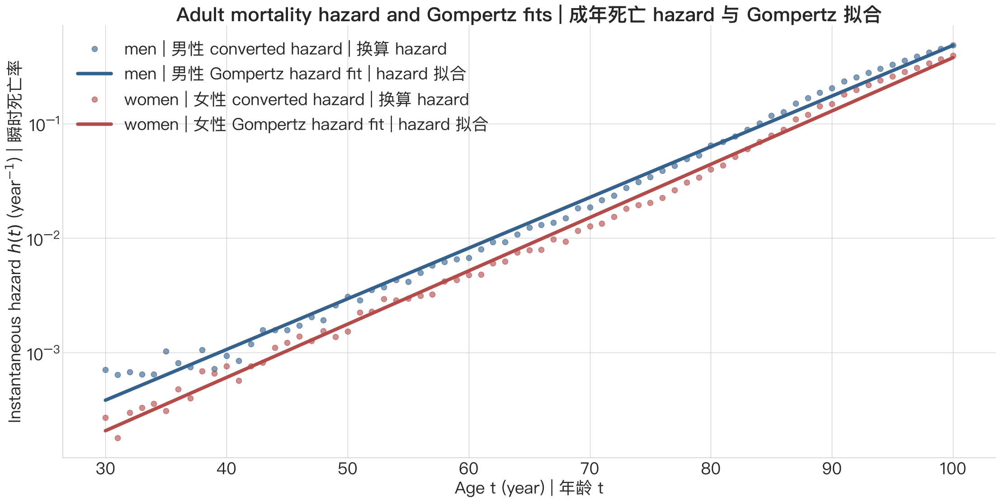

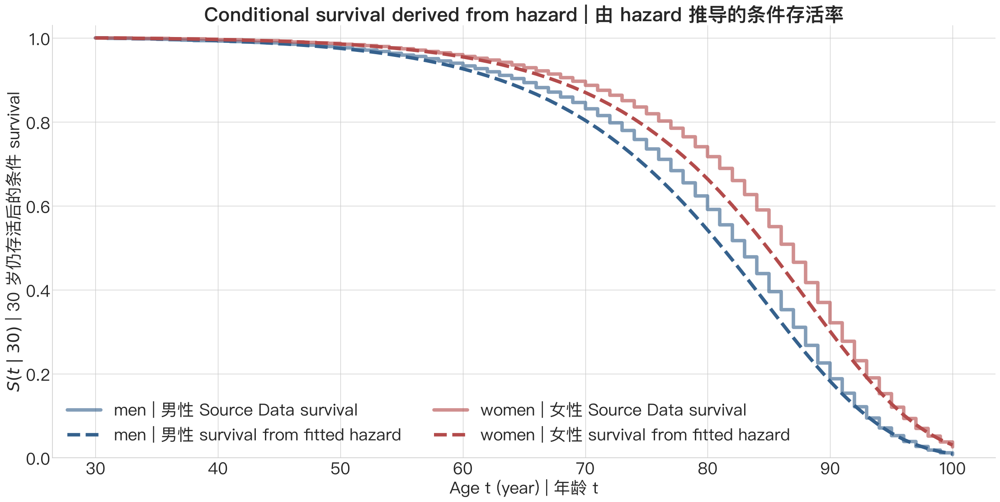


Mouse survival comparison | 小鼠生存率对照
 age_days  Paper Source Data survival | 论文数据生存率  threshold simulation survival | 阈值模拟生存率  simulation minus data | 模拟减数据
      300                                0.9844                                   1.0000                         0.0156
      500                                0.9375                                   0.9934                         0.0559
      700                                0.8906                                   0.8764                        -0.0142
      900                                0.4844                                   0.4028                        -0.0816
     1100                                0.0312                                   0.0310                        -0.0003
Survival-curve RMSE | 生存曲线 RMSE: 0.0321


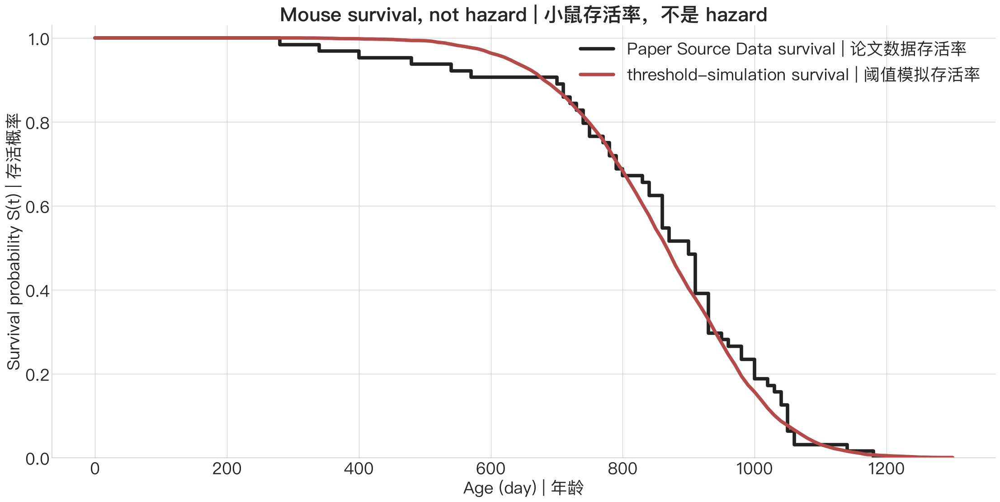

In [49]:
MOUSE_MORTALITY_SR = {
    "eta0": 0.0,
    "eta": 0.084,
    "beta": 0.15,
    "kappa": 0.50,
    "epsilon": 0.16,
    "threshold": 17.0,
}

parameter_roles = pd.DataFrame({
    "parameter set | 参数组": [
        "tutorial direct longitudinal fit | 教程纵向拟合",
        "paper longitudinal fit | 论文纵向拟合",
        "paper mouse mortality fit | 论文小鼠死亡率拟合",
    ],
    "used for | 用途": [
        "Figure 2 transition likelihood | Figure 2 转移似然",
        "published longitudinal comparison | 论文纵向结果对照",
        "Figure 4 threshold survival | Figure 4 阈值生存模拟",
    ],
    "shared | 是否共享": [False, False, False],
})
print("Parameter roles | 参数用途")
print(parameter_roles.to_string(index=False))

fig4 = source_cells["Figure4"]
mouse_death_days = np.array([
    fig4[f"B{row}"]
    for row in range(3, 117)
    if f"B{row}" in fig4
], dtype=float)
human_mortality = pd.DataFrame([
    {
        "age": float(fig4[f"E{row}"]),
        "risk_men_per_1000": float(fig4[f"F{row}"]),
        "risk_women_per_1000": float(fig4[f"G{row}"]),
        "survivors_men": float(fig4[f"H{row}"]),
        "survivors_women": float(fig4[f"I{row}"]),
    }
    for row in range(3, 117)
    if f"E{row}" in fig4
])
for group in ["men", "women"]:
    human_mortality[f"q_{group}"] = (
        human_mortality[f"risk_{group}_per_1000"]
        / 1000.0
    )
    if not human_mortality[f"q_{group}"].between(
        0,
        1,
        inclusive="left",
    ).all():
        raise ValueError(
            "Annual conditional mortality risks must lie in [0, 1). | "
            "年度条件死亡风险必须位于 [0, 1)。"
        )
    human_mortality[f"hazard_{group}"] = -np.log1p(
        -human_mortality[f"q_{group}"]
    )


def fit_gompertz_hazard(age, hazard):
    """
    Purpose: Fit Gompertz law to continuous-time mortality hazard.
    Parameters: Age in year and positive hazard in 1/year.
    Returns: Summary dictionary and fitted hazard at supplied ages.
    Units: gamma and hazard in 1/year; doubling time in year.
    Assumptions: Positive hazards and one log-linear adult-age interval.
    中文说明：对连续时间死亡 hazard 拟合 Gompertz 对数线性关系。
    """
    age = np.asarray(age, dtype=float)
    hazard = np.asarray(hazard, dtype=float)
    valid = (
        np.isfinite(age)
        & np.isfinite(hazard)
        & (hazard > 0)
    )
    valid_age = age[valid]
    valid_log_hazard = np.log(hazard[valid])
    gamma, intercept = np.polyfit(
        valid_age,
        valid_log_hazard,
        1,
    )
    fitted_log = intercept + gamma * valid_age
    residual_sum = np.sum(
        (valid_log_hazard - fitted_log) ** 2
    )
    total_sum = np.sum(
        (
            valid_log_hazard
            - valid_log_hazard.mean()
        ) ** 2
    )
    summary = {
        "n": int(valid.sum()),
        "age_min": float(valid_age.min()),
        "age_max": float(valid_age.max()),
        "log_h0_intercept": float(intercept),
        "gamma_per_year": float(gamma),
        "h0_per_year": float(np.exp(intercept)),
        "doubling_time_years": float(np.log(2) / gamma),
        "R2_log_hazard": float(
            1 - residual_sum / total_sum
        ),
    }
    fitted_all = np.exp(intercept + gamma * age)
    return summary, fitted_all


def gompertz_conditional_survival(
    age,
    start_age,
    h0,
    gamma,
):
    """
    Purpose: Integrate Gompertz hazard into conditional survival.
    Parameters: Ages, starting age, h0, and gamma.
    Returns: Survival conditional on being alive at start_age.
    Units: Ages in year, h0 and gamma in 1/year.
    Assumptions: Gompertz hazard applies throughout the interval.
    中文说明：将 Gompertz hazard 积分为给定起始年龄后的条件存活率。
    """
    age = np.asarray(age, dtype=float)
    cumulative_hazard = (
        h0
        / gamma
        * (
            np.exp(gamma * age)
            - np.exp(gamma * start_age)
        )
    )
    return np.exp(-cumulative_hazard)


def simulate_first_passage(
    params,
    n_paths=5000,
    max_days=1300,
    seed=17000,
):
    """
    Purpose: Simulate the first day each path crosses a mortality threshold.
    Parameters: Mortality SR parameters, paths, maximum day, and seed.
    Returns: One crossing day per path; infinity means no crossing.
    Units: Day.
    Assumptions: One-day Euler steps, reflection at zero, absorbing threshold.
    中文说明：模拟每条轨迹首次越过死亡阈值的日期。
    """
    rng = np.random.default_rng(seed)
    state = np.zeros(n_paths)
    crossing_day = np.full(n_paths, np.inf)
    alive = np.ones(n_paths, dtype=bool)
    for day in range(max_days):
        indices = np.flatnonzero(alive)
        if len(indices) == 0:
            break
        active_state = state[indices]
        active_state = (
            active_state
            + sr_drift(active_state, day, params)
            + np.sqrt(2 * params["epsilon"])
            * rng.normal(size=len(indices))
        )
        active_state = np.abs(active_state)
        state[indices] = active_state
        crossed = active_state > params["threshold"]
        crossing_day[indices[crossed]] = day + 1
        alive[indices[crossed]] = False
    return crossing_day


annual_risk_audit_rows = []
for group in ["men", "women"]:
    survivors = human_mortality[f"survivors_{group}"].to_numpy()
    source_risk = human_mortality[
        f"risk_{group}_per_1000"
    ].to_numpy()
    reconstructed = np.full(len(human_mortality), np.nan)
    valid_pair = (
        (survivors[:-1] > 0)
        & np.isfinite(survivors[:-1])
        & np.isfinite(survivors[1:])
    )
    valid_pair_indices = np.flatnonzero(valid_pair)
    reconstructed[valid_pair_indices] = (
        1000
        * (
            1
            - survivors[valid_pair_indices + 1]
            / survivors[valid_pair_indices]
        )
    )
    audit_mask = (
        human_mortality["age"].between(30, 100).to_numpy()
        & np.isfinite(reconstructed)
    )
    annual_risk_audit_rows.append({
        "group | 组别": group,
        "maximum absolute difference per 1000 | 每千人最大绝对差": float(
            np.max(
                np.abs(
                    source_risk[audit_mask]
                    - reconstructed[audit_mask]
                )
            )
        ),
    })
annual_risk_audit = pd.DataFrame(annual_risk_audit_rows)
print("\nAnnual risk reconstruction audit | 年度风险重建检查")
print(annual_risk_audit.round(6).to_string(index=False))
assert (
    annual_risk_audit[
        "maximum absolute difference per 1000 | 每千人最大绝对差"
    ].max()
    < 0.3
)

adult_mortality = human_mortality.query(
    "30 <= age <= 100"
).copy()
gompertz_summaries = []
gompertz_fitted = {}
for group in ["men", "women"]:
    summary, fitted = fit_gompertz_hazard(
        adult_mortality["age"],
        adult_mortality[f"hazard_{group}"],
    )
    summary["group | 组别"] = group
    gompertz_summaries.append(summary)
    gompertz_fitted[group] = fitted
gompertz_summary = pd.DataFrame(gompertz_summaries)[
    [
        "group | 组别",
        "n",
        "age_min",
        "age_max",
        "log_h0_intercept",
        "gamma_per_year",
        "h0_per_year",
        "doubling_time_years",
        "R2_log_hazard",
    ]
]
print("\nGompertz hazard fit results | Gompertz hazard 拟合结果")
print(gompertz_summary.round(6).to_string(index=False))

representative_ages = [40, 60, 80, 100]
gompertz_prediction_rows = []
for group in ["men", "women"]:
    summary = next(
        item
        for item in gompertz_summaries
        if item["group | 组别"] == group
    )
    for age in representative_ages:
        row = adult_mortality.loc[
            adult_mortality["age"] == age
        ].iloc[0]
        fitted_hazard = float(
            np.exp(
                summary["log_h0_intercept"]
                + summary["gamma_per_year"] * age
            )
        )
        gompertz_prediction_rows.append({
            "group | 组别": group,
            "age_years": age,
            "source risk per 1000 | 原始每千人风险": row[
                f"risk_{group}_per_1000"
            ],
            "annual q | 年度条件概率": row[f"q_{group}"],
            "converted hazard | 换算 hazard": row[
                f"hazard_{group}"
            ],
            "fitted hazard | 拟合 hazard": fitted_hazard,
        })
gompertz_predictions = pd.DataFrame(
    gompertz_prediction_rows
)
print("\nRisk, hazard, and fitted examples | 风险、hazard 与拟合示例")
print(gompertz_predictions.round(6).to_string(index=False))

conditional_survival_start_age = 30.0
human_survival_rows = []
for group in ["men", "women"]:
    summary = next(
        item
        for item in gompertz_summaries
        if item["group | 组别"] == group
    )
    source_survivors = adult_mortality[
        f"survivors_{group}"
    ].to_numpy()
    source_conditional_survival = (
        source_survivors / source_survivors[0]
    )
    fitted_conditional_survival = (
        gompertz_conditional_survival(
            adult_mortality["age"],
            conditional_survival_start_age,
            summary["h0_per_year"],
            summary["gamma_per_year"],
        )
    )
    assert np.all(
        np.diff(fitted_conditional_survival) <= 1e-12
    )
    assert np.all(
        (fitted_conditional_survival >= 0)
        & (fitted_conditional_survival <= 1)
    )
    human_survival_rows.append({
        "group": group,
        "source": source_conditional_survival,
        "fitted": fitted_conditional_survival,
    })

group_colors = {
    "men": "#35618D",
    "women": "#B34B4B",
}
group_labels = {
    "men": "men | 男性",
    "women": "women | 女性",
}

fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
for group in ["men", "women"]:
    ax.semilogy(
        adult_mortality["age"],
        adult_mortality[f"hazard_{group}"],
        "o",
        ms=8,
        alpha=0.62,
        color=group_colors[group],
        label=f"{group_labels[group]} converted hazard | 换算 hazard",
    )
    ax.semilogy(
        adult_mortality["age"],
        gompertz_fitted[group],
        lw=5,
        color=group_colors[group],
        label=f"{group_labels[group]} Gompertz hazard fit | hazard 拟合",
    )
ax.set(
    title="Adult mortality hazard and Gompertz fits | 成年死亡 hazard 与 Gompertz 拟合",
    xlabel="Age t (year) | 年龄 t",
    ylabel=r"Instantaneous hazard $h(t)$ (year$^{-1}$) | 瞬时死亡率",
)
ax.legend(frameon=False)
plt.show()

fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
for item in human_survival_rows:
    group = item["group"]
    ax.step(
        adult_mortality["age"],
        item["source"],
        where="post",
        color=group_colors[group],
        lw=5,
        alpha=0.62,
        label=f"{group_labels[group]} Source Data survival",
    )
    ax.plot(
        adult_mortality["age"],
        item["fitted"],
        color=group_colors[group],
        ls="--",
        lw=5,
        label=f"{group_labels[group]} survival from fitted hazard",
    )
ax.set(
    title="Conditional survival derived from hazard | 由 hazard 推导的条件存活率",
    xlabel="Age t (year) | 年龄 t",
    ylabel=r"$S(t\mid30)$ | 30 岁仍存活后的条件 survival",
    ylim=(0, 1.03),
)
ax.legend(frameon=False, ncol=2)
plt.show()

simulated_death_days = simulate_first_passage(
    MOUSE_MORTALITY_SR
)
survival_days = np.arange(0, 1301, 10)
observed_survival = np.array([
    (mouse_death_days > day).mean()
    for day in survival_days
])
simulated_survival = np.array([
    (simulated_death_days > day).mean()
    for day in survival_days
])
survival_rmse = float(
    np.sqrt(
        np.mean(
            (observed_survival - simulated_survival) ** 2
        )
    )
)
selected_survival_days = [300, 500, 700, 900, 1100]
survival_comparison = pd.DataFrame({
    "age_days": selected_survival_days,
    "Paper Source Data survival | 论文数据生存率": [
        observed_survival[
            np.where(survival_days == day)[0][0]
        ]
        for day in selected_survival_days
    ],
    "threshold simulation survival | 阈值模拟生存率": [
        simulated_survival[
            np.where(survival_days == day)[0][0]
        ]
        for day in selected_survival_days
    ],
})
survival_comparison[
    "simulation minus data | 模拟减数据"
] = (
    survival_comparison[
        "threshold simulation survival | 阈值模拟生存率"
    ]
    - survival_comparison[
        "Paper Source Data survival | 论文数据生存率"
    ]
)
print("\nMouse survival comparison | 小鼠生存率对照")
print(survival_comparison.round(4).to_string(index=False))
print(
    "Survival-curve RMSE | 生存曲线 RMSE:",
    f"{survival_rmse:.4f}",
)

fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
ax.step(
    survival_days,
    observed_survival,
    where="post",
    color="#222222",
    lw=5,
    label="Paper Source Data survival | 论文数据存活率",
)
ax.plot(
    survival_days,
    simulated_survival,
    color="#B34B4B",
    lw=5,
    label="threshold-simulation survival | 阈值模拟存活率",
)
ax.set(
    title="Mouse survival, not hazard | 小鼠存活率，不是 hazard",
    xlabel="Age (day) | 年龄",
    ylabel="Survival probability S(t) | 存活概率",
    ylim=(0, 1.03),
)
ax.legend(frameon=False)
plt.show()


### How the SR threshold hypothesis could produce a Gompertz form
### SR 阈值假设如何产生 Gompertz 形式

The empirical fit above establishes a pattern in mortality
data. The SR argument then adds a separate hypothesis: death occurs when
$X$ first crosses a critical threshold $X_C$.

上面的经验拟合先确认死亡率数据中的模式。SR 解释随后增加一个
独立假设：当 $X$ 第一次越过临界阈值 $X_C$ 时发生死亡。

$$
\Delta U(t)=U(X_C,t)-U(X^*(t),t),
\qquad
h_{\mathrm{cross}}(t)\propto\exp\left[-\frac{\Delta U(t)}{\epsilon}\right].
$$

If the barrier decreases approximately linearly,
$\Delta U(t)\approx\Delta U_0-ct$, then

如果势垒随年龄近似线性下降，
$\Delta U(t)\approx\Delta U_0-ct$，则

$$
h_{\mathrm{cross}}(t)
\propto
e^{-\Delta U_0/\epsilon}e^{(c/\epsilon)t},
$$

Here $h_{\mathrm{cross}}(t)$ is an approximate first-crossing hazard, not survival or cumulative death probability. Under this interpretation the expression has the Gompertz form with
$\gamma\approx c/\epsilon$. This is a conditional mechanistic
interpretation. Figure 2 does not directly observe a death threshold,
and the mortality parameters are not the longitudinal fit.

这里的 $h_{\mathrm{cross}}(t)$ 是近似首次穿越 hazard，不是 survival 或累计死亡概率。在这一解释下，该式具有 Gompertz 形式，并给出
$\gamma\approx c/\epsilon$。这是一种有条件的机制解释。Figure 2
并未直接观测死亡阈值，死亡率参数也不是纵向拟合参数。


### Micro-lab 12. Change age and threshold, then compare barriers
### 微实验 12：修改年龄与阈值并比较势垒

**Goal.** Turn the potential landscape into a relative first-crossing
calculation.

**目标。** 把势函数地形转换为相对首次穿越 hazard 计算。

**Model used.** This lab uses the SR equation with the paper's separate
`MOUSE_MORTALITY_SR` parameter set: $\eta_0=0$, $\eta=0.084$,
$\beta=0.15$, $\kappa=0.50$, $\epsilon=0.16$. It does not use
`TUTORIAL_SR`.

**使用模型。** 本实验使用 SR 方程和论文单独的
`MOUSE_MORTALITY_SR` 参数：$\eta_0=0$、$\eta=0.084$、
$\beta=0.15$、$\kappa=0.50$、$\epsilon=0.16$，不使用
`TUTORIAL_SR`。

**Predict first.** Which selected age will have the smaller barrier and
therefore the larger relative crossing-hazard proxy?

**先预测。** 哪个年龄的势垒更小、相对穿越 hazard 近似更大？

**Editable variables.** Change the younger age, older age, threshold,
and prediction.

**可编辑变量。** 修改较年轻年龄、较老年龄、阈值和预测。

**Reading the figure.** The left panel shows the potential barrier.
The right panel shows $\exp(-\Delta U/\epsilon)$ relative to the
younger age.

**阅读图片。** 左图显示势垒，右图显示相对于较年轻年龄的
$\exp(-\Delta U/\epsilon)$。

**Limit.** This relative crossing-hazard proxy is not survival, cumulative death probability, or an absolute probability of death. It
depends on the added threshold and separate mortality parameters.

**局限。** 该相对穿越 hazard 近似不是 survival、累计死亡概率或绝对死亡概率，结果依赖额外阈值和单独死亡率参数。


Model | 模型: SR equation with paper mouse-mortality parameters
Parameter object | 参数对象: MOUSE_MORTALITY_SR
eta0          0.000
eta           0.084
beta          0.150
kappa         0.500
epsilon       0.160
threshold    17.000


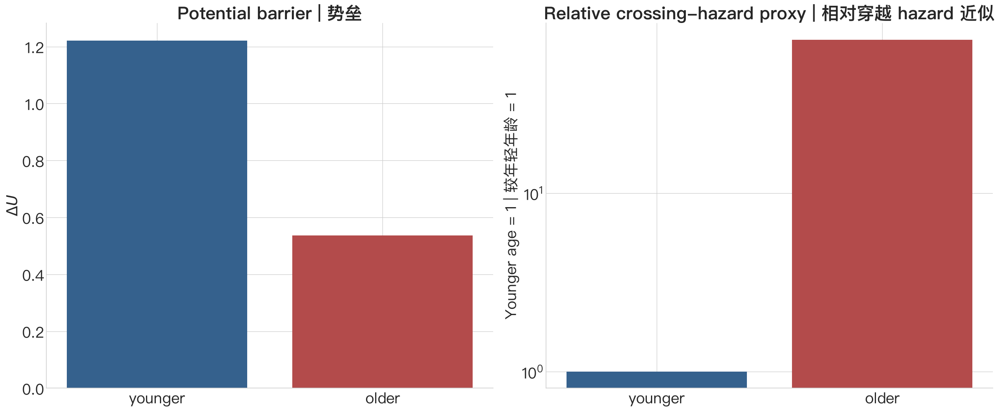

age_label | 年龄组  age_years  local_balance  U_at_threshold  U_at_balance  barrier  log_crossing_hazard_proxy  relative_crossing_hazard_proxy
        younger       0.75        0.36207         1.26433       0.04263  1.22170                   -7.63565                         1.00000
          older       1.25        1.16667         0.55033       0.01419  0.53615                   -3.35092                        72.58285
Self-check | 自检: prediction matches | 预测正确


In [50]:
# EDIT HERE | 只修改这里
PRACTICE_12_YOUNGER_AGE_YEARS = 0.75
PRACTICE_12_OLDER_AGE_YEARS = 1.25
PRACTICE_12_THRESHOLD = 17.0
PRACTICE_12_PREDICTION = "older"

if (
    PRACTICE_12_YOUNGER_AGE_YEARS < 0
    or PRACTICE_12_OLDER_AGE_YEARS
    <= PRACTICE_12_YOUNGER_AGE_YEARS
    or PRACTICE_12_THRESHOLD <= 0
):
    raise ValueError(
        "Use ordered non-negative ages and a positive threshold. | "
        "年龄必须非负且 older 大于 younger，阈值必须为正。"
    )
if PRACTICE_12_PREDICTION not in {"younger", "older"}:
    raise ValueError(
        "Choose younger or older. | 请选择 younger 或 older。"
    )

print(
    "Model | 模型: SR equation with paper mouse-mortality parameters\n"
    "Parameter object | 参数对象: MOUSE_MORTALITY_SR"
)
print(
    pd.Series(
        MOUSE_MORTALITY_SR,
        name="value | 数值",
    ).to_string()
)

practice_12_rows = []
for age_label, age_years in [
    ("younger", PRACTICE_12_YOUNGER_AGE_YEARS),
    ("older", PRACTICE_12_OLDER_AGE_YEARS),
]:
    local_balance = float(
        quasi_steady_state(
            age_years,
            MOUSE_MORTALITY_SR,
        )
    )
    if (
        not np.isfinite(local_balance)
        or PRACTICE_12_THRESHOLD <= local_balance
    ):
        raise ValueError(
            "Use ages below capacity and a threshold above both balances. | "
            "年龄应低于容量年龄，阈值应高于两个平衡值。"
        )
    potential_at_threshold = float(
        sr_potential(
            PRACTICE_12_THRESHOLD,
            age_years,
            MOUSE_MORTALITY_SR,
        )
    )
    potential_at_balance = float(
        sr_potential(
            local_balance,
            age_years,
            MOUSE_MORTALITY_SR,
        )
    )
    barrier = potential_at_threshold - potential_at_balance
    log_crossing_hazard_proxy = (
        -barrier / MOUSE_MORTALITY_SR["epsilon"]
    )
    practice_12_rows.append({
        "age_label | 年龄组": age_label,
        "age_years": age_years,
        "local_balance": local_balance,
        "U_at_threshold": potential_at_threshold,
        "U_at_balance": potential_at_balance,
        "barrier": barrier,
        "log_crossing_hazard_proxy": log_crossing_hazard_proxy,
    })
practice_12_results = pd.DataFrame(practice_12_rows)
younger_log_rate = practice_12_results.loc[
    practice_12_results["age_label | 年龄组"] == "younger",
    "log_crossing_hazard_proxy",
].iloc[0]
practice_12_results["relative_crossing_hazard_proxy"] = np.exp(
    np.clip(
        practice_12_results["log_crossing_hazard_proxy"] - younger_log_rate,
        -700,
        700,
    )
)
practice_12_winner = str(
    practice_12_results.sort_values(
        "relative_crossing_hazard_proxy",
        ascending=False,
    ).iloc[0]["age_label | 年龄组"]
)

fig, axes = plt.subplots(
    1,
    2,
    figsize=(22, 9),
    layout="constrained",
)
colors = ["#35618D", "#B34B4B"]
axes[0].bar(
    practice_12_results["age_label | 年龄组"],
    practice_12_results["barrier"],
    color=colors,
)
axes[0].set(
    title="Potential barrier | 势垒",
    ylabel=r"$\Delta U$",
)
axes[1].bar(
    practice_12_results["age_label | 年龄组"],
    practice_12_results["relative_crossing_hazard_proxy"],
    color=colors,
)
axes[1].set_yscale("log")
axes[1].set(
    title="Relative crossing-hazard proxy | 相对穿越 hazard 近似",
    ylabel="Younger age = 1 | 较年轻年龄 = 1",
)
plt.show()
print(practice_12_results.round(5).to_string(index=False))
print(
    "Self-check | 自检:",
    "prediction matches | 预测正确"
    if PRACTICE_12_PREDICTION == practice_12_winner
    else (
        f"Review: {practice_12_winner} has the larger crossing-hazard proxy. | "
        f"请复查：{practice_12_winner} 的相对穿越 hazard 近似更大。"
    ),
)


## 21. What is supported and what remains conditional?
## 21. 哪些得到支持，哪些仍依赖条件？

**Supported within this analysis.**

- The formal common-resolution score and the paper both place `C1001`
  first among the 16 tested circuits.
- Saturating removal is shared by the leading audited circuits.
- Independent bleomycin data qualitatively support slower clearance in old
  mice.
- The focal mechanism connects increasing load with finite removal
  capacity, weaker restoration, wider local variation, and slower recovery.

**本分析支持。**

- 正式统一分辨率评分与论文都把 `C1001` 排在 16 个候选模型的第一位。
- 数值审计中的前列模型共同包含饱和清除。
- 独立 bleomycin 数据在定性上支持老年小鼠清除更慢。
- 重点机制把负荷上升与有限清除容量、恢复变弱、局部波动变宽和恢复变慢
  联系起来。

**Conditional or method-dependent.**

- The audit does not always distinguish age-increasing production from
  age-decreasing removal.
- Exact parameters and BIC depend on the numerical likelihood, search
  budget, seed, and final-score resolution.
- Local variance and relaxation formulas assume small deviations near a
  moving balance.
- Gompertz-like mortality additionally requires a meaningful threshold and
  a separate mortality parameter set.

**依赖条件或计算方法。**

- 数值审计并不能在所有设置下明确区分“产生随年龄增加”和“清除随年龄下降”。
- 精确参数与 BIC 依赖数值似然、搜索预算、seed 和最终评分分辨率。
- 局部方差与松弛时间公式假定系统位于移动平衡附近且偏离较小。
- 类 Gompertz 死亡率还需要有意义的阈值和单独的死亡率参数。

**Take-home chain | 主线总结**

$$
\text{official longitudinal data}
\rightarrow294\text{ conditional terms}
\rightarrow16\text{ fitted circuits}
\rightarrow\text{absolute BIC and audits}
\rightarrow\text{saturating-removal top set}
\rightarrow\text{focal C1001}
\rightarrow\text{slower recovery near capacity}.
$$

**English.** Saturating removal is the comparatively stable mechanistic
signal. The exact age-dependent mechanism, parameter values, and downstream
quantitative predictions remain method-dependent.

**中文。** 相对稳定的机制信号是饱和清除；具体年龄机制、参数数值和下游定量
预测仍依赖计算方法。


# Appendices
# 附录

The appendices explain where BIC comes from, run two numerical projects,
and turn unresolved assumptions into explicit research questions.

附录解释 BIC 的来源，默认运行两个数值项目，并把尚未解决的假设转化为明确的
研究问题。


## Appendix A. Where does BIC come from?
## 附录 A：BIC 从哪里来？

BIC is also called the **Schwarz criterion**, after
[Schwarz (1978)](https://doi.org/10.1214/aos/1176344136). It is not an
arbitrary score assembled by intuition. In Bayesian model comparison,
one would ideally integrate likelihood over parameter uncertainty to
obtain model evidence. Under regular large-sample conditions, a
mathematical approximation gives

$$
\text{integrate likelihood over parameter uncertainty}
\longrightarrow
\text{large-sample approximation}
\longrightarrow
-2\log\hat L+k\log n.
$$

BIC 也称 **Schwarz criterion**。在 Bayesian 模型比较中，理想做法是对
参数不确定性积分，得到 model evidence；在规则的大样本条件下，这个积分
可以近似为

$$
\mathrm{BIC}=-2\log\hat L+k\log n.
$$

A full derivation uses a Laplace approximation and is beyond the
algebra needed here. The useful intuition is the two-part cost:

- $-2\log\hat L$: **fit cost**. Higher LL makes this smaller.
- $k\log n$: **complexity penalty**. More free parameters make this
  larger; at $n=294$, each extra parameter adds about 5.68.

完整推导需要 Laplace approximation，本教程不展开积分细节。低年级学生只需
抓住两个组成部分：LL 越高，拟合代价越小；自由参数越多，复杂度惩罚越大。

Because both pieces are costs, lower BIC is better. BIC is not a
probability, a percentage, or an absolute goodness-of-fit standard.
Comparisons are meaningful only for models fitted to the same data with
the same likelihood definition.

两项都是代价，因此 BIC 越小越好。BIC 不是概率、百分比或绝对拟合优度；
只有在相同数据和相同 likelihood 定义下比较才有意义。


**Function card | 函数说明卡**

`bic_components(log_likelihood, parameter_count, sample_size)` returns
fit cost, complexity penalty, and their sum.

`bic_components(...)` 返回拟合代价、复杂度惩罚和二者之和。

Example | 调用示例：`bic_components(-475, 5, 294)`


In [51]:
def bic_components(
    log_likelihood: float,
    parameter_count: int,
    sample_size: int,
) -> dict[str, float]:
    '''
    Purpose: Decompose the Schwarz BIC into fit and complexity costs.
    Parameters: Log-likelihood, nominal free-parameter count, and sample size.
    Returns: fit_cost, complexity_penalty, and BIC in one dictionary.
    Units: Dimensionless.
    Assumptions: Same data and likelihood; positive n; non-negative integer k.
    中文说明：把 BIC 分解为拟合代价、复杂度惩罚及其总和。
    '''
    if not np.isfinite(log_likelihood):
        raise ValueError("Log-likelihood must be finite. LL 必须是有限数。")
    if (
        not isinstance(parameter_count, (int, np.integer))
        or parameter_count < 0
    ):
        raise ValueError("Parameter count must be a non-negative integer. 参数数必须是非负整数。")
    if (
        not isinstance(sample_size, (int, np.integer))
        or sample_size <= 0
    ):
        raise ValueError("Sample size must be a positive integer. 样本量必须是正整数。")
    fit_cost = -2.0 * float(log_likelihood)
    complexity_penalty = int(parameter_count) * np.log(int(sample_size))
    return {
        "fit_cost": fit_cost,
        "complexity_penalty": complexity_penalty,
        "BIC": fit_cost + complexity_penalty,
    }


paper_c1001_nominal = bic_components(-475.0, 5, 294)
hypothetical_fixed_eta0 = bic_components(-475.0, 4, 294)
bic_example = pd.DataFrame([
    {
        "interpretation": "Paper C1001, eta0 free before fitting | 论文 C1001",
        "k": 5,
        **paper_c1001_nominal,
    },
    {
        "interpretation": "Different model with eta0 fixed before fitting | 拟合前固定 eta0",
        "k": 4,
        **hypothetical_fixed_eta0,
    },
])
print(bic_example.round(3).to_string(index=False))
assert np.isclose(
    paper_c1001_nominal["fit_cost"]
    + paper_c1001_nominal["complexity_penalty"],
    paper_c1001_nominal["BIC"],
)


                                             interpretation  k  fit_cost  complexity_penalty     BIC
           Paper C1001, eta0 free before fitting | 论文 C1001  5     950.0              28.418 978.418
Different model with eta0 fixed before fitting | 拟合前固定 eta0  4     950.0              22.734 972.734


For the paper's displayed `C1001` values,

$$
-2(-475)+5\log(294)\approx978.4.
$$

The supplementary table reports 978 because the displayed LL is rounded;
recomputing from a rounded LL can differ from the reported BIC by less
than about one unit.

论文表中显示的 `C1001` 数值给出约 978.4，而表内 BIC 为 978。原因是显示的
LL 已舍入，用舍入值复算可能与正式 BIC 相差不到约一个单位。

Using $k=4$ does **not** mean another BIC formula. It describes a
different model in which $\eta_0$ was fixed before fitting. The
paper-style circuit allowed $\eta_0$ to vary and found a boundary
estimate, so nominal $k=5$ is the main comparison.

使用 $k=4$ 不是“另一种 BIC 公式”，而是另一个在拟合前就固定
$\eta_0=0$ 的模型。论文口径允许 $\eta_0$ 自由变化，只是最优值落在
边界，因此主比较使用 nominal $k=5$。

### Numerical provenance | 数值来源追踪

| quantity | tutorial source | paper source |
|---|---|---|
| $\log\hat L$ | sum of Monte Carlo log-density over 294 terms | Mathematica stochastic-simulation likelihood |
| $k$ | circuit nominal free-parameter count | Supplementary Table 1 `#Params` |
| $n$ | 294 adjacent conditional terms | Methods: 294 sub-trajectories |
| BIC | calculated live in the notebook | Supplementary Table 1 reported value |

### Assumptions and limits | 假设与局限

BIC is a large-sample approximation for parametric models. Its textbook
justification assumes regular identifiable parameters and independent
information units. Here some estimates lie on boundaries, LL is
estimated by Monte Carlo, and 294 conditional terms come from only
33 mice, so they are not equivalent to 294 independent animals.
BIC remains a useful common comparison rule, but these departures should
temper precise numerical interpretation.

BIC 是参数模型的大样本近似，经典条件包括规则、可识别参数和独立信息单元。
本教程存在边界参数、Monte Carlo LL，且 294 条条件项来自 33 只小鼠，并不
等于 294 只独立动物。因此 BIC 仍可作为统一比较规则，但不应过度解释很小的
数值差异。


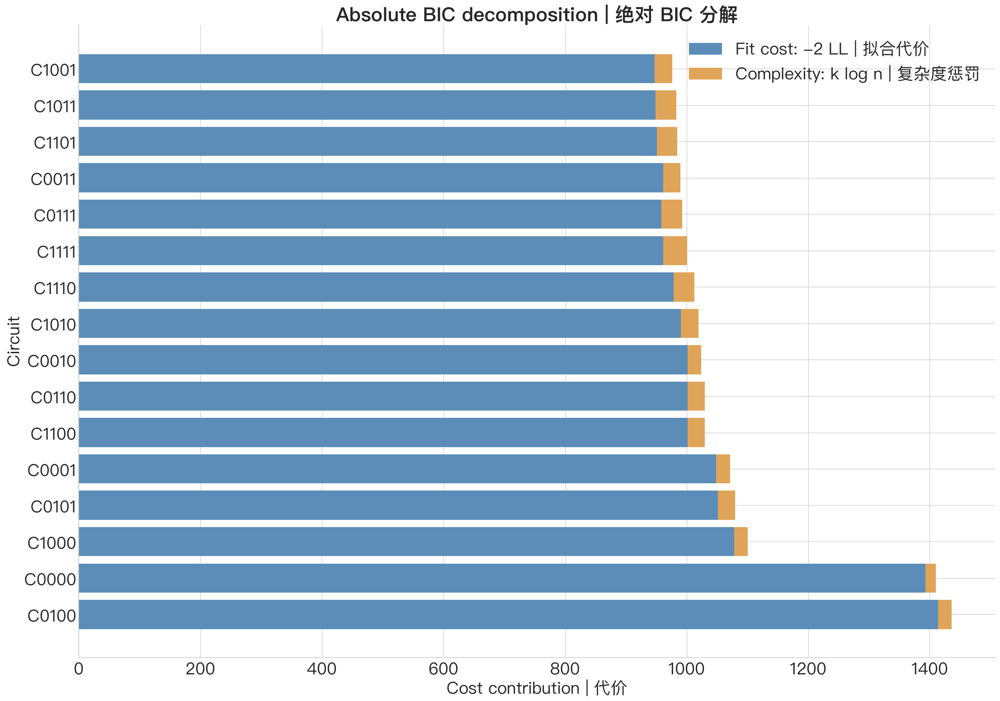

,circuit,final_log_likelihood,nominal_k,BIC,fit_cost,complexity_penalty
0,C1001,-473.901,5,976.219,947.801,28.418
1,C1011,-474.415,6,982.931,948.830,34.101
2,C1101,-475.456,6,985.013,950.911,34.101
3,C0011,-480.764,5,989.945,961.527,28.418
4,C0111,-479.347,6,992.796,958.695,34.101
5,C1111,-480.762,7,1001.310,961.525,39.785
6,C1110,-489.393,6,1012.888,978.786,34.101
7,C1010,-495.453,5,1019.323,990.905,28.418
8,C0010,-500.705,4,1024.145,1001.411,22.734
9,C0110,-500.834,5,1030.086,1001.668,28.418


In [52]:
bic_decomposition = simulation_fits[
    ["circuit", "final_log_likelihood", "nominal_k", "BIC"]
].copy()
bic_decomposition["fit_cost"] = -2 * bic_decomposition["final_log_likelihood"]
bic_decomposition["complexity_penalty"] = (
    bic_decomposition["nominal_k"] * np.log(len(transitions))
)
assert np.allclose(
    bic_decomposition["fit_cost"] + bic_decomposition["complexity_penalty"],
    bic_decomposition["BIC"],
)
bic_decomposition = bic_decomposition.sort_values("BIC", ascending=False)

fig, ax = plt.subplots(figsize=(20, 14), layout="constrained")
ax.barh(
    bic_decomposition["circuit"],
    bic_decomposition["fit_cost"],
    color="#5B8DB8",
    label="Fit cost: -2 LL | 拟合代价",
)
ax.barh(
    bic_decomposition["circuit"],
    bic_decomposition["complexity_penalty"],
    left=bic_decomposition["fit_cost"],
    color="#E0A458",
    label="Complexity: k log n | 复杂度惩罚",
)
ax.set(
    title="Absolute BIC decomposition | 绝对 BIC 分解",
    xlabel="Cost contribution | 代价",
    ylabel="Circuit",
)
ax.legend(frameon=False)
plt.show()
bic_decomposition.sort_values("BIC").round(3)


## Appendix B. Numerical resolution project and refit utility
## 附录 B：数值分辨率项目与重拟合工具

**English.** The resolution project runs by default because it reuses
fitted vectors and is much cheaper than repeating the entire
optimization. It asks whether final-score path count and time step
change the ranking.

**中文。** 分辨率项目默认运行，因为它复用已拟合参数，比重复完整优化便宜
得多。它检查最终评分的路径数和时间步长是否会改变模型排名。

**English.** A separate cold-refit function is defined afterward for
students who want to repeat the full search deliberately.

**中文。** 后面还定义了冷启动完整重拟合函数，供希望主动重复全部搜索的
学生使用。


### Project 1. Does final-score resolution change the ranking?
### 项目 1：最终评分分辨率会改变排名吗？

**Motivation | 动机.** Monte Carlo LL is an estimate. More paths reduce
sampling noise; a smaller time step reduces discretization error.

**Procedure | 步骤.**

1. Keep the top four fitted parameter vectors fixed.
2. Re-score them at three path-step combinations.
3. Compare absolute BIC and rank.

**Expected output | 预期输出.** A table and line plot showing whether
ordering stabilizes as resolution increases.

**Possible results | 可能结果.** Stable order supports the mechanism
ranking. Switching order identifies sensitivity that should be reported,
especially when BIC values are close.

**Boundary | 边界.** This isolates final-score resolution. It does not
test whether the optimizer would find different parameters at each
resolution.

本项目固定前四名参数，只改变路径数和步长，因此只审计最终评分，不审计
参数搜索本身。


    BIC circuit  dt_days  log_likelihood  nominal_k  paths               resolution  rank
 988.52   C1001      2.0         -480.05          5   1000  1,000 paths; 2-day step   1.0
 995.01   C1011      2.0         -480.45          6   1000  1,000 paths; 2-day step   2.0
1002.79   C0011      2.0         -487.18          5   1000  1,000 paths; 2-day step   3.0
1007.44   C1101      2.0         -486.67          6   1000  1,000 paths; 2-day step   4.0
 981.11   C1001      1.0         -476.35          5   4000  4,000 paths; 1-day step   1.0
 987.45   C1101      1.0         -476.67          6   4000  4,000 paths; 1-day step   2.0
 988.42   C1011      1.0         -477.16          6   4000  4,000 paths; 1-day step   3.0
 993.09   C0011      1.0         -482.33          5   4000  4,000 paths; 1-day step   4.0
 986.69   C1101      1.0         -476.29          6  12000 12,000 paths; 1-day step   1.0
 988.62   C0011      1.0         -480.10          5  12000 12,000 paths; 1-day step   2.0
 989.46   

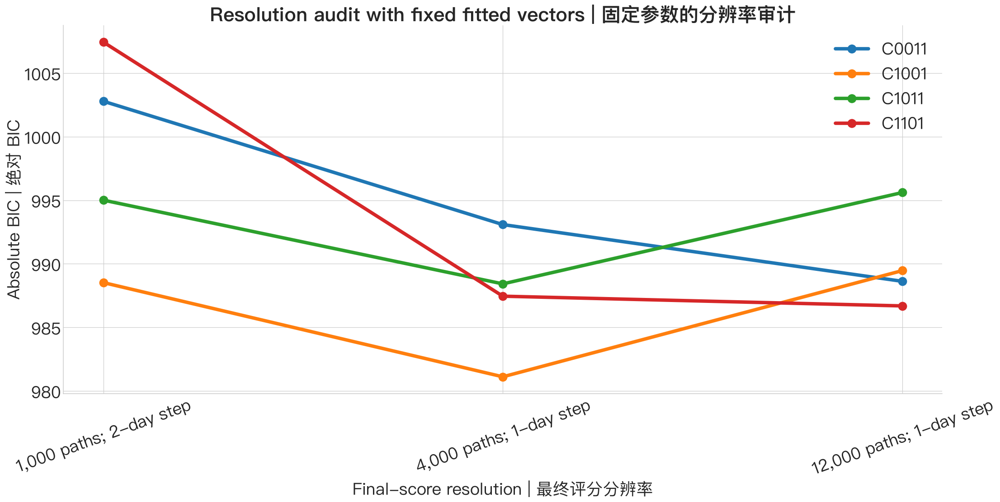

In [53]:
project_one_grid = [
    ("1,000 paths; 2-day step", 1000, 2.0),
    ("4,000 paths; 1-day step", 4000, 1.0),
    ("12,000 paths; 1-day step", 12000, 1.0),
]
project_one_top = simulation_fits.nsmallest(4, "BIC")
project_one_signature = cache_signature(
    "resolution-project",
    {
        "grid": project_one_grid,
        "fits": {
            row.circuit: row.params
            for row in project_one_top.itertuples()
        },
    },
)
project_one_path = CACHE_DIR / f"formal_resolution_project_{project_one_signature}.json"
project_one_records = load_json_cache(
    project_one_path,
    project_one_signature,
)
if project_one_records is None:
    project_one_records = []
    for label, n_paths, dt_days in project_one_grid:
        for row in project_one_top.itertuples(index=False):
            ll = monte_carlo_log_likelihood(
                transitions,
                row.params,
                n_paths=n_paths,
                dt_days=dt_days,
                seed=19100,
            )
            project_one_records.append({
                "resolution": label,
                "circuit": row.circuit,
                "paths": n_paths,
                "dt_days": dt_days,
                "log_likelihood": float(ll),
                "nominal_k": int(row.nominal_k),
                "BIC": float(
                    -2 * ll + row.nominal_k * np.log(len(transitions))
                ),
            })
    save_json_cache(
        project_one_path,
        project_one_signature,
        project_one_records,
    )

project_one = pd.DataFrame(project_one_records)
project_one["rank"] = project_one.groupby("resolution")["BIC"].rank(
    method="min"
)
print(project_one.sort_values(["paths", "BIC"]).round(2).to_string(index=False))

fig, ax = plt.subplots(figsize=(20, 10), layout="constrained")
resolution_order = [item[0] for item in project_one_grid]
for circuit, frame in project_one.groupby("circuit"):
    frame = frame.set_index("resolution").loc[resolution_order]
    ax.plot(
        resolution_order,
        frame["BIC"],
        marker="o",
        ms=12,
        lw=5,
        label=circuit,
    )
ax.set(
    title="Resolution audit with fixed fitted vectors | 固定参数的分辨率审计",
    xlabel="Final-score resolution | 最终评分分辨率",
    ylabel="Absolute BIC | 绝对 BIC",
)
ax.tick_params(axis="x", rotation=20)
ax.legend(frameon=False)
plt.show()


### Optional cold refit function
### 可选的冷启动重新拟合函数

`refit_all_circuits(seed)` genuinely repeats Sobol design, Powell
optimization, boundary checks, and final scoring for all 16 circuits.
It is defined but **not called automatically**. A cold run is expected
to take roughly 15–20 minutes on the reference machine; repeated calls
with identical inputs can use signed caches.

`refit_all_circuits(seed)` 会真正重复 16 个模型的 Sobol、Powell、边界检查
与最终评分。函数只定义、不自动调用。参考机器冷运行约需 15–20 分钟；
完全相同的再次调用可以读取带指纹缓存。


In [54]:
def refit_all_circuits(seed: int) -> pd.DataFrame:
    '''
    Purpose: Repeat full three-stage optimization for every circuit.
    Parameters: A non-negative integer offset controlling all search seeds.
    Returns: A 16-row table with new fitted parameters, LL, nominal-k BIC, and rank.
    Units: Parameters follow model units; LL and BIC are dimensionless.
    Assumptions: Formal search budget; cold runtime is about 15-20 minutes.
    中文说明：用新的随机种子完整重拟合 16 个 circuit；本函数不会自动调用。
    '''
    if not isinstance(seed, (int, np.integer)) or seed < 0:
        raise ValueError("Seed must be a non-negative integer. Seed 必须是非负整数。")
    warnings.warn(
        "Cold refit may take about 15-20 minutes. "
        "冷启动完整重拟合预计约需 15-20 分钟。",
        RuntimeWarning,
    )
    records = [
        fit_circuit_direct(
            row,
            transitions,
            seed_offset=int(seed),
        )
        for row in candidate_models.itertuples(index=False)
    ]
    result = pd.DataFrame(records)
    result["BIC"] = (
        -2 * result["final_log_likelihood"]
        + result["nominal_k"] * np.log(len(transitions))
    )
    result = result.sort_values("BIC").reset_index(drop=True)
    result["rank"] = np.arange(1, len(result) + 1)
    return result


print(
    "Function ready but not called | 函数已定义但未自动调用:",
    "refit_all_circuits(seed)",
)


Function ready but not called | 函数已定义但未自动调用: refit_all_circuits(seed)


## Appendix C. Open research questions
## 附录 C：开放研究问题

### 1. Would the 300-transition likelihood change model selection?
### 1. 使用 300 条长间隔似然会改变模型选择吗？

**Motivation.** Six observed endpoints after missing visits are excluded
from the adjacent-term likelihood but can be used by modeling longer
intervals.

**动机。** 相邻访视似然排除了缺失点之后的六个观测终点；若显式模拟更长
时间间隔，这些终点仍有可能贡献信息。

**Procedure.** Replace `transitions` with
`nearest_observed_transitions`, refit all 16 circuits, calculate absolute
BIC with $n=300$, and inspect the six long-gap terms separately.

**步骤。** 使用 `nearest_observed_transitions` 重新拟合 16 个模型，以
$n=300$ 计算绝对 BIC，并单独检查六条跨缺失点的长间隔转移。

**Expected output.** New parameter vectors, LL, BIC, ranks, and endpoint
diagnostics for the six long intervals.

**预期输出。** 新参数向量、LL、BIC、排名以及六条长间隔的终点诊断。

**Interpretation boundary.** A changed ranking may reflect recovered
information, different interval lengths, or model error during the
unobserved period. It does not automatically prove that bridging is better.

**解释边界。** 排名变化可能来自恢复的信息、不同时间长度或未观测期间的模型
误差，不能自动证明跨缺失点连接一定更合理。

### 2. Can between-mouse heterogeneity imitate slow within-mouse recovery?
### 2. 鼠间异质性会不会被误认为鼠内恢复变慢？

**Research question.** If mice have stable individual production or removal
rates, can a homogeneous model incorrectly attribute the wide population
spread and slow group-average return to weak restoration within each mouse?

**研究问题。** 如果不同小鼠长期具有不同的产生率或清除率，均质模型是否会把
较宽的群体分布和较慢的群体平均回落，错误归因于每只小鼠内部恢复变弱？

**Data and models.** Use the repeated Figure 2 measurements. Compare the
current homogeneous circuit with a hierarchical version containing
mouse-specific random effects in production or removal.

**数据与模型。** 使用 Figure 2 重复测量，比较当前均质模型与含有小鼠特异
产生或清除随机效应的层级模型。

**Procedure.** Estimate the between-mouse variance first, then calculate
within-mouse $\lambda$ and simulated recovery curves conditional on each
mouse's effect. Evaluate held-out transition LL and recovery predictions.

**步骤。** 先估计鼠间参数方差，再在给定个体效应的条件下计算鼠内
$\lambda$ 和模拟恢复曲线，并比较留出转移的 LL 与恢复预测。

**Decision rule.** If the hierarchical model improves held-out prediction
while within-mouse relaxation remains fast, population heterogeneity
explains part of the apparent slowing. If relaxation still lengthens
strongly, weakening restoration remains necessary.

**判定标准。** 若层级模型改善留出预测且鼠内松弛仍较快，说明鼠间异质性可
解释部分表观变慢；若鼠内松弛时间仍明显延长，则仍需要恢复变弱机制。

**Limit.** With only 33 mice, random-effect variance and nonlinear
restoration may be difficult to identify separately.

**局限。** 仅有 33 只小鼠时，随机效应方差与非线性恢复可能难以分别识别。

### 3. Can one SR process predict both longitudinal load and mortality?
### 3. 同一个 SR 过程能否同时预测纵向负荷与死亡率？

**Research question.** Can one shared set of SR dynamics explain both the
Figure 2 longitudinal measurements and Figure 4 mouse survival after adding
only a measurement model and a mortality threshold distribution?

**研究问题。** 在只增加测量模型和死亡阈值分布的情况下，同一组 SR 动力学
参数能否同时解释 Figure 2 纵向测量与 Figure 4 小鼠生存？

**Competing models.**

- Model A shares $\eta_0,\eta,\beta,\kappa,\epsilon$ across longitudinal
  and survival data and estimates only additional threshold parameters.
- Model B retains separate longitudinal and mortality SR parameter sets,
  as in the present tutorial.

**竞争模型。**

- 模型 A 在纵向与生存数据间共享
  $\eta_0,\eta,\beta,\kappa,\epsilon$，只额外估计阈值参数。
- 模型 B 保留本教程当前采用的独立纵向和死亡率 SR 参数组。

**Joint calculation.** Combine the 294-transition log-likelihood with a
censored first-passage survival likelihood. Keep death events, right
censoring, measurement error, and threshold variation explicit.

**联合计算。** 将 294 条转移的 log-likelihood 与含删失的首次穿越生存似然
相加，并显式处理死亡事件、右删失、测量误差和阈值差异。

**Expected output.** A joint parameter table, longitudinal predictive
trajectories, predicted survival curves, threshold estimates, held-out LL,
and joint-data BIC for both models.

**预期输出。** 两个模型的联合参数表、纵向预测轨迹、生存预测曲线、阈值估计、
留出 LL 与联合数据 BIC。

**Decision rule.** Comparable held-out prediction with fewer independent
dynamics parameters supports a shared process. A substantial survival or
longitudinal prediction loss supports additional mortality physiology.

**判定标准。** 若共享模型用更少的独立动力学参数仍获得相近留出预测，则支持
共同过程；若生存或纵向预测明显变差，则说明还需要额外死亡相关生理机制。

**Identification limit.** A higher threshold can compensate for faster
dynamics, so threshold variation and SR parameters may not be separately
identifiable without additional measurements near death.

**可识别性限制。** 更高阈值可以补偿更快动力学；缺少临近死亡的额外测量时，
阈值差异与 SR 参数可能无法分别识别。


## Appendix D. Reproducibility checklist
## 附录 D：可复现性检查表

- Environment check is the first code cell after the title.
- Official XLSX SHA-256 is verified.
- `Figure2` raw shape and types are shown before reshaping.
- 9.63 is calculated from 98 young observations.
- Data contain 33 mice, 300 observations, and 30 missing cells.
- Main likelihood uses 294 adjacent terms.
- Alternative table contains 300 terms and six long gaps, but is not fit.
- All 16 circuits use nominal $k$; `C1001` nominal $k=5$.
- Paper scores are external comparisons only.
- Three-seed and 12,000-path audits use absolute BIC.
- Mouse bootstrap performs 100 whole-mouse refits.
- Tutorial, paper-longitudinal, and paper-mortality parameters stay separate.
- Twelve numbered micro-labs run with valid defaults.

- 标题后的首个代码单元检查环境。
- 验证官方 XLSX 的 SHA-256。
- reshape 前展示 `Figure2` 原始结构和数据类型。
- 9.63 由 98 个年轻期观测计算。
- 数据包含 33 只小鼠、300 个观测和 30 个缺失单元格。
- 主似然使用 294 条相邻条件项。
- 可选表有 300 条和 6 条长间隔，但不参与拟合。
- 16 个模型均用 nominal $k$，`C1001` nominal $k=5$。
- 论文分数只作外部对照。
- 三 seed 与 12,000-path 审计显示绝对 BIC。
- Bootstrap 执行 100 次整鼠重拟合。
- 教程、论文纵向和论文死亡率参数始终分开。
- 12 个连续编号微实验具有可直接运行的默认值。
